In [1]:
from __future__ import print_function

# https://qiita.com/kzkadc/items/e4fc7bc9c003de1eb6d0
# argument Parser
import argparse

import os
import random
import math
import torch
import torch.nn as nn
from torch.nn import functional as F
#import torch.legacy.nn as lnn # do not use?
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import torchvision 
#from torchvision import datasets, models, transforms
import numpy as np
import matplotlib.pyplot as plt

# visdom is visualize the process of learning
# torchsummary is network summarizing tool
# both are usefull!
# https://qiita.com/yasudadesu/items/1dda5f9d1708b6d4d923
#
#import visdom

from torch.autograd import Variable

In [2]:
#vis = visdom.Visdom()
#vis.env = 'vae_dcgan'

In [3]:
# initial setting
opt = {'dataset':'folder',
       'dataroot':'MNIST/',
       'workers':0,
       'batchSize':256,
       'imageSize':32,
       'nz':100,
       'ngf':32,
       'ndf':32,
       'niter':200,
       'saveInt':5,
       'lr':0.0002,
       'beta1':0.5,
       'cuda':True,
       'ngpu':1,
       'netG': '', # if you continue, input the path
       'netD': '', # if you continue, input the path
       'outf':'./output_model',
       'manualSeed':462528}

# iptの値の一部をグローバル変数に格納
ngpu = int(opt['ngpu']) # GPUの数
nz = int(opt['nz']) # 潜在変数のベクトル長 デフォルトは100
ngf = int(opt['ngf']) # デフォルトは64
ndf = int(opt['ndf']) # デフォルトは64
nc = 1 # チャンネル数は3で固定 MNISTはチャンネル数1である

In [4]:
try:
    os.makedirs(opt['outf']) # 引数に渡されたディレクトリに出力imageとモデルのチェックポイントを書き込むディレクトリを作る
except OSError:
    pass # もしエラーが発生した場合には何もしない

In [5]:
# 引数にmanualSeedが渡された場合の処理
# https://qiita.com/chat-flip/items/4c0b71a7c0f5f6ae437f
if opt['manualSeed'] is None:
    opt['manualSeed'] = random.randint(1, 10000) # manualSeedがNoneの場合、1~10000の間の一様乱数から整数を取得してseedにする
print("Random Seed: ", opt['manualSeed']) # 設定されたseedをprint
random.seed(opt['manualSeed']) # 乱数のseedにopt.manualSeedを設定
torch.manual_seed(opt['manualSeed']) # 畳み込み層の重みの乱数seedを設定
if opt['cuda']:
    torch.cuda.manual_seed_all(opt['manualSeed']) # GPUを使う場合は別の設定にする

Random Seed:  462528


In [6]:
# オートチューナが最適なアルゴリズムを見つける
# https://qiita.com/koshian2/items/9877ed4fb3716eac0c37
cudnn.benchmark = True

In [7]:
# GPUが利用可能な環境だがopt.cuda引数がtrueでないときにwarningを出す処理
if torch.cuda.is_available() and not opt['cuda']:
    print("WARNING: You have a CUDA device, so you should probably run with --cuda")
    
# GPUの設定
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [8]:
import glob
file = glob.glob(opt['dataroot']+'*')
file_list = [x.split('\\')[1] for x in file]
print(file_list[0:10])

['img_0.jpg', 'img_1.jpg', 'img_10.jpg', 'img_100.jpg', 'img_1000.jpg', 'img_10000.jpg', 'img_10001.jpg', 'img_10002.jpg', 'img_10003.jpg', 'img_10004.jpg']


In [9]:
# ref : https://tips-memo.com/pytorch-dataset
# define transform
transform=transforms.Compose([
    transforms.Resize(opt['imageSize']),
    transforms.CenterCrop(opt['imageSize']),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5]),
])


from skimage import io
from sklearn.model_selection import train_test_split
from PIL import Image

# define dataset
# https://qiita.com/sheep96/items/0c2c8216d566f58882aa
class MyDataset(torch.utils.data.Dataset):

    def __init__(self, csv_file_path, root_dir, transform=None):
        #csvデータの読み出し
        self.image_attr_list = file_list
        self.root_dir = root_dir
        #画像データへの処理
        self.transform = transform

    def __len__(self):
        return len(self.image_attr_list)

    def __getitem__(self, idx):
        #dataframeから画像へのパスとラベルを読み出す
        #label = self.image_dataframe.iat[idx, LABEL_IDX]
        img_name = os.path.join(self.root_dir,
                                self.image_attr_list[idx])
        #print(img_name)
        #画像の読み込み
        image = io.imread(img_name)
        PIL_image = Image.fromarray(image)
        #画像へ処理を加える
        if self.transform:
            image = self.transform(PIL_image)

        return image #, self.image_attr_list[idx][0]
    
imgDataset = MyDataset(file_list, opt['dataroot'], transform=transform)

#train_data, test_data = train_test_split(imgDataset, test_size=0.2)

#print(train_data)

In [10]:
# dataloaderの定義
dataloaders = torch.utils.data.DataLoader(imgDataset, batch_size=opt['batchSize'],
                                          shuffle=True, num_workers=opt['workers'])

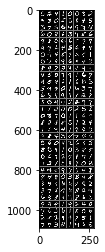

In [11]:
# 読み込んだ画像を表示する

# 読み込み関数を定義
def imshow(inp, title=None):
    inp = inp.numpy().transpose((1,2,0)) # 入力のテンソルをnumpy形式に変換してC*H*Wの並びからH*W*Cの並びに変換する
    mean = np.array([0.5, 0.5, 0.5]) # 後で標準化したデータをもとに戻すために使う平均値を格納
    std = np.array([0.5, 0.5, 0.5]) # 後で標準化したデータをもとに戻すために使う標準偏差を格納
    inp = std * inp + mean # 標準化したデータをもとに戻す
    inp = np.clip(inp, 0, 1) # 最小0、最大1の範囲にデータを収める https://note.nkmk.me/python-numpy-clip/
    plt.imshow(inp) # matplotlibで画像を表示　http://pynote.hatenablog.com/entry/matplotlib-imshow
    if title is not None:
        plt.title(title)
    plt.pause(0.001)

# dataloaderをイテレータオブジェクトにしてnextの要素を格納する
inputs = next(iter(dataloaders)) #https://algorithm.joho.info/programming/python/iter-next-py/

# inputs画像を使ってグリッドを生成する
out = torchvision.utils.make_grid(inputs) # https://blog.shikoan.com/torchvision-image-tile/
#print(len(inputs),
#      inputs.size())

imshow(out)
#print(classes)

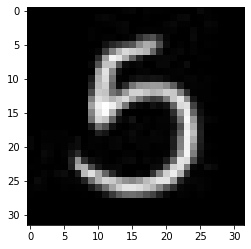

In [12]:
# 試しに画像を一つ表示してみる
imshow(inputs[0])

In [13]:
# custom weights initialization called on netG and netD
# ネットワークの重みを初期化する関数の定義
# netGならびにnetDに対して、applyで渡される関数であり、それぞれのネットワークのサブモジュールに対して実施される
# https://tutorialmore.com/questions-56844.htm
def weights_init(m):
    classname = m.__class__.__name__ # 定義されたクラスの元のクラス名を取得する　https://ja.stackoverflow.com/questions/4556/%E3%83%A1%E3%83%B3%E3%83%90%E9%96%A2%E6%95%B0%E3%81%8B%E3%82%89%E3%82%AF%E3%83%A9%E3%82%B9%E3%81%AE%E5%90%8D%E5%89%8D%E3%82%92%E5%8F%96%E5%BE%97%E3%81%99%E3%82%8B%E6%96%B9%E6%B3%95
    if classname.find('Conv') != -1: # classnameが含まれる場合の処理（.findで-1が返ってくると指定文字列は含まれていない） https://www.sejuku.net/blog/52207
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

In [14]:
# 潜在変数にGaussianを仮定し、そこからのサンプリング用のclass
# VAEは潜在空間にGaussianを仮定するため
# https://qiita.com/kenmatsu4/items/b029d697e9995d93aa24
# この部分がReparameterization Trickに該当する
# つまり、学習させるのは正規乱数のパラメータの方である
class _Sampler(nn.Module):
    def __init__(self):
        super(_Sampler, self).__init__()
        
    def forward(self,input):
        # inputは2要素のリストであり、index=0が平均値ベクトル、index=1が分散の対数となっている
        # Samplerはencoderの出力の結果である2つのベクトルを引数としてとるため、
        # 一方を平均ベクトル、もう一方を対数分散ベクトルとなるよう、重みをトレーニングする形となる
        mu = input[0]
        logvar = input[1] # 分散の対数
        
        std = logvar.mul(0.5).exp_() #calculate the STDEV
        if opt['cuda']:
            # epsにstdのサイズと同じサイズのtensorを作る
            # tensorの中身にはnormal_()でmean=0,std=1の正規分布に従う乱数を格納する
            # https://pytorch.org/docs/stable/tensors.html#torch.Tensor.normal_
            eps = torch.cuda.FloatTensor(std.size()).normal_() #random normalized noise
        else:
            # 上と同様
            eps = torch.FloatTensor(std.size()).normal_() #random normalized noise
        #eps = Variable(eps) # 自動微分を有効にするためVariableクラスでラップする必要があったが、0.4以降は特にいらない？　https://codezine.jp/article/detail/11052
        # 戻り値は標準正規分布乱数からmu,stdのパラメータに従う正規分布に戻したもの
        return eps.mul(std).add_(mu) 

In [15]:
# encoderの定義
class _Encoder(nn.Module):
    # 初期化関数
    # 引数に画像サイズをとる
    def __init__(self,imageSize):
        super(_Encoder, self).__init__()
        # 2を底とするXの対数を返す
        # 2^n = imageSize なので、imageSizeは2のx乗でなければならない
        # また、少なくとも3回は畳み込むのでimageSizeが8(2^3)でなければならない
        n = math.log2(imageSize)
        
        # 条件に合致しないときの処理
        assert n==round(n),'imageSize must be a power of 2'
        assert n>=3,'imageSize must be at least 8'
        # nを整数型に変換する
        n=int(n)

        # pytorchのConv2dについて
        # Conv2d(インプットのチャンネル数,アウトプットのチャンネル数,カーネルサイズ)
        # https://qiita.com/kazetof/items/6a72926b9f8cd44c218e#43-nnconv2d%E3%81%A8%E3%81%AF
        # more detail
        # https://pytorch.org/docs/stable/nn.html
        # (in_channels, out_channels, kernel_size, stride=1, padding=0, dilation=1, groups=1, bias=True, padding_mode='zeros')
        
        # ここではself.encoderの出力結果をチャネル数nzにして返す畳み込み層を定義している
        # forwardで二つのvectorを返している
        self.conv1 = nn.Conv2d(ngf * 2**(n-3), nz, 4) # (channel of Input, channel of output, kernel size)
        self.conv2 = nn.Conv2d(ngf * 2**(n-3), nz, 4) # (channel of Input, channel of output, kernel size)

        # encoderを畳み込み層-バッチノーマライゼーション-LeakyReLUの繰り返しで定義
        self.encoder = nn.Sequential()
        # input is (nc) x 64 x 64
        # https://pytorch.org/docs/stable/nn.html
        # (in_channels, out_channels, kernel_size, stride=1, padding=0, dilation=1, groups=1, bias=True, padding_mode='zeros')
        # 入力チャネル数=3, outputチャネル数=ngf, カーネルサイス=4, ストライド2, パディング=1
        # 出力サイズは ((H(W)+2P-Fh(Fn))/2)+1で計算できる
        # 入力サイズが64x64の時、出力サイズは32x32になる
        # 出力チャネル数はngfで定義（デフォルトで64）
        self.encoder.add_module('input-conv',nn.Conv2d(nc, ngf, 4, 2, 1, bias=False))
        # 活性化関数にLeakyReLUを使用、x<0のときの傾きを0.2に固定
        self.encoder.add_module('input-relu',nn.LeakyReLU(0.2, inplace=True))
        #self.encoder.add_module('input-relu',nn.ReLU())
        # 画像サイズが64x64のとき、64=2^5なのでn=6
        # その場合、0～2(6-3=3なので)の繰り返しとなる
        for i in range(n-3):
            # state size. (ngf) x 32 x 32
            # モジュールの名称をpyramid(入力チャネル数)-(出力チャネル数)としている
            # 入力チャネル数および出力チャネル数は記載の通り、ngfの2^i倍ずつ増えていく
            # カーネルサイズ、ストライド、パディングはずっと同じ、バイアスは使用しない
            self.encoder.add_module('pyramid_{0}-{1}_conv'.format(ngf*2**i, ngf * 2**(i+1)), nn.Conv2d(ngf*2**(i), ngf * 2**(i+1), 4, 2, 1, bias=False))
            self.encoder.add_module('pyramid_{0}_batchnorm'.format(ngf * 2**(i+1)), nn.BatchNorm2d(ngf * 2**(i+1)))
            self.encoder.add_module('pyramid_{0}_relu'.format(ngf * 2**(i+1)), nn.LeakyReLU(0.2, inplace=True))
            #self.encoder.add_module('pyramid_{0}_relu'.format(ngf * 2**(i+1)), nn.ReLU())
            # モジュールの繰り返しごとに画像サイズが半分になっていく
            # 最終的に4x4の画像になるようにnが調整されている
            # 最終的なチャネル数は2^(n-3)である。画像サイズ64x64の場合はngf*8となる

        # state size. (ngf*8) x 4 x 4

    # encoderで入力画像を(ngf*8) x 4 x 4に畳み込み
    # その出力をconv1,conv2にかけてnzのサイズの二つのベクトルに変換しreturn
    def forward(self,input):
        output = self.encoder(input)
        #return self.conv1(output)
        return [self.conv1(output),self.conv2(output)]

In [16]:
# Generative Model全体の定義
# decoder部分はencoderの逆を行う
class _netG(nn.Module):
    def __init__(self, imageSize, ngpu):
        super(_netG, self).__init__()
        self.ngpu = ngpu
        # すでに定義したEncoderとSamplerを定義
        self.encoder = _Encoder(imageSize)
        self.sampler = _Sampler()
        
        # encoderと同様に繰り返し回数nはimageSize=2^nとしたときのnとする
        # decoderではencoderの逆で倍々にupsamplingしていく
        n = math.log2(imageSize)
        
        # imageSizeが規定に満たないときの処理
        assert n==round(n),'imageSize must be a power of 2'
        assert n>=3,'imageSize must be at least 8'
        # forループを回すためにnを整数型に直す
        n=int(n)

        # decoderをencoderの逆として定義する
        # まず最初にサイズnzのベクトルを入力値に取り、４ｘ４画像に拡大する
        self.decoder = nn.Sequential()
        # input is Z, going into a convolution
        self.decoder.add_module('input-conv', nn.ConvTranspose2d(nz, ngf * 2**(n-3), 4, 1, 0, bias=False))
        self.decoder.add_module('input-batchnorm', nn.BatchNorm2d(ngf * 2**(n-3)))
        self.decoder.add_module('input-relu', nn.LeakyReLU(0.2, inplace=True))
        #self.decoder.add_module('input-relu', nn.ReLU())

        # state size. (ngf * 2**(n-3)) x 4 x 4

        # 入力チャネル数、出力チャネル数はencoderの逆
        # forループ内のコードはencoderと同じだが、rangeの定義が異なる
        for i in range(n-3, 0, -1):
            self.decoder.add_module('pyramid_{0}-{1}_conv'.format(ngf*2**i, ngf * 2**(i-1)),nn.ConvTranspose2d(ngf * 2**i, ngf * 2**(i-1), 4, 2, 1, bias=False))
            self.decoder.add_module('pyramid_{0}_batchnorm'.format(ngf * 2**(i-1)), nn.BatchNorm2d(ngf * 2**(i-1)))
            self.decoder.add_module('pyramid_{0}_relu'.format(ngf * 2**(i-1)), nn.LeakyReLU(0.2, inplace=True))
            #self.decoder.add_module('pyramid_{0}_relu'.format(ngf * 2**(i-1)), nn.ReLU())

        # 最終的に元のサイズに戻し、活性化関数tanhを通す
        self.decoder.add_module('ouput-conv', nn.ConvTranspose2d(    ngf,      nc, 4, 2, 1, bias=False))
        self.decoder.add_module('output-tanh', nn.Tanh())
        #self.decoder.add_module('output-sigmoid', nn.Sigmoid())

    # 順方向
    # endocer-sampler-decoderの順に流して最終結果を得る
    def forward(self, input):
        # GPUが使える場合
        if isinstance(input.data, torch.cuda.FloatTensor) and self.ngpu > 1:
            output = nn.parallel.data_parallel(self.encoder, input, range(self.ngpu))
            output = nn.parallel.data_parallel(self.sampler, output, range(self.ngpu))
            output = nn.parallel.data_parallel(self.decoder, output, range(self.ngpu))
        # GPUが使えない場合
        else:
            output = self.encoder(input)
            output = self.sampler(output)
            output = self.decoder(output)
        return output
    # GPUが使える場合に備えてencoder,sampler,decoderをcuda用に変換する関数
    # インスタンス化する際に登場する
    def make_cuda(self):
        self.encoder.cuda()
        self.sampler.cuda()
        self.decoder.cuda()

In [17]:
# 生成ネットワークの定義
netG = _netG(opt['imageSize'],ngpu)
# applyはnetG内でselfで定義されたサブモジュールに対して(fn)の関数を適用する
# この場合はweights_initなので、重みの初期化を全サブモジュールに対して適用している
netG.apply(weights_init)
# すでに何らかの学習が行われておりnetGが空でない場合はすでにあるnetGから読み込みを行う
if opt['netG'] != '':
    netG.load_state_dict(torch.load(opt['netG']))
print(netG)

_netG(
  (encoder): _Encoder(
    (conv1): Conv2d(128, 100, kernel_size=(4, 4), stride=(1, 1))
    (conv2): Conv2d(128, 100, kernel_size=(4, 4), stride=(1, 1))
    (encoder): Sequential(
      (input-conv): Conv2d(1, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (input-relu): LeakyReLU(negative_slope=0.2, inplace=True)
      (pyramid_32-64_conv): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (pyramid_64_batchnorm): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (pyramid_64_relu): LeakyReLU(negative_slope=0.2, inplace=True)
      (pyramid_64-128_conv): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (pyramid_128_batchnorm): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (pyramid_128_relu): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (sampler): _Sampler()
  (decoder): Sequential(
    (input-conv): 

In [18]:
# Discriminatorモデルの定義
class _netD(nn.Module):
    def __init__(self, imageSize, ngpu):
        super(_netD, self).__init__()
        self.ngpu = ngpu
        # こちらも同じようにimageSize=2^nを定義する
        n = math.log2(imageSize)
        
        # 画像サイズが規定外だったときの処理
        assert n==round(n),'imageSize must be a power of 2'
        assert n>=3,'imageSize must be at least 8'
        n=int(n)
        
        # 以下でモデルの定義を行う
        self.main = nn.Sequential()

        # input is (nc) x 64 x 64
        # ここから画像サイズが半分ずつになっていく
        # ndfはDiscriminator用の出力チャネル数
        # デフォルトの場合、おおもとの入力チャネル数nc=3、最初の出力チャネル数ndf=64
        self.main.add_module('input-conv', nn.Conv2d(nc, ndf, 4, 2, 1, bias=False))
        #self.main.add_module('relu', nn.LeakyReLU(0.2, inplace=True))
        self.main.add_module('relu', nn.ReLU())

        # state size. (ndf) x 32 x 32
        # 64x64の場合、n=6なので、0,1,2の繰り返し
        # 32x32-16x16-8x8-4x4となり、このループの中では画像サイズが4x4になる
        # ngfとなっているところはndfのtypo?
        for i in range(n-3):
            self.main.add_module('pyramid_{0}-{1}_conv'.format(ngf*2**(i), ngf * 2**(i+1)), nn.Conv2d(ndf * 2 ** (i), ndf * 2 ** (i+1), 4, 2, 1, bias=False))
            self.main.add_module('pyramid_{0}_batchnorm'.format(ngf * 2**(i+1)), nn.BatchNorm2d(ndf * 2 ** (i+1)))
            #self.main.add_module('pyramid_{0}_relu'.format(ngf * 2**(i+1)), nn.LeakyReLU(0.2, inplace=True))
            self.main.add_module('pyramid_{0}_relu'.format(ngf * 2**(i+1)), nn.ReLU())

        # 最後の層で出力チャネル数1、シグモイド関数にかける
        self.main.add_module('output-conv', nn.Conv2d(ndf * 2**(n-3), 1, 4, 1, 0, bias=False))
        self.main.add_module('output-sigmoid', nn.Sigmoid())
        

    # 順方向、書いてあるそのまま
    def forward(self, input):
        if isinstance(input.data, torch.cuda.FloatTensor) and self.ngpu > 1:
            output = nn.parallel.data_parallel(self.main, input, range(self.ngpu))
        else:
            output = self.main(input)

        return output.view(-1, 1)

In [19]:
# netGと同じように定義
netD = _netD(opt['imageSize'],ngpu)
netD.apply(weights_init)
if opt['netD'] != '':
    netD.load_state_dict(torch.load(opt.netD))
print(netD)

_netD(
  (main): Sequential(
    (input-conv): Conv2d(1, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (relu): ReLU()
    (pyramid_32-64_conv): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (pyramid_64_batchnorm): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (pyramid_64_relu): ReLU()
    (pyramid_64-128_conv): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (pyramid_128_batchnorm): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (pyramid_128_relu): ReLU()
    (output-conv): Conv2d(128, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (output-sigmoid): Sigmoid()
  )
)


In [20]:
# 損失関数にはそれぞれBCELoss(Binary Cross Entropy Loss)とMSELoss(Mean Square Error)を使う
# https://pytorch.org/docs/stable/nn.html
# 必要におうじてもっと詳しく調べること
criterion = nn.BCELoss(reduction = 'sum')

# reduction = 'sum' としないとMSEが平均値になってしまって学習が進まないので、reductionをsumにする必要があった
# https://qiita.com/illumination-k/items/d72bde2d631471bbd72c
MSECriterion = nn.MSELoss(reduction = 'sum')

In [21]:
# 入力値のサイズを設定
input = torch.FloatTensor(opt['batchSize'], nc, opt['imageSize'], opt['imageSize'])

In [22]:
# GPUが使える場合はすでに設定したモデル、変数をcuda用に変換しておく
if opt['cuda']:
    #netD.cuda()
    netG.make_cuda()
    criterion.cuda()
    MSECriterion.cuda()
    input = input.cuda()
    #noise, fixed_noise = noise.cuda(), fixed_noise.cuda()

In [23]:
# 自動微分用にVariableクラスに変換
# 現在は必要ないか？
#input = Variable(input)
#label = Variable(label)
#noise = Variable(noise)
#fixed_noise = Variable(fixed_noise)

In [24]:
# setup optimizer
# 最適化法はnetD,netGいずれもAdamとする
#optimizerD = optim.Adam(netD.parameters(), lr=opt['lr'], betas=(opt['beta1'], 0.999))
#optimizerG = optim.Adam(netG.parameters(), lr=opt['lr'], betas=(opt['beta1'], 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=opt['lr'])

In [25]:
gen_win = None
rec_win = None

[0/200][0/165] Loss_VAE: 899.3227 KLD: 33.7473 MSE: 865.5754
[0/200][20/165] Loss_VAE: 562.6732 KLD: 14.9106 MSE: 547.7626
[0/200][40/165] Loss_VAE: 391.9263 KLD: 13.9134 MSE: 378.0129
[0/200][60/165] Loss_VAE: 291.9278 KLD: 17.5457 MSE: 274.3821
[0/200][80/165] Loss_VAE: 232.3356 KLD: 21.4941 MSE: 210.8415
[0/200][100/165] Loss_VAE: 194.4229 KLD: 24.1144 MSE: 170.3085
[0/200][120/165] Loss_VAE: 168.7761 KLD: 26.0719 MSE: 142.7041
[0/200][140/165] Loss_VAE: 155.1556 KLD: 27.6890 MSE: 127.4666
[0/200][160/165] Loss_VAE: 142.9292 KLD: 29.1643 MSE: 113.7649


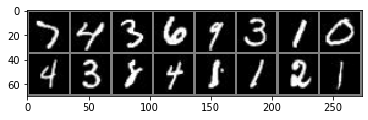

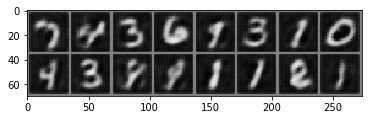

[1/200][0/165] Loss_VAE: 141.1888 KLD: 30.1079 MSE: 111.0808
[1/200][20/165] Loss_VAE: 130.9118 KLD: 29.6127 MSE: 101.2990
[1/200][40/165] Loss_VAE: 123.7336 KLD: 31.3394 MSE: 92.3941
[1/200][60/165] Loss_VAE: 117.8802 KLD: 31.6729 MSE: 86.2073
[1/200][80/165] Loss_VAE: 110.9301 KLD: 32.3004 MSE: 78.6297
[1/200][100/165] Loss_VAE: 106.9913 KLD: 32.0907 MSE: 74.9006
[1/200][120/165] Loss_VAE: 105.9532 KLD: 32.8695 MSE: 73.0837
[1/200][140/165] Loss_VAE: 102.2333 KLD: 33.1643 MSE: 69.0690
[1/200][160/165] Loss_VAE: 95.9183 KLD: 33.4254 MSE: 62.4929


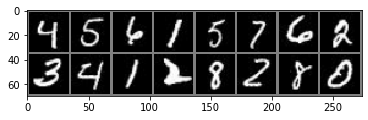

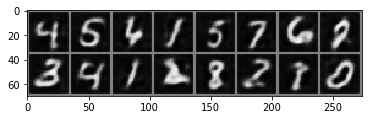

[2/200][0/165] Loss_VAE: 97.4658 KLD: 32.9016 MSE: 64.5643
[2/200][20/165] Loss_VAE: 94.9707 KLD: 33.0303 MSE: 61.9403
[2/200][40/165] Loss_VAE: 93.4563 KLD: 33.4395 MSE: 60.0169
[2/200][60/165] Loss_VAE: 90.4189 KLD: 33.1440 MSE: 57.2749
[2/200][80/165] Loss_VAE: 86.4364 KLD: 32.9277 MSE: 53.5086
[2/200][100/165] Loss_VAE: 85.4350 KLD: 32.4096 MSE: 53.0255
[2/200][120/165] Loss_VAE: 84.5341 KLD: 33.3972 MSE: 51.1368
[2/200][140/165] Loss_VAE: 82.7360 KLD: 32.5683 MSE: 50.1677
[2/200][160/165] Loss_VAE: 83.6815 KLD: 33.0977 MSE: 50.5838


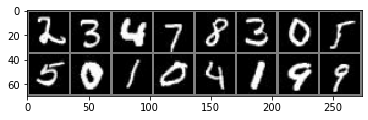

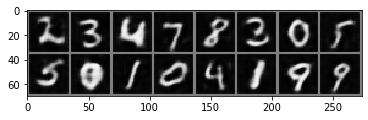

[3/200][0/165] Loss_VAE: 83.5319 KLD: 33.0554 MSE: 50.4765
[3/200][20/165] Loss_VAE: 81.9617 KLD: 32.5933 MSE: 49.3684
[3/200][40/165] Loss_VAE: 78.9054 KLD: 31.9089 MSE: 46.9965
[3/200][60/165] Loss_VAE: 78.3744 KLD: 32.3128 MSE: 46.0616
[3/200][80/165] Loss_VAE: 77.3331 KLD: 32.0573 MSE: 45.2758
[3/200][100/165] Loss_VAE: 75.4952 KLD: 32.2038 MSE: 43.2914
[3/200][120/165] Loss_VAE: 77.0413 KLD: 31.6175 MSE: 45.4238
[3/200][140/165] Loss_VAE: 74.5325 KLD: 32.5435 MSE: 41.9890
[3/200][160/165] Loss_VAE: 75.5891 KLD: 33.0329 MSE: 42.5562


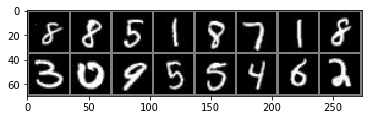

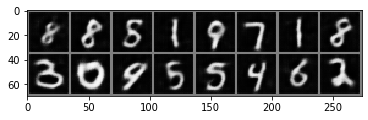

[4/200][0/165] Loss_VAE: 74.5760 KLD: 32.6656 MSE: 41.9103
[4/200][20/165] Loss_VAE: 73.3576 KLD: 32.2696 MSE: 41.0880
[4/200][40/165] Loss_VAE: 71.8291 KLD: 32.0018 MSE: 39.8272
[4/200][60/165] Loss_VAE: 71.1299 KLD: 32.0050 MSE: 39.1250
[4/200][80/165] Loss_VAE: 72.4394 KLD: 32.1702 MSE: 40.2692
[4/200][100/165] Loss_VAE: 73.0538 KLD: 32.1697 MSE: 40.8841
[4/200][120/165] Loss_VAE: 71.7799 KLD: 32.0687 MSE: 39.7112
[4/200][140/165] Loss_VAE: 69.9778 KLD: 31.9498 MSE: 38.0279
[4/200][160/165] Loss_VAE: 68.5618 KLD: 31.4315 MSE: 37.1303


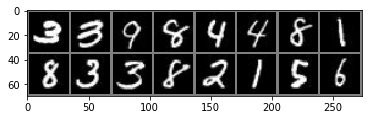

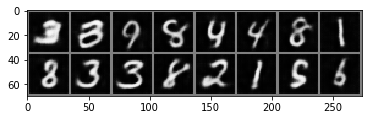

[5/200][0/165] Loss_VAE: 71.5426 KLD: 31.6370 MSE: 39.9056
[5/200][20/165] Loss_VAE: 71.2473 KLD: 32.4512 MSE: 38.7961
[5/200][40/165] Loss_VAE: 69.9485 KLD: 32.5355 MSE: 37.4129
[5/200][60/165] Loss_VAE: 67.9611 KLD: 32.8769 MSE: 35.0842
[5/200][80/165] Loss_VAE: 68.6366 KLD: 31.6985 MSE: 36.9381
[5/200][100/165] Loss_VAE: 67.4511 KLD: 31.6829 MSE: 35.7682
[5/200][120/165] Loss_VAE: 68.9067 KLD: 32.6145 MSE: 36.2922
[5/200][140/165] Loss_VAE: 67.3664 KLD: 31.1621 MSE: 36.2043
[5/200][160/165] Loss_VAE: 67.5822 KLD: 31.6519 MSE: 35.9304


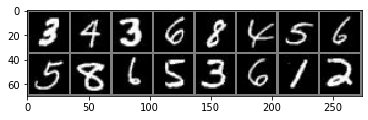

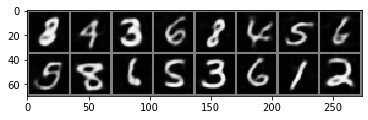

[6/200][0/165] Loss_VAE: 69.9382 KLD: 32.6420 MSE: 37.2963
[6/200][20/165] Loss_VAE: 66.3547 KLD: 31.8407 MSE: 34.5140
[6/200][40/165] Loss_VAE: 66.6575 KLD: 32.0478 MSE: 34.6097
[6/200][60/165] Loss_VAE: 66.7211 KLD: 31.4018 MSE: 35.3193
[6/200][80/165] Loss_VAE: 66.4045 KLD: 31.8641 MSE: 34.5405
[6/200][100/165] Loss_VAE: 66.4088 KLD: 31.7976 MSE: 34.6112
[6/200][120/165] Loss_VAE: 67.1337 KLD: 32.2573 MSE: 34.8764
[6/200][140/165] Loss_VAE: 66.1017 KLD: 31.3718 MSE: 34.7299
[6/200][160/165] Loss_VAE: 66.0715 KLD: 31.9443 MSE: 34.1272


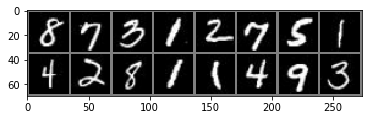

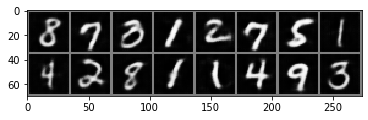

[7/200][0/165] Loss_VAE: 65.0240 KLD: 31.7294 MSE: 33.2946
[7/200][20/165] Loss_VAE: 65.1392 KLD: 31.9528 MSE: 33.1864
[7/200][40/165] Loss_VAE: 64.8929 KLD: 31.5225 MSE: 33.3704
[7/200][60/165] Loss_VAE: 66.2278 KLD: 32.2301 MSE: 33.9977
[7/200][80/165] Loss_VAE: 64.6407 KLD: 31.3051 MSE: 33.3356
[7/200][100/165] Loss_VAE: 64.2046 KLD: 31.2421 MSE: 32.9625
[7/200][120/165] Loss_VAE: 66.4486 KLD: 31.7713 MSE: 34.6773
[7/200][140/165] Loss_VAE: 62.9814 KLD: 31.5759 MSE: 31.4055
[7/200][160/165] Loss_VAE: 65.0157 KLD: 31.6561 MSE: 33.3597


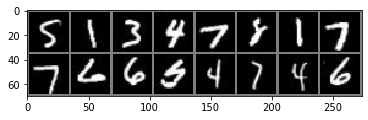

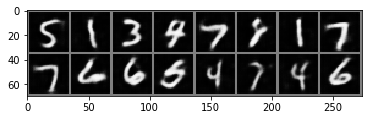

[8/200][0/165] Loss_VAE: 66.5099 KLD: 31.6985 MSE: 34.8114
[8/200][20/165] Loss_VAE: 64.7147 KLD: 31.0135 MSE: 33.7012
[8/200][40/165] Loss_VAE: 64.0047 KLD: 31.1731 MSE: 32.8316
[8/200][60/165] Loss_VAE: 64.3904 KLD: 31.5064 MSE: 32.8840
[8/200][80/165] Loss_VAE: 65.1943 KLD: 31.3556 MSE: 33.8388
[8/200][100/165] Loss_VAE: 63.5840 KLD: 31.4153 MSE: 32.1687
[8/200][120/165] Loss_VAE: 62.1683 KLD: 30.9021 MSE: 31.2661
[8/200][140/165] Loss_VAE: 64.5737 KLD: 31.5587 MSE: 33.0149
[8/200][160/165] Loss_VAE: 62.9832 KLD: 31.5408 MSE: 31.4424


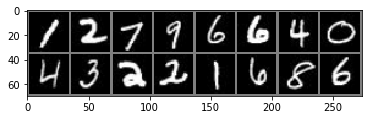

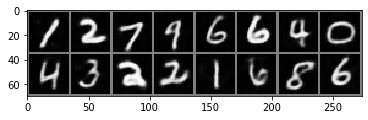

[9/200][0/165] Loss_VAE: 63.6161 KLD: 31.3069 MSE: 32.3092
[9/200][20/165] Loss_VAE: 61.9250 KLD: 31.2928 MSE: 30.6322
[9/200][40/165] Loss_VAE: 62.6599 KLD: 30.5234 MSE: 32.1365
[9/200][60/165] Loss_VAE: 63.9142 KLD: 31.4147 MSE: 32.4995
[9/200][80/165] Loss_VAE: 63.9735 KLD: 32.2519 MSE: 31.7216
[9/200][100/165] Loss_VAE: 61.8964 KLD: 30.1702 MSE: 31.7261
[9/200][120/165] Loss_VAE: 62.7004 KLD: 30.9027 MSE: 31.7977
[9/200][140/165] Loss_VAE: 64.9574 KLD: 31.5152 MSE: 33.4422
[9/200][160/165] Loss_VAE: 60.6616 KLD: 31.0490 MSE: 29.6125


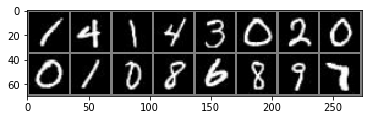

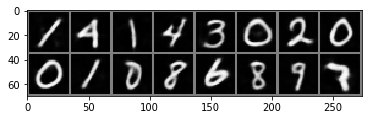

[10/200][0/165] Loss_VAE: 64.5887 KLD: 31.7305 MSE: 32.8581
[10/200][20/165] Loss_VAE: 61.1109 KLD: 30.9295 MSE: 30.1814
[10/200][40/165] Loss_VAE: 63.2981 KLD: 31.8029 MSE: 31.4952
[10/200][60/165] Loss_VAE: 62.6170 KLD: 31.2085 MSE: 31.4085
[10/200][80/165] Loss_VAE: 62.4227 KLD: 31.6496 MSE: 30.7732
[10/200][100/165] Loss_VAE: 63.5506 KLD: 31.1972 MSE: 32.3533
[10/200][120/165] Loss_VAE: 62.0888 KLD: 31.1833 MSE: 30.9055
[10/200][140/165] Loss_VAE: 62.6220 KLD: 30.8002 MSE: 31.8218
[10/200][160/165] Loss_VAE: 62.9651 KLD: 31.2629 MSE: 31.7022


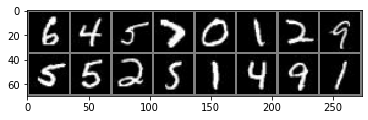

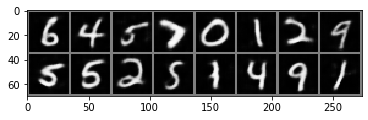

[11/200][0/165] Loss_VAE: 61.3997 KLD: 31.2275 MSE: 30.1722
[11/200][20/165] Loss_VAE: 62.4079 KLD: 31.3638 MSE: 31.0441
[11/200][40/165] Loss_VAE: 60.1765 KLD: 30.5461 MSE: 29.6303
[11/200][60/165] Loss_VAE: 59.6958 KLD: 30.3139 MSE: 29.3819
[11/200][80/165] Loss_VAE: 62.2945 KLD: 31.3191 MSE: 30.9754
[11/200][100/165] Loss_VAE: 61.4519 KLD: 31.3992 MSE: 30.0527
[11/200][120/165] Loss_VAE: 61.9268 KLD: 30.9005 MSE: 31.0263
[11/200][140/165] Loss_VAE: 61.3157 KLD: 30.9365 MSE: 30.3792
[11/200][160/165] Loss_VAE: 61.5549 KLD: 31.3768 MSE: 30.1781


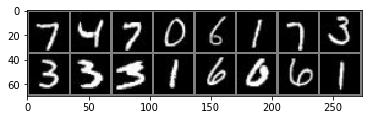

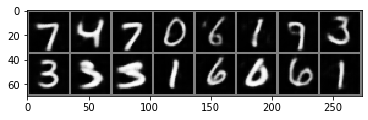

[12/200][0/165] Loss_VAE: 61.6942 KLD: 30.8105 MSE: 30.8837
[12/200][20/165] Loss_VAE: 61.3595 KLD: 31.3208 MSE: 30.0387
[12/200][40/165] Loss_VAE: 64.1051 KLD: 31.6884 MSE: 32.4167
[12/200][60/165] Loss_VAE: 61.5571 KLD: 30.9350 MSE: 30.6221
[12/200][80/165] Loss_VAE: 61.2285 KLD: 31.2870 MSE: 29.9414
[12/200][100/165] Loss_VAE: 62.0513 KLD: 31.3764 MSE: 30.6749
[12/200][120/165] Loss_VAE: 60.7279 KLD: 31.5753 MSE: 29.1526
[12/200][140/165] Loss_VAE: 61.1909 KLD: 31.0090 MSE: 30.1818
[12/200][160/165] Loss_VAE: 59.6218 KLD: 30.5028 MSE: 29.1190


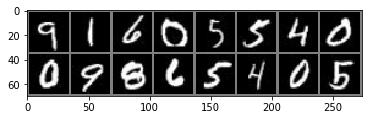

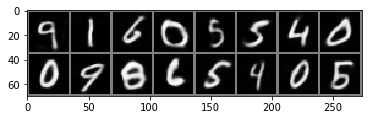

[13/200][0/165] Loss_VAE: 61.4685 KLD: 30.4380 MSE: 31.0305
[13/200][20/165] Loss_VAE: 61.4446 KLD: 30.9292 MSE: 30.5154
[13/200][40/165] Loss_VAE: 62.2752 KLD: 30.9010 MSE: 31.3742
[13/200][60/165] Loss_VAE: 61.2714 KLD: 31.2777 MSE: 29.9936
[13/200][80/165] Loss_VAE: 63.6154 KLD: 31.5928 MSE: 32.0226
[13/200][100/165] Loss_VAE: 60.7370 KLD: 30.6124 MSE: 30.1247
[13/200][120/165] Loss_VAE: 59.7532 KLD: 30.6180 MSE: 29.1352
[13/200][140/165] Loss_VAE: 62.2998 KLD: 31.4211 MSE: 30.8788
[13/200][160/165] Loss_VAE: 61.8730 KLD: 31.4570 MSE: 30.4160


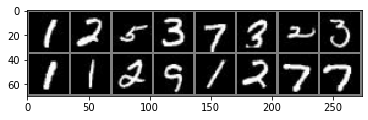

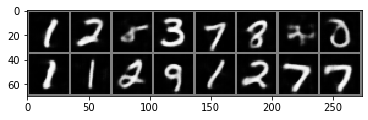

[14/200][0/165] Loss_VAE: 61.4533 KLD: 31.0744 MSE: 30.3789
[14/200][20/165] Loss_VAE: 61.3216 KLD: 30.5647 MSE: 30.7568
[14/200][40/165] Loss_VAE: 61.9420 KLD: 31.2248 MSE: 30.7172
[14/200][60/165] Loss_VAE: 61.6048 KLD: 31.5788 MSE: 30.0260
[14/200][80/165] Loss_VAE: 59.3255 KLD: 30.8044 MSE: 28.5211
[14/200][100/165] Loss_VAE: 59.5634 KLD: 31.1147 MSE: 28.4487
[14/200][120/165] Loss_VAE: 60.8804 KLD: 30.3320 MSE: 30.5484
[14/200][140/165] Loss_VAE: 59.9328 KLD: 30.5860 MSE: 29.3467
[14/200][160/165] Loss_VAE: 60.0092 KLD: 30.8891 MSE: 29.1200


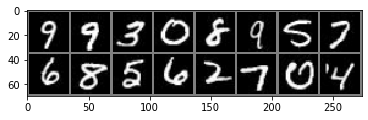

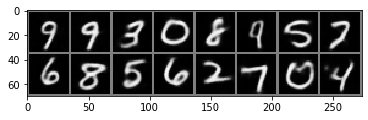

[15/200][0/165] Loss_VAE: 60.1943 KLD: 30.6903 MSE: 29.5040
[15/200][20/165] Loss_VAE: 59.2289 KLD: 30.7630 MSE: 28.4659
[15/200][40/165] Loss_VAE: 59.7172 KLD: 30.5986 MSE: 29.1186
[15/200][60/165] Loss_VAE: 58.5863 KLD: 30.3211 MSE: 28.2652
[15/200][80/165] Loss_VAE: 59.1723 KLD: 31.0890 MSE: 28.0833
[15/200][100/165] Loss_VAE: 59.6492 KLD: 30.4052 MSE: 29.2440
[15/200][120/165] Loss_VAE: 60.7936 KLD: 31.0283 MSE: 29.7653
[15/200][140/165] Loss_VAE: 59.2094 KLD: 31.1431 MSE: 28.0664
[15/200][160/165] Loss_VAE: 58.4979 KLD: 30.3143 MSE: 28.1837


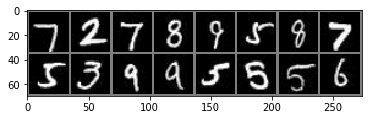

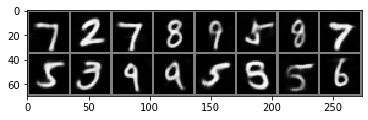

[16/200][0/165] Loss_VAE: 60.9412 KLD: 30.7024 MSE: 30.2388
[16/200][20/165] Loss_VAE: 57.9612 KLD: 29.9949 MSE: 27.9663
[16/200][40/165] Loss_VAE: 58.6669 KLD: 30.2361 MSE: 28.4308
[16/200][60/165] Loss_VAE: 60.1119 KLD: 31.0143 MSE: 29.0977
[16/200][80/165] Loss_VAE: 58.0434 KLD: 30.0809 MSE: 27.9625
[16/200][100/165] Loss_VAE: 59.6886 KLD: 30.6789 MSE: 29.0097
[16/200][120/165] Loss_VAE: 60.5094 KLD: 30.9210 MSE: 29.5885
[16/200][140/165] Loss_VAE: 59.4822 KLD: 30.5396 MSE: 28.9426
[16/200][160/165] Loss_VAE: 59.7670 KLD: 30.3732 MSE: 29.3938


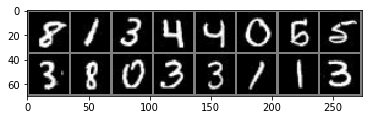

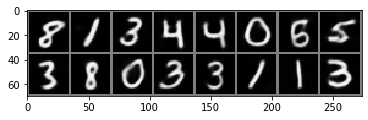

[17/200][0/165] Loss_VAE: 58.8750 KLD: 31.0436 MSE: 27.8315
[17/200][20/165] Loss_VAE: 59.1837 KLD: 30.5503 MSE: 28.6334
[17/200][40/165] Loss_VAE: 58.0775 KLD: 29.4519 MSE: 28.6256
[17/200][60/165] Loss_VAE: 58.4519 KLD: 30.5331 MSE: 27.9188
[17/200][80/165] Loss_VAE: 57.4370 KLD: 29.6092 MSE: 27.8278
[17/200][100/165] Loss_VAE: 58.5304 KLD: 30.1903 MSE: 28.3401
[17/200][120/165] Loss_VAE: 59.2917 KLD: 30.8008 MSE: 28.4909
[17/200][140/165] Loss_VAE: 60.0385 KLD: 30.6583 MSE: 29.3802
[17/200][160/165] Loss_VAE: 56.6750 KLD: 29.9541 MSE: 26.7209


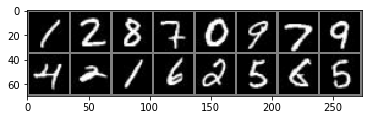

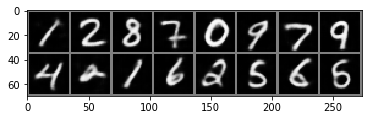

[18/200][0/165] Loss_VAE: 59.8697 KLD: 31.0033 MSE: 28.8665
[18/200][20/165] Loss_VAE: 58.8779 KLD: 30.0321 MSE: 28.8459
[18/200][40/165] Loss_VAE: 58.1765 KLD: 30.0782 MSE: 28.0983
[18/200][60/165] Loss_VAE: 55.5217 KLD: 29.2872 MSE: 26.2345
[18/200][80/165] Loss_VAE: 58.1541 KLD: 30.2097 MSE: 27.9444
[18/200][100/165] Loss_VAE: 58.3144 KLD: 29.6272 MSE: 28.6872
[18/200][120/165] Loss_VAE: 59.8003 KLD: 30.4725 MSE: 29.3278
[18/200][140/165] Loss_VAE: 59.5374 KLD: 31.5157 MSE: 28.0217
[18/200][160/165] Loss_VAE: 58.3565 KLD: 30.8189 MSE: 27.5376


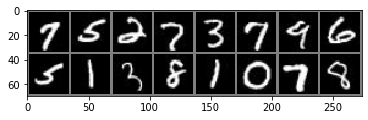

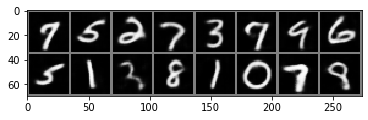

[19/200][0/165] Loss_VAE: 58.3857 KLD: 30.2007 MSE: 28.1850
[19/200][20/165] Loss_VAE: 58.5966 KLD: 30.4942 MSE: 28.1024
[19/200][40/165] Loss_VAE: 57.4114 KLD: 29.7077 MSE: 27.7037
[19/200][60/165] Loss_VAE: 57.2435 KLD: 29.7531 MSE: 27.4904
[19/200][80/165] Loss_VAE: 57.8015 KLD: 30.0014 MSE: 27.8001
[19/200][100/165] Loss_VAE: 58.3759 KLD: 30.1360 MSE: 28.2399
[19/200][120/165] Loss_VAE: 58.8438 KLD: 29.6817 MSE: 29.1621
[19/200][140/165] Loss_VAE: 58.0306 KLD: 30.3212 MSE: 27.7094
[19/200][160/165] Loss_VAE: 57.4068 KLD: 30.2168 MSE: 27.1900


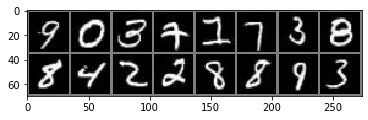

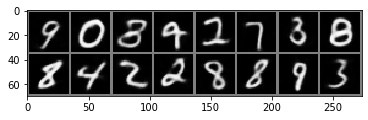

[20/200][0/165] Loss_VAE: 58.7007 KLD: 30.5705 MSE: 28.1302
[20/200][20/165] Loss_VAE: 58.3324 KLD: 30.0853 MSE: 28.2471
[20/200][40/165] Loss_VAE: 57.5994 KLD: 30.7035 MSE: 26.8959
[20/200][60/165] Loss_VAE: 58.3312 KLD: 30.7214 MSE: 27.6098
[20/200][80/165] Loss_VAE: 57.9103 KLD: 29.9953 MSE: 27.9149
[20/200][100/165] Loss_VAE: 57.9896 KLD: 30.5009 MSE: 27.4888
[20/200][120/165] Loss_VAE: 59.8455 KLD: 30.2472 MSE: 29.5983
[20/200][140/165] Loss_VAE: 58.5448 KLD: 30.2662 MSE: 28.2787
[20/200][160/165] Loss_VAE: 57.9208 KLD: 29.9769 MSE: 27.9439


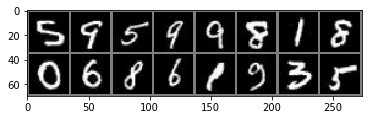

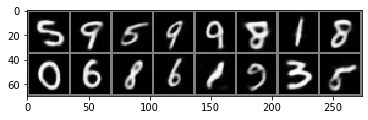

[21/200][0/165] Loss_VAE: 58.7014 KLD: 31.3243 MSE: 27.3771
[21/200][20/165] Loss_VAE: 56.7293 KLD: 30.1961 MSE: 26.5332
[21/200][40/165] Loss_VAE: 58.2811 KLD: 30.5115 MSE: 27.7696
[21/200][60/165] Loss_VAE: 57.7300 KLD: 30.2075 MSE: 27.5225
[21/200][80/165] Loss_VAE: 59.0158 KLD: 29.7026 MSE: 29.3133
[21/200][100/165] Loss_VAE: 56.1322 KLD: 29.2781 MSE: 26.8540
[21/200][120/165] Loss_VAE: 56.4802 KLD: 29.8291 MSE: 26.6511
[21/200][140/165] Loss_VAE: 56.0864 KLD: 29.3037 MSE: 26.7827
[21/200][160/165] Loss_VAE: 58.1030 KLD: 30.3778 MSE: 27.7252


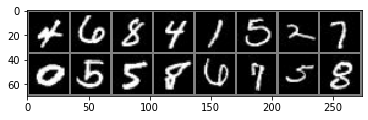

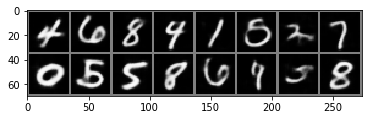

[22/200][0/165] Loss_VAE: 56.7424 KLD: 29.1070 MSE: 27.6354
[22/200][20/165] Loss_VAE: 57.4673 KLD: 29.6317 MSE: 27.8356
[22/200][40/165] Loss_VAE: 58.4723 KLD: 30.9171 MSE: 27.5552
[22/200][60/165] Loss_VAE: 57.0433 KLD: 30.0462 MSE: 26.9971
[22/200][80/165] Loss_VAE: 59.0066 KLD: 30.6688 MSE: 28.3378
[22/200][100/165] Loss_VAE: 56.7389 KLD: 30.2728 MSE: 26.4662
[22/200][120/165] Loss_VAE: 58.5005 KLD: 30.9864 MSE: 27.5141
[22/200][140/165] Loss_VAE: 58.7285 KLD: 30.1581 MSE: 28.5705
[22/200][160/165] Loss_VAE: 57.0061 KLD: 30.1058 MSE: 26.9003


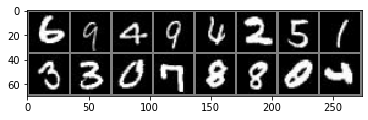

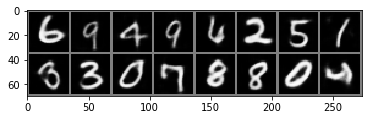

[23/200][0/165] Loss_VAE: 57.8242 KLD: 29.9689 MSE: 27.8553
[23/200][20/165] Loss_VAE: 56.4207 KLD: 29.9590 MSE: 26.4617
[23/200][40/165] Loss_VAE: 56.9239 KLD: 30.0805 MSE: 26.8434
[23/200][60/165] Loss_VAE: 58.0913 KLD: 30.4523 MSE: 27.6390
[23/200][80/165] Loss_VAE: 56.7501 KLD: 29.4482 MSE: 27.3020
[23/200][100/165] Loss_VAE: 57.4533 KLD: 28.9992 MSE: 28.4542
[23/200][120/165] Loss_VAE: 56.0791 KLD: 29.7112 MSE: 26.3679
[23/200][140/165] Loss_VAE: 57.3851 KLD: 30.1765 MSE: 27.2086
[23/200][160/165] Loss_VAE: 56.1094 KLD: 29.6491 MSE: 26.4602


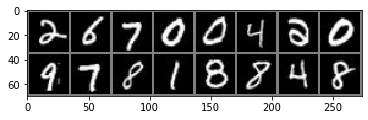

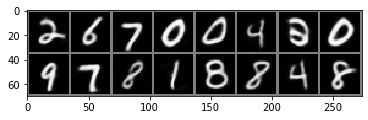

[24/200][0/165] Loss_VAE: 56.4880 KLD: 30.0042 MSE: 26.4839
[24/200][20/165] Loss_VAE: 56.4434 KLD: 29.5314 MSE: 26.9121
[24/200][40/165] Loss_VAE: 57.2216 KLD: 29.9836 MSE: 27.2380
[24/200][60/165] Loss_VAE: 57.3645 KLD: 29.6474 MSE: 27.7171
[24/200][80/165] Loss_VAE: 56.9061 KLD: 29.4149 MSE: 27.4912
[24/200][100/165] Loss_VAE: 58.8589 KLD: 29.9973 MSE: 28.8616
[24/200][120/165] Loss_VAE: 54.6893 KLD: 28.7365 MSE: 25.9527
[24/200][140/165] Loss_VAE: 57.3150 KLD: 30.1126 MSE: 27.2024
[24/200][160/165] Loss_VAE: 56.6537 KLD: 29.6120 MSE: 27.0417


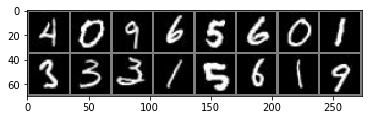

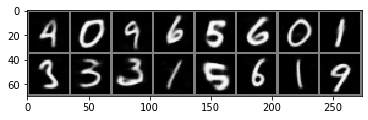

[25/200][0/165] Loss_VAE: 57.1312 KLD: 30.0291 MSE: 27.1022
[25/200][20/165] Loss_VAE: 57.4553 KLD: 30.2599 MSE: 27.1954
[25/200][40/165] Loss_VAE: 56.5250 KLD: 29.9073 MSE: 26.6176
[25/200][60/165] Loss_VAE: 57.3500 KLD: 30.2424 MSE: 27.1077
[25/200][80/165] Loss_VAE: 55.1263 KLD: 29.3183 MSE: 25.8080
[25/200][100/165] Loss_VAE: 55.7363 KLD: 30.0190 MSE: 25.7173
[25/200][120/165] Loss_VAE: 57.7830 KLD: 29.8989 MSE: 27.8840
[25/200][140/165] Loss_VAE: 55.3019 KLD: 29.4955 MSE: 25.8065
[25/200][160/165] Loss_VAE: 58.2235 KLD: 30.5565 MSE: 27.6670


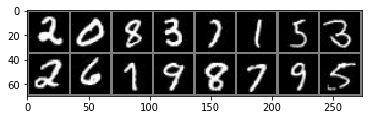

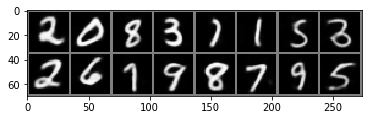

[26/200][0/165] Loss_VAE: 55.9767 KLD: 29.3330 MSE: 26.6437
[26/200][20/165] Loss_VAE: 56.8525 KLD: 29.8192 MSE: 27.0332
[26/200][40/165] Loss_VAE: 56.6611 KLD: 29.7592 MSE: 26.9019
[26/200][60/165] Loss_VAE: 57.0959 KLD: 29.5605 MSE: 27.5353
[26/200][80/165] Loss_VAE: 55.9032 KLD: 29.1063 MSE: 26.7968
[26/200][100/165] Loss_VAE: 57.5118 KLD: 30.3198 MSE: 27.1920
[26/200][120/165] Loss_VAE: 57.0929 KLD: 30.0752 MSE: 27.0176
[26/200][140/165] Loss_VAE: 57.1557 KLD: 29.9099 MSE: 27.2458
[26/200][160/165] Loss_VAE: 57.3965 KLD: 30.2788 MSE: 27.1177


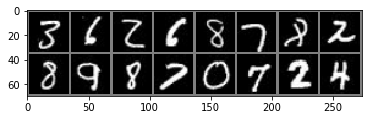

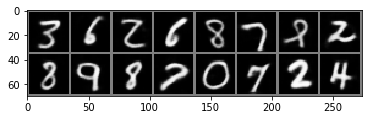

[27/200][0/165] Loss_VAE: 57.2826 KLD: 29.3965 MSE: 27.8862
[27/200][20/165] Loss_VAE: 57.5240 KLD: 30.7104 MSE: 26.8136
[27/200][40/165] Loss_VAE: 56.3559 KLD: 29.3576 MSE: 26.9984
[27/200][60/165] Loss_VAE: 56.2745 KLD: 29.4602 MSE: 26.8143
[27/200][80/165] Loss_VAE: 56.0863 KLD: 29.7502 MSE: 26.3361
[27/200][100/165] Loss_VAE: 58.0830 KLD: 30.7414 MSE: 27.3416
[27/200][120/165] Loss_VAE: 56.7183 KLD: 29.7374 MSE: 26.9809
[27/200][140/165] Loss_VAE: 56.6205 KLD: 29.6158 MSE: 27.0047
[27/200][160/165] Loss_VAE: 55.8062 KLD: 29.5697 MSE: 26.2365


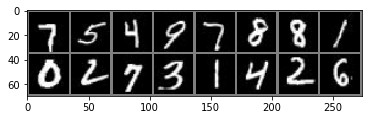

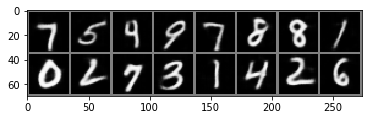

[28/200][0/165] Loss_VAE: 55.8732 KLD: 29.4821 MSE: 26.3911
[28/200][20/165] Loss_VAE: 55.8030 KLD: 29.2870 MSE: 26.5160
[28/200][40/165] Loss_VAE: 59.2592 KLD: 30.0085 MSE: 29.2506
[28/200][60/165] Loss_VAE: 56.0626 KLD: 29.3281 MSE: 26.7345
[28/200][80/165] Loss_VAE: 57.3278 KLD: 29.4284 MSE: 27.8994
[28/200][100/165] Loss_VAE: 55.0177 KLD: 29.3346 MSE: 25.6830
[28/200][120/165] Loss_VAE: 57.0516 KLD: 29.7853 MSE: 27.2663
[28/200][140/165] Loss_VAE: 56.0662 KLD: 29.7289 MSE: 26.3373
[28/200][160/165] Loss_VAE: 54.3930 KLD: 29.1676 MSE: 25.2254


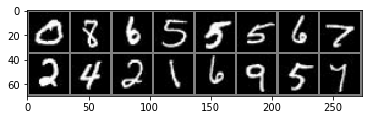

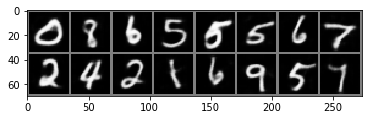

[29/200][0/165] Loss_VAE: 55.3450 KLD: 29.4176 MSE: 25.9274
[29/200][20/165] Loss_VAE: 55.5202 KLD: 29.6584 MSE: 25.8619
[29/200][40/165] Loss_VAE: 56.7511 KLD: 29.5546 MSE: 27.1966
[29/200][60/165] Loss_VAE: 55.2958 KLD: 29.5900 MSE: 25.7057
[29/200][80/165] Loss_VAE: 55.6614 KLD: 29.0659 MSE: 26.5955
[29/200][100/165] Loss_VAE: 56.2976 KLD: 29.7094 MSE: 26.5882
[29/200][120/165] Loss_VAE: 55.1736 KLD: 29.4246 MSE: 25.7490
[29/200][140/165] Loss_VAE: 56.6425 KLD: 29.4531 MSE: 27.1893
[29/200][160/165] Loss_VAE: 54.9609 KLD: 29.9100 MSE: 25.0509


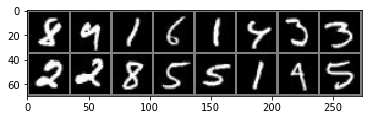

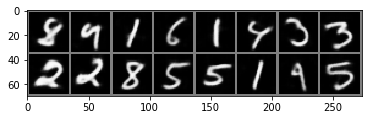

[30/200][0/165] Loss_VAE: 56.4638 KLD: 30.0556 MSE: 26.4082
[30/200][20/165] Loss_VAE: 56.7036 KLD: 30.0546 MSE: 26.6490
[30/200][40/165] Loss_VAE: 56.5545 KLD: 30.2432 MSE: 26.3112
[30/200][60/165] Loss_VAE: 54.4176 KLD: 28.9788 MSE: 25.4388
[30/200][80/165] Loss_VAE: 54.7100 KLD: 29.2377 MSE: 25.4723
[30/200][100/165] Loss_VAE: 55.4812 KLD: 29.3059 MSE: 26.1752
[30/200][120/165] Loss_VAE: 54.9753 KLD: 28.7991 MSE: 26.1762
[30/200][140/165] Loss_VAE: 55.8499 KLD: 30.0063 MSE: 25.8436
[30/200][160/165] Loss_VAE: 56.5206 KLD: 29.9087 MSE: 26.6120


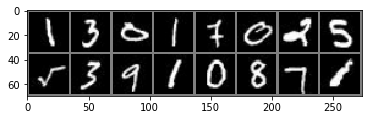

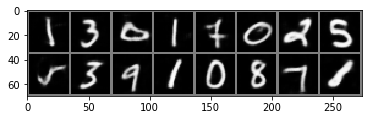

[31/200][0/165] Loss_VAE: 54.5996 KLD: 28.8060 MSE: 25.7936
[31/200][20/165] Loss_VAE: 54.6876 KLD: 29.7186 MSE: 24.9691
[31/200][40/165] Loss_VAE: 55.1003 KLD: 29.4206 MSE: 25.6797
[31/200][60/165] Loss_VAE: 56.2753 KLD: 29.4782 MSE: 26.7972
[31/200][80/165] Loss_VAE: 55.4435 KLD: 29.7180 MSE: 25.7256
[31/200][100/165] Loss_VAE: 57.5077 KLD: 30.4704 MSE: 27.0373
[31/200][120/165] Loss_VAE: 55.4298 KLD: 29.1728 MSE: 26.2570
[31/200][140/165] Loss_VAE: 56.0424 KLD: 29.6889 MSE: 26.3535
[31/200][160/165] Loss_VAE: 54.6493 KLD: 29.8252 MSE: 24.8241


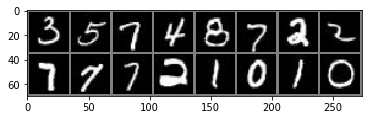

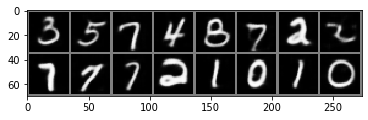

[32/200][0/165] Loss_VAE: 57.1373 KLD: 29.9313 MSE: 27.2060
[32/200][20/165] Loss_VAE: 56.7222 KLD: 29.6576 MSE: 27.0647
[32/200][40/165] Loss_VAE: 55.2846 KLD: 29.2393 MSE: 26.0453
[32/200][60/165] Loss_VAE: 55.7488 KLD: 29.7984 MSE: 25.9504
[32/200][80/165] Loss_VAE: 56.6089 KLD: 30.2935 MSE: 26.3154
[32/200][100/165] Loss_VAE: 55.4188 KLD: 29.2148 MSE: 26.2040
[32/200][120/165] Loss_VAE: 56.9241 KLD: 29.8933 MSE: 27.0308
[32/200][140/165] Loss_VAE: 55.3450 KLD: 28.9481 MSE: 26.3969
[32/200][160/165] Loss_VAE: 55.9240 KLD: 29.1938 MSE: 26.7302


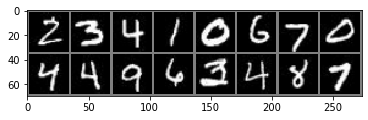

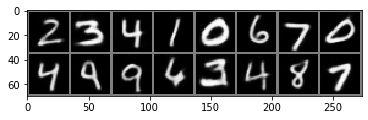

[33/200][0/165] Loss_VAE: 55.1549 KLD: 29.1163 MSE: 26.0387
[33/200][20/165] Loss_VAE: 55.1967 KLD: 29.3444 MSE: 25.8523
[33/200][40/165] Loss_VAE: 54.1692 KLD: 29.2376 MSE: 24.9316
[33/200][60/165] Loss_VAE: 54.1166 KLD: 28.6538 MSE: 25.4628
[33/200][80/165] Loss_VAE: 56.6802 KLD: 29.4152 MSE: 27.2650
[33/200][100/165] Loss_VAE: 57.3521 KLD: 30.8614 MSE: 26.4907
[33/200][120/165] Loss_VAE: 54.0184 KLD: 29.2270 MSE: 24.7914
[33/200][140/165] Loss_VAE: 54.9864 KLD: 29.2067 MSE: 25.7797
[33/200][160/165] Loss_VAE: 54.7265 KLD: 28.9983 MSE: 25.7281


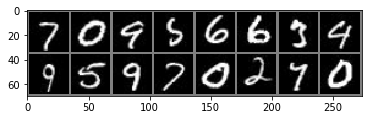

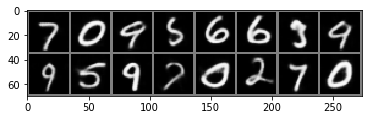

[34/200][0/165] Loss_VAE: 56.0479 KLD: 29.6813 MSE: 26.3666
[34/200][20/165] Loss_VAE: 53.3359 KLD: 29.1456 MSE: 24.1903
[34/200][40/165] Loss_VAE: 54.8234 KLD: 28.6659 MSE: 26.1575
[34/200][60/165] Loss_VAE: 57.5475 KLD: 30.1236 MSE: 27.4239
[34/200][80/165] Loss_VAE: 54.9146 KLD: 29.1226 MSE: 25.7920
[34/200][100/165] Loss_VAE: 55.9061 KLD: 29.7836 MSE: 26.1225
[34/200][120/165] Loss_VAE: 55.3510 KLD: 29.1764 MSE: 26.1746
[34/200][140/165] Loss_VAE: 54.8611 KLD: 29.7178 MSE: 25.1433
[34/200][160/165] Loss_VAE: 54.0884 KLD: 28.6669 MSE: 25.4215


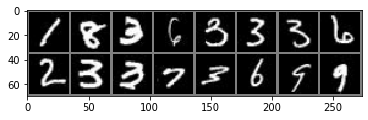

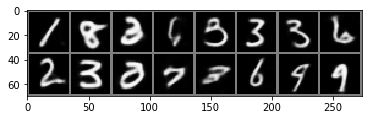

[35/200][0/165] Loss_VAE: 56.6867 KLD: 29.6944 MSE: 26.9923
[35/200][20/165] Loss_VAE: 54.2001 KLD: 28.9546 MSE: 25.2455
[35/200][40/165] Loss_VAE: 55.2827 KLD: 29.5086 MSE: 25.7741
[35/200][60/165] Loss_VAE: 56.0454 KLD: 29.4491 MSE: 26.5963
[35/200][80/165] Loss_VAE: 53.0630 KLD: 28.5859 MSE: 24.4771
[35/200][100/165] Loss_VAE: 56.4224 KLD: 29.3445 MSE: 27.0778
[35/200][120/165] Loss_VAE: 56.2314 KLD: 29.8613 MSE: 26.3702
[35/200][140/165] Loss_VAE: 55.5322 KLD: 28.9749 MSE: 26.5574
[35/200][160/165] Loss_VAE: 52.7121 KLD: 28.3458 MSE: 24.3664


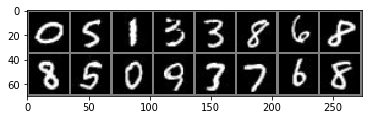

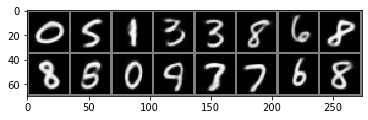

[36/200][0/165] Loss_VAE: 56.6665 KLD: 30.0760 MSE: 26.5905
[36/200][20/165] Loss_VAE: 55.0290 KLD: 29.5759 MSE: 25.4531
[36/200][40/165] Loss_VAE: 56.4315 KLD: 30.0885 MSE: 26.3431
[36/200][60/165] Loss_VAE: 55.8607 KLD: 29.5273 MSE: 26.3333
[36/200][80/165] Loss_VAE: 54.3488 KLD: 29.1123 MSE: 25.2365
[36/200][100/165] Loss_VAE: 55.8450 KLD: 29.8572 MSE: 25.9878
[36/200][120/165] Loss_VAE: 54.3695 KLD: 28.8970 MSE: 25.4725
[36/200][140/165] Loss_VAE: 55.8059 KLD: 29.6522 MSE: 26.1537
[36/200][160/165] Loss_VAE: 54.9825 KLD: 29.2684 MSE: 25.7141


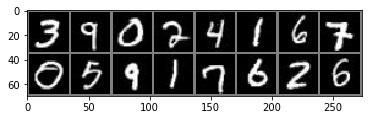

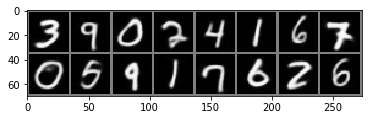

[37/200][0/165] Loss_VAE: 54.1600 KLD: 29.2734 MSE: 24.8866
[37/200][20/165] Loss_VAE: 55.2818 KLD: 29.5897 MSE: 25.6921
[37/200][40/165] Loss_VAE: 55.2634 KLD: 28.8190 MSE: 26.4444
[37/200][60/165] Loss_VAE: 55.3818 KLD: 29.4335 MSE: 25.9483
[37/200][80/165] Loss_VAE: 54.7193 KLD: 29.0838 MSE: 25.6355
[37/200][100/165] Loss_VAE: 56.1646 KLD: 29.9420 MSE: 26.2226
[37/200][120/165] Loss_VAE: 55.7570 KLD: 29.6106 MSE: 26.1465
[37/200][140/165] Loss_VAE: 55.7969 KLD: 30.2098 MSE: 25.5871
[37/200][160/165] Loss_VAE: 55.7922 KLD: 29.5621 MSE: 26.2301


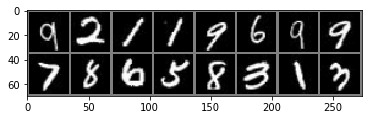

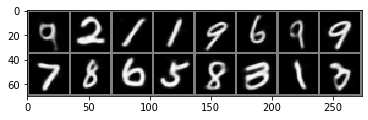

[38/200][0/165] Loss_VAE: 54.9759 KLD: 28.9793 MSE: 25.9966
[38/200][20/165] Loss_VAE: 53.8496 KLD: 29.0460 MSE: 24.8036
[38/200][40/165] Loss_VAE: 53.6786 KLD: 28.9387 MSE: 24.7398
[38/200][60/165] Loss_VAE: 53.9892 KLD: 28.7486 MSE: 25.2406
[38/200][80/165] Loss_VAE: 54.6523 KLD: 28.9216 MSE: 25.7307
[38/200][100/165] Loss_VAE: 53.4906 KLD: 28.6316 MSE: 24.8590
[38/200][120/165] Loss_VAE: 54.5592 KLD: 29.2475 MSE: 25.3117
[38/200][140/165] Loss_VAE: 54.0267 KLD: 28.9528 MSE: 25.0739
[38/200][160/165] Loss_VAE: 54.4930 KLD: 29.1254 MSE: 25.3676


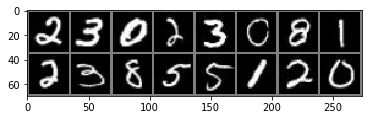

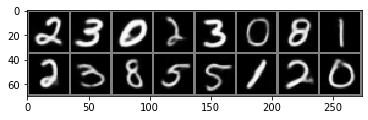

[39/200][0/165] Loss_VAE: 54.8739 KLD: 29.2125 MSE: 25.6614
[39/200][20/165] Loss_VAE: 53.4078 KLD: 28.8061 MSE: 24.6016
[39/200][40/165] Loss_VAE: 54.7585 KLD: 29.3789 MSE: 25.3795
[39/200][60/165] Loss_VAE: 53.5562 KLD: 28.5228 MSE: 25.0333
[39/200][80/165] Loss_VAE: 54.7351 KLD: 29.1837 MSE: 25.5513
[39/200][100/165] Loss_VAE: 54.5201 KLD: 29.2328 MSE: 25.2873
[39/200][120/165] Loss_VAE: 54.7314 KLD: 29.1585 MSE: 25.5729
[39/200][140/165] Loss_VAE: 55.1671 KLD: 29.3412 MSE: 25.8259
[39/200][160/165] Loss_VAE: 53.4214 KLD: 28.7022 MSE: 24.7193


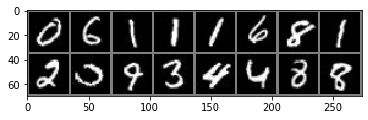

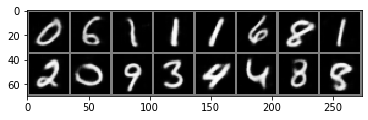

[40/200][0/165] Loss_VAE: 54.8210 KLD: 28.7628 MSE: 26.0582
[40/200][20/165] Loss_VAE: 54.7670 KLD: 28.9416 MSE: 25.8255
[40/200][40/165] Loss_VAE: 54.0877 KLD: 28.8006 MSE: 25.2871
[40/200][60/165] Loss_VAE: 56.1393 KLD: 29.7279 MSE: 26.4114
[40/200][80/165] Loss_VAE: 53.7107 KLD: 29.2376 MSE: 24.4731
[40/200][100/165] Loss_VAE: 53.1737 KLD: 27.9129 MSE: 25.2608
[40/200][120/165] Loss_VAE: 54.7284 KLD: 29.4104 MSE: 25.3180
[40/200][140/165] Loss_VAE: 54.3740 KLD: 28.4563 MSE: 25.9177
[40/200][160/165] Loss_VAE: 53.6492 KLD: 28.8291 MSE: 24.8201


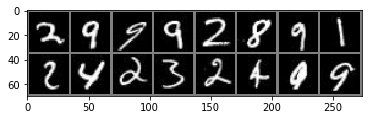

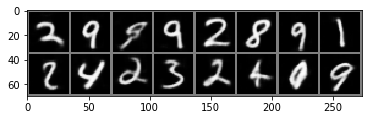

[41/200][0/165] Loss_VAE: 53.6254 KLD: 29.1616 MSE: 24.4638
[41/200][20/165] Loss_VAE: 55.1426 KLD: 29.9110 MSE: 25.2317
[41/200][40/165] Loss_VAE: 54.0438 KLD: 29.5364 MSE: 24.5074
[41/200][60/165] Loss_VAE: 53.3336 KLD: 29.2248 MSE: 24.1088
[41/200][80/165] Loss_VAE: 54.7213 KLD: 29.1311 MSE: 25.5902
[41/200][100/165] Loss_VAE: 55.3495 KLD: 29.5257 MSE: 25.8238
[41/200][120/165] Loss_VAE: 54.3996 KLD: 28.6961 MSE: 25.7035
[41/200][140/165] Loss_VAE: 53.5471 KLD: 28.8684 MSE: 24.6787
[41/200][160/165] Loss_VAE: 53.5668 KLD: 28.8566 MSE: 24.7102


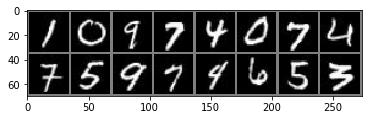

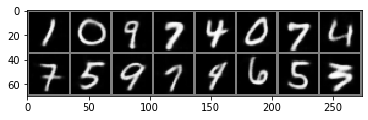

[42/200][0/165] Loss_VAE: 54.8598 KLD: 29.1384 MSE: 25.7215
[42/200][20/165] Loss_VAE: 53.6823 KLD: 29.1104 MSE: 24.5719
[42/200][40/165] Loss_VAE: 52.3611 KLD: 28.3392 MSE: 24.0219
[42/200][60/165] Loss_VAE: 54.3659 KLD: 28.9331 MSE: 25.4328
[42/200][80/165] Loss_VAE: 55.0201 KLD: 29.7665 MSE: 25.2537
[42/200][100/165] Loss_VAE: 54.7301 KLD: 29.3129 MSE: 25.4172
[42/200][120/165] Loss_VAE: 54.7573 KLD: 28.7015 MSE: 26.0559
[42/200][140/165] Loss_VAE: 54.1821 KLD: 29.1378 MSE: 25.0443
[42/200][160/165] Loss_VAE: 55.9399 KLD: 29.5342 MSE: 26.4058


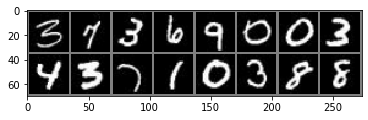

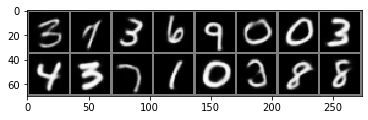

[43/200][0/165] Loss_VAE: 54.9984 KLD: 29.7097 MSE: 25.2888
[43/200][20/165] Loss_VAE: 55.0984 KLD: 28.2164 MSE: 26.8821
[43/200][40/165] Loss_VAE: 55.0353 KLD: 29.5026 MSE: 25.5327
[43/200][60/165] Loss_VAE: 54.4834 KLD: 28.7530 MSE: 25.7304
[43/200][80/165] Loss_VAE: 54.3495 KLD: 29.1174 MSE: 25.2321
[43/200][100/165] Loss_VAE: 54.3104 KLD: 29.0065 MSE: 25.3039
[43/200][120/165] Loss_VAE: 54.8551 KLD: 29.5669 MSE: 25.2882
[43/200][140/165] Loss_VAE: 54.3899 KLD: 28.9853 MSE: 25.4046
[43/200][160/165] Loss_VAE: 53.1770 KLD: 28.8740 MSE: 24.3030


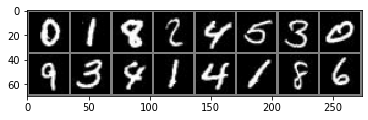

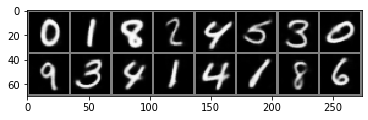

[44/200][0/165] Loss_VAE: 55.8885 KLD: 29.5524 MSE: 26.3362
[44/200][20/165] Loss_VAE: 53.2162 KLD: 29.0211 MSE: 24.1952
[44/200][40/165] Loss_VAE: 53.0522 KLD: 27.9024 MSE: 25.1498
[44/200][60/165] Loss_VAE: 55.2642 KLD: 29.4523 MSE: 25.8118
[44/200][80/165] Loss_VAE: 54.7358 KLD: 28.7283 MSE: 26.0075
[44/200][100/165] Loss_VAE: 52.8738 KLD: 28.4047 MSE: 24.4691
[44/200][120/165] Loss_VAE: 54.9863 KLD: 29.4811 MSE: 25.5052
[44/200][140/165] Loss_VAE: 54.6323 KLD: 28.9688 MSE: 25.6635
[44/200][160/165] Loss_VAE: 52.3264 KLD: 28.3187 MSE: 24.0077


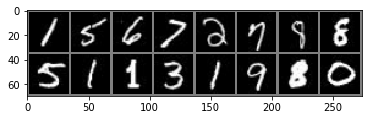

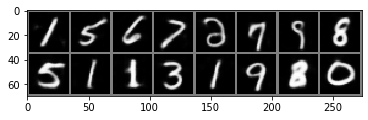

[45/200][0/165] Loss_VAE: 53.8256 KLD: 28.8235 MSE: 25.0021
[45/200][20/165] Loss_VAE: 52.7867 KLD: 27.9657 MSE: 24.8209
[45/200][40/165] Loss_VAE: 55.0982 KLD: 29.0065 MSE: 26.0917
[45/200][60/165] Loss_VAE: 53.9001 KLD: 28.3215 MSE: 25.5786
[45/200][80/165] Loss_VAE: 53.2311 KLD: 28.5945 MSE: 24.6366
[45/200][100/165] Loss_VAE: 52.9884 KLD: 28.4423 MSE: 24.5461
[45/200][120/165] Loss_VAE: 53.3989 KLD: 28.6012 MSE: 24.7977
[45/200][140/165] Loss_VAE: 54.8470 KLD: 29.5131 MSE: 25.3339
[45/200][160/165] Loss_VAE: 54.6004 KLD: 29.2179 MSE: 25.3826


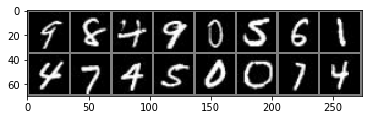

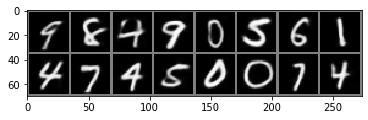

[46/200][0/165] Loss_VAE: 52.5507 KLD: 27.9761 MSE: 24.5746
[46/200][20/165] Loss_VAE: 52.4919 KLD: 28.3131 MSE: 24.1788
[46/200][40/165] Loss_VAE: 54.6510 KLD: 28.7753 MSE: 25.8757
[46/200][60/165] Loss_VAE: 55.3903 KLD: 29.8742 MSE: 25.5161
[46/200][80/165] Loss_VAE: 54.3580 KLD: 28.9157 MSE: 25.4424
[46/200][100/165] Loss_VAE: 54.4008 KLD: 28.5933 MSE: 25.8075
[46/200][120/165] Loss_VAE: 54.5751 KLD: 28.4538 MSE: 26.1214
[46/200][140/165] Loss_VAE: 54.5163 KLD: 28.7461 MSE: 25.7702
[46/200][160/165] Loss_VAE: 53.5653 KLD: 28.9335 MSE: 24.6318


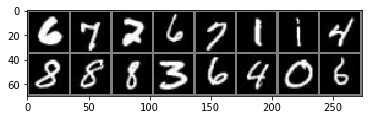

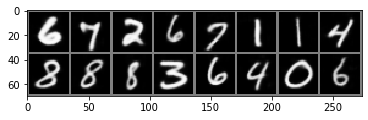

[47/200][0/165] Loss_VAE: 54.0075 KLD: 29.3224 MSE: 24.6851
[47/200][20/165] Loss_VAE: 53.5193 KLD: 28.9288 MSE: 24.5905
[47/200][40/165] Loss_VAE: 53.9860 KLD: 29.4864 MSE: 24.4996
[47/200][60/165] Loss_VAE: 52.2206 KLD: 28.4793 MSE: 23.7413
[47/200][80/165] Loss_VAE: 53.6388 KLD: 28.7908 MSE: 24.8480
[47/200][100/165] Loss_VAE: 52.8309 KLD: 28.4807 MSE: 24.3502
[47/200][120/165] Loss_VAE: 53.7464 KLD: 28.7574 MSE: 24.9889
[47/200][140/165] Loss_VAE: 52.0560 KLD: 27.8990 MSE: 24.1570
[47/200][160/165] Loss_VAE: 52.0265 KLD: 28.4085 MSE: 23.6181


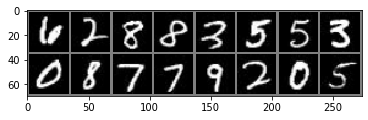

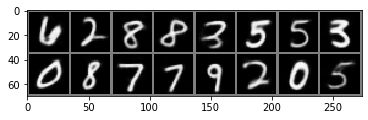

[48/200][0/165] Loss_VAE: 53.8381 KLD: 28.1161 MSE: 25.7220
[48/200][20/165] Loss_VAE: 54.9844 KLD: 29.3035 MSE: 25.6809
[48/200][40/165] Loss_VAE: 52.7441 KLD: 27.8656 MSE: 24.8786
[48/200][60/165] Loss_VAE: 53.6540 KLD: 28.4565 MSE: 25.1975
[48/200][80/165] Loss_VAE: 54.2893 KLD: 29.8213 MSE: 24.4680
[48/200][100/165] Loss_VAE: 50.6910 KLD: 28.0094 MSE: 22.6816
[48/200][120/165] Loss_VAE: 52.7822 KLD: 28.9269 MSE: 23.8553
[48/200][140/165] Loss_VAE: 55.2080 KLD: 28.8780 MSE: 26.3301
[48/200][160/165] Loss_VAE: 53.5810 KLD: 29.3565 MSE: 24.2245


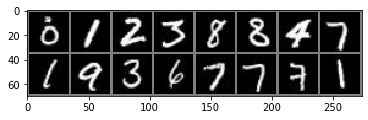

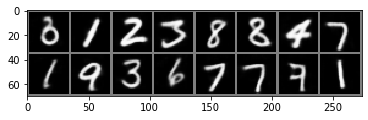

[49/200][0/165] Loss_VAE: 54.2504 KLD: 28.9341 MSE: 25.3163
[49/200][20/165] Loss_VAE: 53.1139 KLD: 28.5700 MSE: 24.5439
[49/200][40/165] Loss_VAE: 53.5538 KLD: 28.6203 MSE: 24.9335
[49/200][60/165] Loss_VAE: 53.2190 KLD: 29.2095 MSE: 24.0096
[49/200][80/165] Loss_VAE: 54.1113 KLD: 28.7324 MSE: 25.3788
[49/200][100/165] Loss_VAE: 53.8033 KLD: 28.4852 MSE: 25.3181
[49/200][120/165] Loss_VAE: 54.3227 KLD: 28.9081 MSE: 25.4146
[49/200][140/165] Loss_VAE: 53.7701 KLD: 29.0483 MSE: 24.7218
[49/200][160/165] Loss_VAE: 53.8670 KLD: 29.3882 MSE: 24.4788


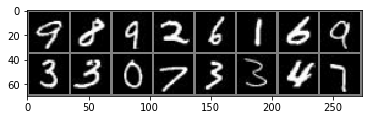

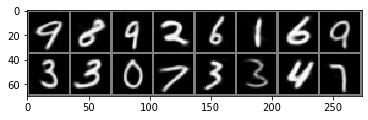

[50/200][0/165] Loss_VAE: 55.5132 KLD: 29.3435 MSE: 26.1698
[50/200][20/165] Loss_VAE: 54.0461 KLD: 29.5445 MSE: 24.5015
[50/200][40/165] Loss_VAE: 56.0622 KLD: 29.5060 MSE: 26.5562
[50/200][60/165] Loss_VAE: 53.0211 KLD: 28.8182 MSE: 24.2029
[50/200][80/165] Loss_VAE: 54.4657 KLD: 29.1866 MSE: 25.2790
[50/200][100/165] Loss_VAE: 53.2188 KLD: 28.6894 MSE: 24.5294
[50/200][120/165] Loss_VAE: 55.3622 KLD: 29.3777 MSE: 25.9846
[50/200][140/165] Loss_VAE: 53.9094 KLD: 28.6689 MSE: 25.2405
[50/200][160/165] Loss_VAE: 52.7819 KLD: 28.4689 MSE: 24.3130


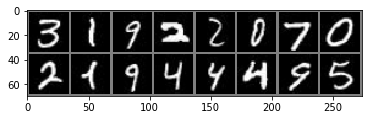

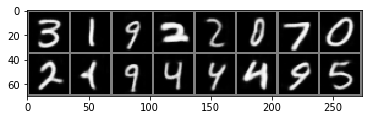

[51/200][0/165] Loss_VAE: 54.2993 KLD: 28.9495 MSE: 25.3498
[51/200][20/165] Loss_VAE: 54.3116 KLD: 29.2648 MSE: 25.0468
[51/200][40/165] Loss_VAE: 52.7834 KLD: 28.2209 MSE: 24.5626
[51/200][60/165] Loss_VAE: 53.2375 KLD: 28.3397 MSE: 24.8979
[51/200][80/165] Loss_VAE: 53.3561 KLD: 29.0048 MSE: 24.3513
[51/200][100/165] Loss_VAE: 54.0135 KLD: 29.6047 MSE: 24.4088
[51/200][120/165] Loss_VAE: 53.7084 KLD: 28.8700 MSE: 24.8384
[51/200][140/165] Loss_VAE: 52.9322 KLD: 28.0119 MSE: 24.9203
[51/200][160/165] Loss_VAE: 52.2667 KLD: 28.5437 MSE: 23.7230


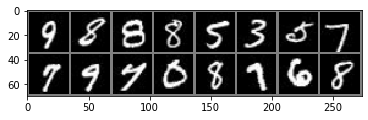

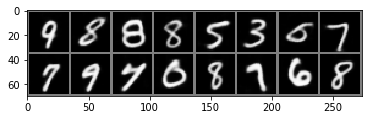

[52/200][0/165] Loss_VAE: 52.3738 KLD: 28.3704 MSE: 24.0034
[52/200][20/165] Loss_VAE: 54.2756 KLD: 28.2113 MSE: 26.0643
[52/200][40/165] Loss_VAE: 52.7504 KLD: 28.8020 MSE: 23.9485
[52/200][60/165] Loss_VAE: 54.0102 KLD: 28.8079 MSE: 25.2023
[52/200][80/165] Loss_VAE: 52.6593 KLD: 28.2921 MSE: 24.3672
[52/200][100/165] Loss_VAE: 53.5118 KLD: 28.8051 MSE: 24.7067
[52/200][120/165] Loss_VAE: 52.3729 KLD: 28.2868 MSE: 24.0862
[52/200][140/165] Loss_VAE: 52.7290 KLD: 28.5346 MSE: 24.1945
[52/200][160/165] Loss_VAE: 52.4991 KLD: 28.2567 MSE: 24.2424


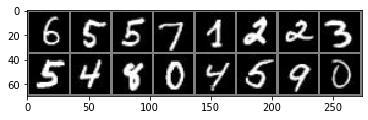

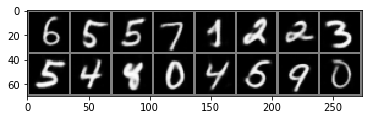

[53/200][0/165] Loss_VAE: 53.4406 KLD: 28.6042 MSE: 24.8364
[53/200][20/165] Loss_VAE: 53.0370 KLD: 28.1499 MSE: 24.8872
[53/200][40/165] Loss_VAE: 51.7949 KLD: 28.0679 MSE: 23.7270
[53/200][60/165] Loss_VAE: 54.2534 KLD: 29.4487 MSE: 24.8046
[53/200][80/165] Loss_VAE: 53.5246 KLD: 28.9839 MSE: 24.5407
[53/200][100/165] Loss_VAE: 53.8332 KLD: 28.9482 MSE: 24.8850
[53/200][120/165] Loss_VAE: 51.7976 KLD: 28.4144 MSE: 23.3833
[53/200][140/165] Loss_VAE: 54.0637 KLD: 28.7111 MSE: 25.3526
[53/200][160/165] Loss_VAE: 53.2984 KLD: 28.5357 MSE: 24.7627


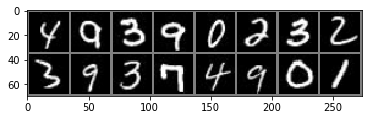

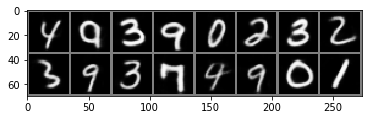

[54/200][0/165] Loss_VAE: 52.2179 KLD: 28.3734 MSE: 23.8445
[54/200][20/165] Loss_VAE: 52.9678 KLD: 28.0891 MSE: 24.8787
[54/200][40/165] Loss_VAE: 53.3054 KLD: 28.8122 MSE: 24.4932
[54/200][60/165] Loss_VAE: 51.8334 KLD: 27.8320 MSE: 24.0014
[54/200][80/165] Loss_VAE: 53.3789 KLD: 28.9278 MSE: 24.4511
[54/200][100/165] Loss_VAE: 53.7791 KLD: 29.6153 MSE: 24.1638
[54/200][120/165] Loss_VAE: 53.2270 KLD: 28.1763 MSE: 25.0507
[54/200][140/165] Loss_VAE: 52.1765 KLD: 28.2822 MSE: 23.8944
[54/200][160/165] Loss_VAE: 51.7823 KLD: 28.0938 MSE: 23.6885


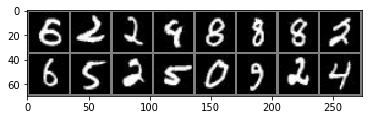

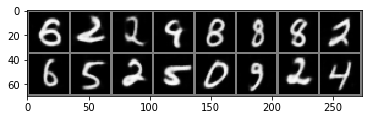

[55/200][0/165] Loss_VAE: 52.7884 KLD: 28.4335 MSE: 24.3549
[55/200][20/165] Loss_VAE: 51.6752 KLD: 28.3867 MSE: 23.2885
[55/200][40/165] Loss_VAE: 51.2593 KLD: 28.3185 MSE: 22.9408
[55/200][60/165] Loss_VAE: 53.1343 KLD: 28.5937 MSE: 24.5406
[55/200][80/165] Loss_VAE: 52.7533 KLD: 28.2278 MSE: 24.5255
[55/200][100/165] Loss_VAE: 52.6477 KLD: 28.8379 MSE: 23.8099
[55/200][120/165] Loss_VAE: 52.0043 KLD: 28.2056 MSE: 23.7987
[55/200][140/165] Loss_VAE: 52.2535 KLD: 28.1132 MSE: 24.1404
[55/200][160/165] Loss_VAE: 51.7422 KLD: 28.5893 MSE: 23.1529


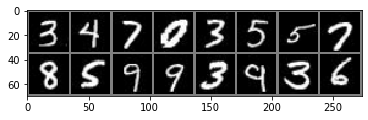

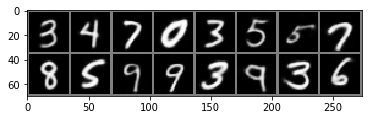

[56/200][0/165] Loss_VAE: 53.5786 KLD: 28.0083 MSE: 25.5703
[56/200][20/165] Loss_VAE: 53.0374 KLD: 28.9129 MSE: 24.1245
[56/200][40/165] Loss_VAE: 53.7465 KLD: 28.8457 MSE: 24.9008
[56/200][60/165] Loss_VAE: 52.2578 KLD: 28.5334 MSE: 23.7244
[56/200][80/165] Loss_VAE: 51.5789 KLD: 28.1840 MSE: 23.3949
[56/200][100/165] Loss_VAE: 53.5896 KLD: 29.1541 MSE: 24.4355
[56/200][120/165] Loss_VAE: 52.4298 KLD: 28.0973 MSE: 24.3326
[56/200][140/165] Loss_VAE: 52.3818 KLD: 28.3418 MSE: 24.0400
[56/200][160/165] Loss_VAE: 53.2402 KLD: 28.9618 MSE: 24.2784


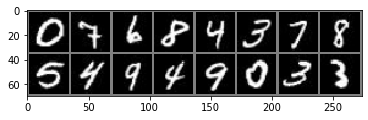

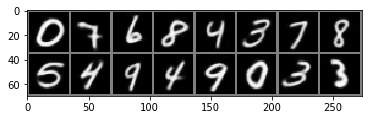

[57/200][0/165] Loss_VAE: 53.7276 KLD: 28.9146 MSE: 24.8130
[57/200][20/165] Loss_VAE: 53.1830 KLD: 28.4582 MSE: 24.7248
[57/200][40/165] Loss_VAE: 53.7668 KLD: 28.9244 MSE: 24.8424
[57/200][60/165] Loss_VAE: 52.8451 KLD: 28.3969 MSE: 24.4482
[57/200][80/165] Loss_VAE: 52.1236 KLD: 28.1960 MSE: 23.9276
[57/200][100/165] Loss_VAE: 51.5899 KLD: 28.3141 MSE: 23.2759
[57/200][120/165] Loss_VAE: 54.0116 KLD: 29.0206 MSE: 24.9910
[57/200][140/165] Loss_VAE: 53.8966 KLD: 28.3334 MSE: 25.5631
[57/200][160/165] Loss_VAE: 53.5332 KLD: 28.5946 MSE: 24.9386


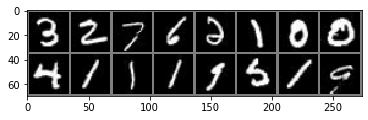

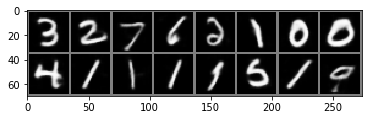

[58/200][0/165] Loss_VAE: 51.8366 KLD: 28.0650 MSE: 23.7717
[58/200][20/165] Loss_VAE: 52.9130 KLD: 28.5855 MSE: 24.3275
[58/200][40/165] Loss_VAE: 51.3138 KLD: 28.1274 MSE: 23.1865
[58/200][60/165] Loss_VAE: 51.4762 KLD: 27.9005 MSE: 23.5756
[58/200][80/165] Loss_VAE: 52.5261 KLD: 28.7657 MSE: 23.7604
[58/200][100/165] Loss_VAE: 51.4121 KLD: 28.1379 MSE: 23.2742
[58/200][120/165] Loss_VAE: 52.4012 KLD: 27.7291 MSE: 24.6722
[58/200][140/165] Loss_VAE: 51.6839 KLD: 28.3521 MSE: 23.3318
[58/200][160/165] Loss_VAE: 51.9439 KLD: 27.7956 MSE: 24.1482


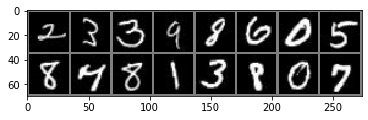

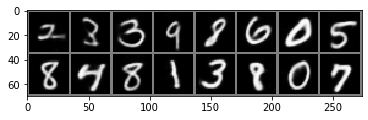

[59/200][0/165] Loss_VAE: 53.0073 KLD: 28.7296 MSE: 24.2777
[59/200][20/165] Loss_VAE: 51.1299 KLD: 27.7440 MSE: 23.3859
[59/200][40/165] Loss_VAE: 52.8376 KLD: 27.9046 MSE: 24.9330
[59/200][60/165] Loss_VAE: 53.1029 KLD: 29.1388 MSE: 23.9641
[59/200][80/165] Loss_VAE: 51.0000 KLD: 28.0832 MSE: 22.9168
[59/200][100/165] Loss_VAE: 54.4707 KLD: 28.9791 MSE: 25.4917
[59/200][120/165] Loss_VAE: 53.7053 KLD: 28.8327 MSE: 24.8726
[59/200][140/165] Loss_VAE: 52.4748 KLD: 27.7502 MSE: 24.7246
[59/200][160/165] Loss_VAE: 52.0184 KLD: 28.1904 MSE: 23.8280


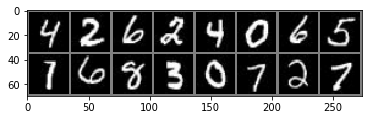

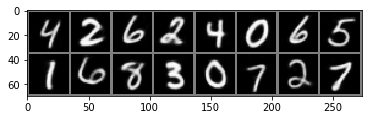

[60/200][0/165] Loss_VAE: 53.9339 KLD: 28.8127 MSE: 25.1212
[60/200][20/165] Loss_VAE: 53.8058 KLD: 28.5193 MSE: 25.2865
[60/200][40/165] Loss_VAE: 50.8203 KLD: 27.6011 MSE: 23.2192
[60/200][60/165] Loss_VAE: 52.4491 KLD: 28.6012 MSE: 23.8480
[60/200][80/165] Loss_VAE: 51.9452 KLD: 27.7369 MSE: 24.2083
[60/200][100/165] Loss_VAE: 53.3148 KLD: 28.6639 MSE: 24.6509
[60/200][120/165] Loss_VAE: 53.5435 KLD: 28.7813 MSE: 24.7622
[60/200][140/165] Loss_VAE: 53.1354 KLD: 28.9043 MSE: 24.2311
[60/200][160/165] Loss_VAE: 52.7777 KLD: 28.3212 MSE: 24.4565


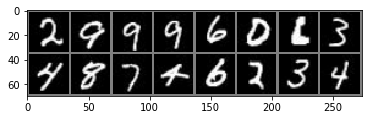

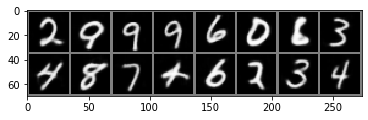

[61/200][0/165] Loss_VAE: 52.7924 KLD: 28.1265 MSE: 24.6659
[61/200][20/165] Loss_VAE: 53.4898 KLD: 29.0011 MSE: 24.4886
[61/200][40/165] Loss_VAE: 53.7086 KLD: 28.4065 MSE: 25.3021
[61/200][60/165] Loss_VAE: 52.9688 KLD: 28.7522 MSE: 24.2167
[61/200][80/165] Loss_VAE: 53.2839 KLD: 29.1188 MSE: 24.1651
[61/200][100/165] Loss_VAE: 51.6155 KLD: 28.0358 MSE: 23.5797
[61/200][120/165] Loss_VAE: 53.4603 KLD: 28.8651 MSE: 24.5952
[61/200][140/165] Loss_VAE: 53.4254 KLD: 28.4016 MSE: 25.0238
[61/200][160/165] Loss_VAE: 52.0157 KLD: 28.3264 MSE: 23.6893


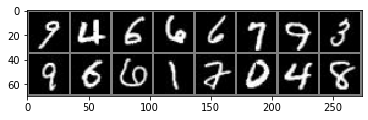

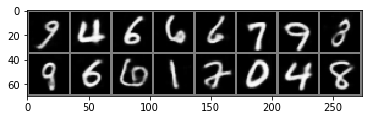

[62/200][0/165] Loss_VAE: 52.6060 KLD: 28.1895 MSE: 24.4165
[62/200][20/165] Loss_VAE: 51.6151 KLD: 27.5120 MSE: 24.1031
[62/200][40/165] Loss_VAE: 53.1472 KLD: 29.0317 MSE: 24.1156
[62/200][60/165] Loss_VAE: 52.8107 KLD: 28.7492 MSE: 24.0615
[62/200][80/165] Loss_VAE: 54.7985 KLD: 29.1653 MSE: 25.6333
[62/200][100/165] Loss_VAE: 52.0841 KLD: 28.2962 MSE: 23.7879
[62/200][120/165] Loss_VAE: 52.4827 KLD: 28.0978 MSE: 24.3850
[62/200][140/165] Loss_VAE: 52.4602 KLD: 28.4685 MSE: 23.9917
[62/200][160/165] Loss_VAE: 50.9893 KLD: 27.7224 MSE: 23.2669


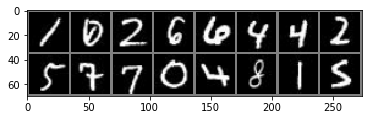

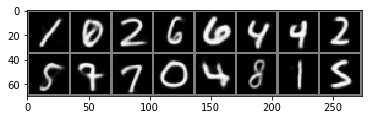

[63/200][0/165] Loss_VAE: 53.8280 KLD: 28.7707 MSE: 25.0573
[63/200][20/165] Loss_VAE: 52.5223 KLD: 28.4505 MSE: 24.0717
[63/200][40/165] Loss_VAE: 55.6533 KLD: 29.5356 MSE: 26.1176
[63/200][60/165] Loss_VAE: 52.0905 KLD: 28.3876 MSE: 23.7030
[63/200][80/165] Loss_VAE: 50.5551 KLD: 27.7885 MSE: 22.7666
[63/200][100/165] Loss_VAE: 52.7832 KLD: 28.7323 MSE: 24.0509
[63/200][120/165] Loss_VAE: 52.7811 KLD: 28.0034 MSE: 24.7777
[63/200][140/165] Loss_VAE: 51.8089 KLD: 27.9543 MSE: 23.8546
[63/200][160/165] Loss_VAE: 51.9387 KLD: 27.9626 MSE: 23.9761


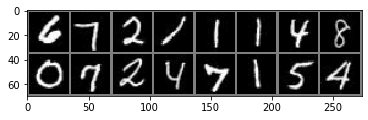

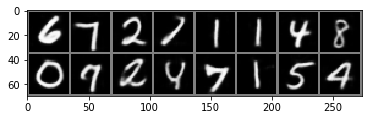

[64/200][0/165] Loss_VAE: 52.5125 KLD: 27.8104 MSE: 24.7021
[64/200][20/165] Loss_VAE: 52.6305 KLD: 28.2545 MSE: 24.3759
[64/200][40/165] Loss_VAE: 52.9927 KLD: 28.4545 MSE: 24.5382
[64/200][60/165] Loss_VAE: 52.4300 KLD: 28.4588 MSE: 23.9711
[64/200][80/165] Loss_VAE: 51.7627 KLD: 27.9154 MSE: 23.8473
[64/200][100/165] Loss_VAE: 53.3160 KLD: 28.4710 MSE: 24.8451
[64/200][120/165] Loss_VAE: 53.6092 KLD: 28.5593 MSE: 25.0499
[64/200][140/165] Loss_VAE: 51.2947 KLD: 27.9495 MSE: 23.3452
[64/200][160/165] Loss_VAE: 52.2294 KLD: 28.0679 MSE: 24.1615


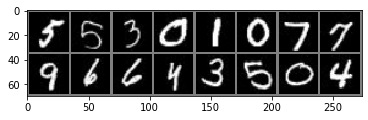

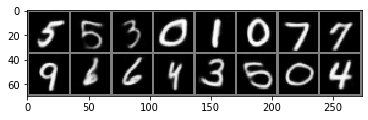

[65/200][0/165] Loss_VAE: 51.5377 KLD: 27.7808 MSE: 23.7568
[65/200][20/165] Loss_VAE: 50.8232 KLD: 27.4069 MSE: 23.4163
[65/200][40/165] Loss_VAE: 53.4340 KLD: 29.0260 MSE: 24.4080
[65/200][60/165] Loss_VAE: 52.6646 KLD: 28.5859 MSE: 24.0788
[65/200][80/165] Loss_VAE: 51.1547 KLD: 27.8715 MSE: 23.2832
[65/200][100/165] Loss_VAE: 53.5220 KLD: 28.7867 MSE: 24.7353
[65/200][120/165] Loss_VAE: 51.5550 KLD: 27.8329 MSE: 23.7221
[65/200][140/165] Loss_VAE: 51.4840 KLD: 27.9976 MSE: 23.4864
[65/200][160/165] Loss_VAE: 51.7015 KLD: 28.1319 MSE: 23.5696


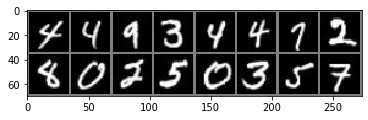

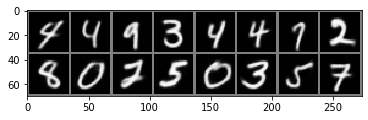

[66/200][0/165] Loss_VAE: 52.0861 KLD: 27.7840 MSE: 24.3021
[66/200][20/165] Loss_VAE: 51.2502 KLD: 27.8956 MSE: 23.3547
[66/200][40/165] Loss_VAE: 53.2658 KLD: 28.3961 MSE: 24.8696
[66/200][60/165] Loss_VAE: 53.8558 KLD: 28.9214 MSE: 24.9344
[66/200][80/165] Loss_VAE: 52.8264 KLD: 28.5683 MSE: 24.2581
[66/200][100/165] Loss_VAE: 52.1734 KLD: 27.9723 MSE: 24.2011
[66/200][120/165] Loss_VAE: 52.3719 KLD: 28.3841 MSE: 23.9878
[66/200][140/165] Loss_VAE: 54.7423 KLD: 29.5342 MSE: 25.2081
[66/200][160/165] Loss_VAE: 53.2355 KLD: 28.7270 MSE: 24.5084


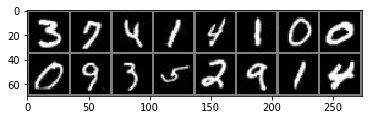

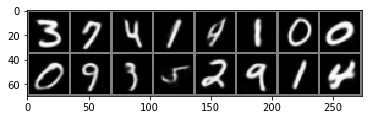

[67/200][0/165] Loss_VAE: 53.1802 KLD: 28.4935 MSE: 24.6866
[67/200][20/165] Loss_VAE: 53.6657 KLD: 28.9286 MSE: 24.7371
[67/200][40/165] Loss_VAE: 52.6543 KLD: 27.7771 MSE: 24.8772
[67/200][60/165] Loss_VAE: 51.3876 KLD: 28.0743 MSE: 23.3133
[67/200][80/165] Loss_VAE: 52.5628 KLD: 28.7460 MSE: 23.8168
[67/200][100/165] Loss_VAE: 53.9775 KLD: 28.8727 MSE: 25.1047
[67/200][120/165] Loss_VAE: 52.2461 KLD: 28.4109 MSE: 23.8353
[67/200][140/165] Loss_VAE: 50.9315 KLD: 27.5161 MSE: 23.4155
[67/200][160/165] Loss_VAE: 52.1442 KLD: 28.1581 MSE: 23.9860


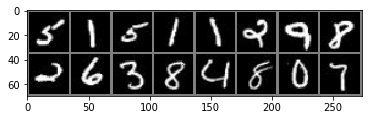

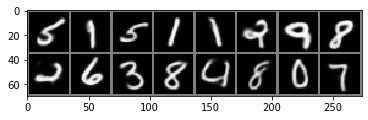

[68/200][0/165] Loss_VAE: 51.4211 KLD: 27.5423 MSE: 23.8788
[68/200][20/165] Loss_VAE: 52.4672 KLD: 27.9097 MSE: 24.5575
[68/200][40/165] Loss_VAE: 51.0765 KLD: 27.3029 MSE: 23.7735
[68/200][60/165] Loss_VAE: 50.2830 KLD: 27.2273 MSE: 23.0556
[68/200][80/165] Loss_VAE: 52.7050 KLD: 28.6176 MSE: 24.0874
[68/200][100/165] Loss_VAE: 53.7015 KLD: 28.8076 MSE: 24.8939
[68/200][120/165] Loss_VAE: 51.9355 KLD: 28.6357 MSE: 23.2997
[68/200][140/165] Loss_VAE: 52.6295 KLD: 28.4922 MSE: 24.1373
[68/200][160/165] Loss_VAE: 52.2225 KLD: 28.2540 MSE: 23.9685


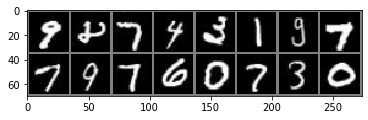

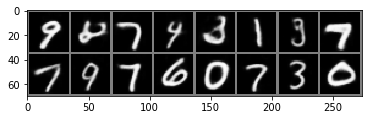

[69/200][0/165] Loss_VAE: 52.1672 KLD: 28.4080 MSE: 23.7592
[69/200][20/165] Loss_VAE: 51.9145 KLD: 27.9156 MSE: 23.9989
[69/200][40/165] Loss_VAE: 50.9799 KLD: 28.2191 MSE: 22.7607
[69/200][60/165] Loss_VAE: 52.9148 KLD: 28.0197 MSE: 24.8951
[69/200][80/165] Loss_VAE: 52.0492 KLD: 28.2596 MSE: 23.7896
[69/200][100/165] Loss_VAE: 52.2228 KLD: 28.2031 MSE: 24.0197
[69/200][120/165] Loss_VAE: 51.6405 KLD: 27.5553 MSE: 24.0852
[69/200][140/165] Loss_VAE: 52.0587 KLD: 28.2181 MSE: 23.8405
[69/200][160/165] Loss_VAE: 52.5637 KLD: 28.3139 MSE: 24.2498


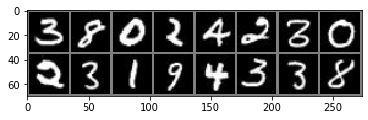

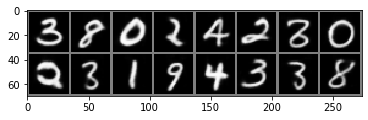

[70/200][0/165] Loss_VAE: 51.5089 KLD: 27.7190 MSE: 23.7900
[70/200][20/165] Loss_VAE: 52.8147 KLD: 28.2279 MSE: 24.5868
[70/200][40/165] Loss_VAE: 51.4473 KLD: 27.9038 MSE: 23.5435
[70/200][60/165] Loss_VAE: 51.7654 KLD: 27.8344 MSE: 23.9311
[70/200][80/165] Loss_VAE: 52.2396 KLD: 28.2920 MSE: 23.9476
[70/200][100/165] Loss_VAE: 51.4162 KLD: 27.9792 MSE: 23.4369
[70/200][120/165] Loss_VAE: 50.8120 KLD: 28.2025 MSE: 22.6094
[70/200][140/165] Loss_VAE: 52.4494 KLD: 28.7106 MSE: 23.7389
[70/200][160/165] Loss_VAE: 53.3271 KLD: 28.8157 MSE: 24.5114


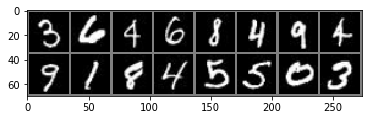

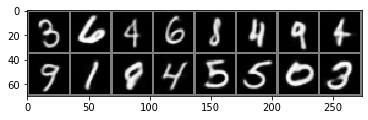

[71/200][0/165] Loss_VAE: 51.4873 KLD: 27.9477 MSE: 23.5397
[71/200][20/165] Loss_VAE: 51.7945 KLD: 28.4851 MSE: 23.3094
[71/200][40/165] Loss_VAE: 52.1732 KLD: 27.5879 MSE: 24.5853
[71/200][60/165] Loss_VAE: 52.8477 KLD: 28.6789 MSE: 24.1688
[71/200][80/165] Loss_VAE: 52.4623 KLD: 28.0159 MSE: 24.4464
[71/200][100/165] Loss_VAE: 50.7715 KLD: 27.7408 MSE: 23.0308
[71/200][120/165] Loss_VAE: 52.5002 KLD: 28.7069 MSE: 23.7933
[71/200][140/165] Loss_VAE: 51.0227 KLD: 27.3350 MSE: 23.6877
[71/200][160/165] Loss_VAE: 52.0244 KLD: 27.9027 MSE: 24.1217


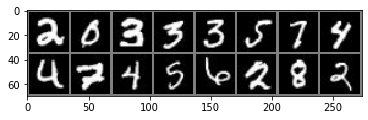

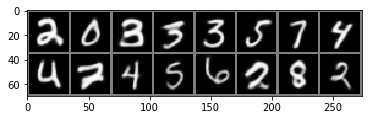

[72/200][0/165] Loss_VAE: 51.0630 KLD: 27.6885 MSE: 23.3745
[72/200][20/165] Loss_VAE: 52.0693 KLD: 28.3278 MSE: 23.7414
[72/200][40/165] Loss_VAE: 51.4386 KLD: 28.1015 MSE: 23.3371
[72/200][60/165] Loss_VAE: 51.4422 KLD: 27.7257 MSE: 23.7165
[72/200][80/165] Loss_VAE: 52.4480 KLD: 28.4105 MSE: 24.0375
[72/200][100/165] Loss_VAE: 51.5820 KLD: 27.9823 MSE: 23.5996
[72/200][120/165] Loss_VAE: 51.4064 KLD: 28.6472 MSE: 22.7592
[72/200][140/165] Loss_VAE: 51.8024 KLD: 28.0173 MSE: 23.7852
[72/200][160/165] Loss_VAE: 51.6747 KLD: 27.7140 MSE: 23.9606


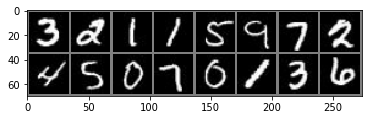

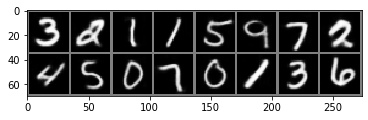

[73/200][0/165] Loss_VAE: 51.8639 KLD: 27.7584 MSE: 24.1055
[73/200][20/165] Loss_VAE: 50.3910 KLD: 27.9742 MSE: 22.4168
[73/200][40/165] Loss_VAE: 51.8308 KLD: 28.2227 MSE: 23.6081
[73/200][60/165] Loss_VAE: 51.6705 KLD: 28.0991 MSE: 23.5715
[73/200][80/165] Loss_VAE: 52.3311 KLD: 28.1479 MSE: 24.1832
[73/200][100/165] Loss_VAE: 50.6500 KLD: 27.2364 MSE: 23.4137
[73/200][120/165] Loss_VAE: 53.3087 KLD: 28.5993 MSE: 24.7094
[73/200][140/165] Loss_VAE: 50.9423 KLD: 27.4991 MSE: 23.4432
[73/200][160/165] Loss_VAE: 51.4943 KLD: 27.4413 MSE: 24.0530


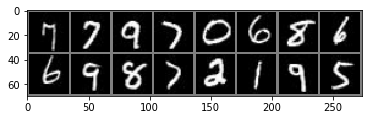

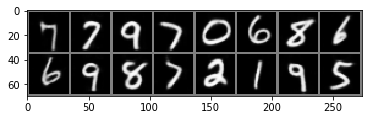

[74/200][0/165] Loss_VAE: 51.9222 KLD: 28.0974 MSE: 23.8248
[74/200][20/165] Loss_VAE: 52.3298 KLD: 28.0460 MSE: 24.2838
[74/200][40/165] Loss_VAE: 53.0446 KLD: 28.2351 MSE: 24.8096
[74/200][60/165] Loss_VAE: 53.3526 KLD: 28.6858 MSE: 24.6668
[74/200][80/165] Loss_VAE: 52.6963 KLD: 28.4814 MSE: 24.2150
[74/200][100/165] Loss_VAE: 50.7484 KLD: 27.7343 MSE: 23.0141
[74/200][120/165] Loss_VAE: 50.9900 KLD: 27.1893 MSE: 23.8007
[74/200][140/165] Loss_VAE: 50.6340 KLD: 27.2329 MSE: 23.4011
[74/200][160/165] Loss_VAE: 51.0220 KLD: 27.8303 MSE: 23.1917


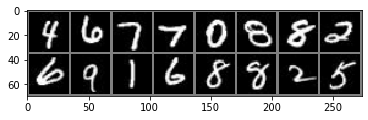

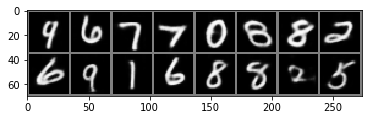

[75/200][0/165] Loss_VAE: 53.1367 KLD: 28.2084 MSE: 24.9283
[75/200][20/165] Loss_VAE: 51.3731 KLD: 27.1769 MSE: 24.1962
[75/200][40/165] Loss_VAE: 51.8799 KLD: 28.3401 MSE: 23.5398
[75/200][60/165] Loss_VAE: 52.1603 KLD: 28.4538 MSE: 23.7065
[75/200][80/165] Loss_VAE: 51.5730 KLD: 28.0871 MSE: 23.4859
[75/200][100/165] Loss_VAE: 52.6905 KLD: 28.2474 MSE: 24.4430
[75/200][120/165] Loss_VAE: 52.4899 KLD: 28.1144 MSE: 24.3755
[75/200][140/165] Loss_VAE: 51.0467 KLD: 27.4303 MSE: 23.6164
[75/200][160/165] Loss_VAE: 50.4071 KLD: 27.3430 MSE: 23.0641


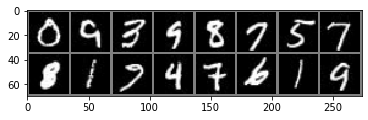

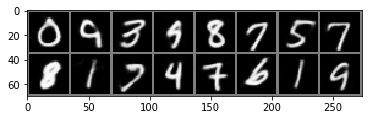

[76/200][0/165] Loss_VAE: 51.8643 KLD: 27.9366 MSE: 23.9277
[76/200][20/165] Loss_VAE: 50.6012 KLD: 27.6447 MSE: 22.9565
[76/200][40/165] Loss_VAE: 51.6300 KLD: 28.1434 MSE: 23.4866
[76/200][60/165] Loss_VAE: 51.8369 KLD: 28.4060 MSE: 23.4308
[76/200][80/165] Loss_VAE: 53.3352 KLD: 29.1775 MSE: 24.1578
[76/200][100/165] Loss_VAE: 51.6550 KLD: 28.3713 MSE: 23.2837
[76/200][120/165] Loss_VAE: 52.3591 KLD: 28.5071 MSE: 23.8520
[76/200][140/165] Loss_VAE: 52.3141 KLD: 28.0750 MSE: 24.2391
[76/200][160/165] Loss_VAE: 51.8266 KLD: 27.7387 MSE: 24.0880


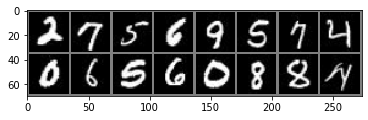

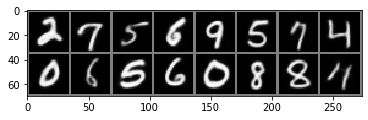

[77/200][0/165] Loss_VAE: 51.4637 KLD: 28.0946 MSE: 23.3691
[77/200][20/165] Loss_VAE: 52.0683 KLD: 28.2719 MSE: 23.7964
[77/200][40/165] Loss_VAE: 51.8135 KLD: 28.2169 MSE: 23.5966
[77/200][60/165] Loss_VAE: 51.8920 KLD: 28.0579 MSE: 23.8341
[77/200][80/165] Loss_VAE: 52.9279 KLD: 28.4429 MSE: 24.4850
[77/200][100/165] Loss_VAE: 50.4788 KLD: 27.6639 MSE: 22.8149
[77/200][120/165] Loss_VAE: 51.2460 KLD: 27.9891 MSE: 23.2569
[77/200][140/165] Loss_VAE: 50.2058 KLD: 27.8924 MSE: 22.3133
[77/200][160/165] Loss_VAE: 50.0250 KLD: 27.3586 MSE: 22.6665


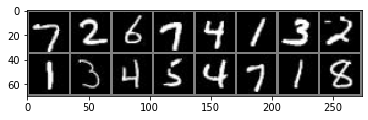

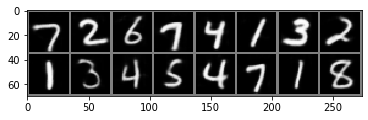

[78/200][0/165] Loss_VAE: 52.7348 KLD: 28.5038 MSE: 24.2310
[78/200][20/165] Loss_VAE: 53.0616 KLD: 28.2008 MSE: 24.8608
[78/200][40/165] Loss_VAE: 52.0098 KLD: 28.0783 MSE: 23.9315
[78/200][60/165] Loss_VAE: 50.8469 KLD: 27.7471 MSE: 23.0998
[78/200][80/165] Loss_VAE: 51.9205 KLD: 28.7432 MSE: 23.1773
[78/200][100/165] Loss_VAE: 50.4719 KLD: 27.2820 MSE: 23.1899
[78/200][120/165] Loss_VAE: 49.6889 KLD: 26.8798 MSE: 22.8092
[78/200][140/165] Loss_VAE: 51.0842 KLD: 27.9550 MSE: 23.1292
[78/200][160/165] Loss_VAE: 51.4597 KLD: 28.0721 MSE: 23.3876


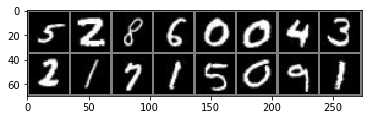

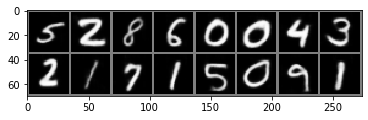

[79/200][0/165] Loss_VAE: 50.9703 KLD: 27.9347 MSE: 23.0356
[79/200][20/165] Loss_VAE: 52.4539 KLD: 28.7439 MSE: 23.7100
[79/200][40/165] Loss_VAE: 52.2786 KLD: 28.5313 MSE: 23.7473
[79/200][60/165] Loss_VAE: 51.8905 KLD: 27.8733 MSE: 24.0172
[79/200][80/165] Loss_VAE: 51.7947 KLD: 28.3833 MSE: 23.4115
[79/200][100/165] Loss_VAE: 51.8625 KLD: 28.4435 MSE: 23.4189
[79/200][120/165] Loss_VAE: 50.9949 KLD: 28.1206 MSE: 22.8743
[79/200][140/165] Loss_VAE: 51.1656 KLD: 28.1490 MSE: 23.0165
[79/200][160/165] Loss_VAE: 52.3544 KLD: 28.3988 MSE: 23.9556


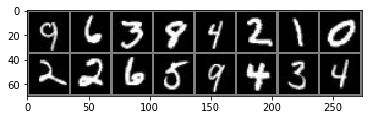

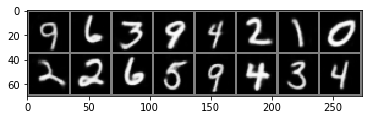

[80/200][0/165] Loss_VAE: 51.5401 KLD: 28.2025 MSE: 23.3376
[80/200][20/165] Loss_VAE: 53.0044 KLD: 28.6549 MSE: 24.3496
[80/200][40/165] Loss_VAE: 50.3686 KLD: 27.5564 MSE: 22.8122
[80/200][60/165] Loss_VAE: 51.8917 KLD: 28.1637 MSE: 23.7280
[80/200][80/165] Loss_VAE: 51.9397 KLD: 28.3606 MSE: 23.5791
[80/200][100/165] Loss_VAE: 52.2124 KLD: 28.1934 MSE: 24.0190
[80/200][120/165] Loss_VAE: 52.0346 KLD: 28.4056 MSE: 23.6290
[80/200][140/165] Loss_VAE: 52.0440 KLD: 28.2837 MSE: 23.7603
[80/200][160/165] Loss_VAE: 50.6246 KLD: 27.7763 MSE: 22.8483


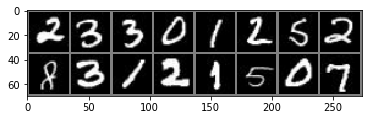

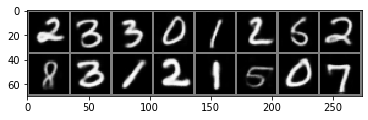

[81/200][0/165] Loss_VAE: 50.7703 KLD: 27.1194 MSE: 23.6509
[81/200][20/165] Loss_VAE: 49.9624 KLD: 26.6073 MSE: 23.3551
[81/200][40/165] Loss_VAE: 52.0952 KLD: 28.4337 MSE: 23.6616
[81/200][60/165] Loss_VAE: 50.7760 KLD: 27.9068 MSE: 22.8692
[81/200][80/165] Loss_VAE: 50.7548 KLD: 28.0013 MSE: 22.7535
[81/200][100/165] Loss_VAE: 49.2039 KLD: 27.4511 MSE: 21.7528
[81/200][120/165] Loss_VAE: 50.9203 KLD: 28.0296 MSE: 22.8907
[81/200][140/165] Loss_VAE: 50.5314 KLD: 28.0091 MSE: 22.5222
[81/200][160/165] Loss_VAE: 49.9869 KLD: 27.5436 MSE: 22.4433


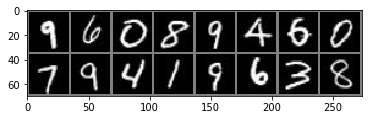

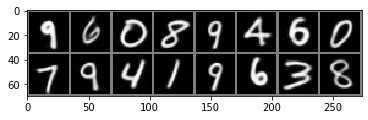

[82/200][0/165] Loss_VAE: 51.4453 KLD: 28.0135 MSE: 23.4317
[82/200][20/165] Loss_VAE: 50.6389 KLD: 27.5928 MSE: 23.0461
[82/200][40/165] Loss_VAE: 51.8243 KLD: 28.4087 MSE: 23.4156
[82/200][60/165] Loss_VAE: 50.7603 KLD: 27.6762 MSE: 23.0842
[82/200][80/165] Loss_VAE: 51.0265 KLD: 27.3548 MSE: 23.6717
[82/200][100/165] Loss_VAE: 51.3587 KLD: 27.7407 MSE: 23.6181
[82/200][120/165] Loss_VAE: 51.9617 KLD: 28.4970 MSE: 23.4648
[82/200][140/165] Loss_VAE: 50.2285 KLD: 27.1393 MSE: 23.0892
[82/200][160/165] Loss_VAE: 50.8979 KLD: 27.3656 MSE: 23.5323


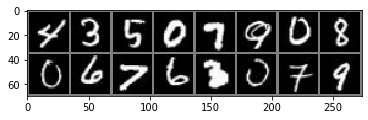

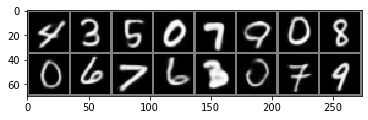

[83/200][0/165] Loss_VAE: 52.2929 KLD: 28.6801 MSE: 23.6127
[83/200][20/165] Loss_VAE: 51.0609 KLD: 27.7223 MSE: 23.3386
[83/200][40/165] Loss_VAE: 51.3671 KLD: 28.0099 MSE: 23.3572
[83/200][60/165] Loss_VAE: 54.8383 KLD: 29.2252 MSE: 25.6131
[83/200][80/165] Loss_VAE: 50.2002 KLD: 27.3204 MSE: 22.8799
[83/200][100/165] Loss_VAE: 52.3299 KLD: 28.4053 MSE: 23.9247
[83/200][120/165] Loss_VAE: 50.6244 KLD: 27.5668 MSE: 23.0575
[83/200][140/165] Loss_VAE: 51.2793 KLD: 27.9592 MSE: 23.3201
[83/200][160/165] Loss_VAE: 51.1035 KLD: 27.9901 MSE: 23.1134


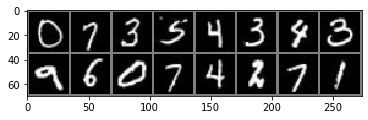

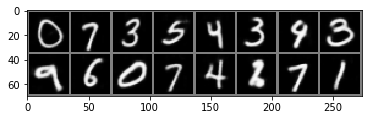

[84/200][0/165] Loss_VAE: 52.4836 KLD: 28.5186 MSE: 23.9650
[84/200][20/165] Loss_VAE: 51.4789 KLD: 27.7189 MSE: 23.7600
[84/200][40/165] Loss_VAE: 50.3174 KLD: 27.3659 MSE: 22.9515
[84/200][60/165] Loss_VAE: 52.1087 KLD: 27.8244 MSE: 24.2844
[84/200][80/165] Loss_VAE: 51.6994 KLD: 28.2542 MSE: 23.4452
[84/200][100/165] Loss_VAE: 50.6543 KLD: 27.8348 MSE: 22.8195
[84/200][120/165] Loss_VAE: 52.0076 KLD: 27.7898 MSE: 24.2177
[84/200][140/165] Loss_VAE: 51.1574 KLD: 27.9333 MSE: 23.2241
[84/200][160/165] Loss_VAE: 51.8378 KLD: 28.5091 MSE: 23.3287


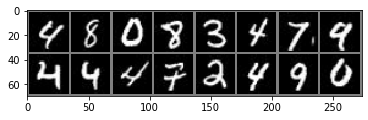

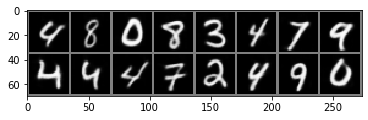

[85/200][0/165] Loss_VAE: 52.3628 KLD: 28.5020 MSE: 23.8608
[85/200][20/165] Loss_VAE: 51.3547 KLD: 27.7761 MSE: 23.5787
[85/200][40/165] Loss_VAE: 52.9260 KLD: 28.3779 MSE: 24.5481
[85/200][60/165] Loss_VAE: 52.2472 KLD: 28.7560 MSE: 23.4912
[85/200][80/165] Loss_VAE: 52.0564 KLD: 28.0022 MSE: 24.0542
[85/200][100/165] Loss_VAE: 51.3030 KLD: 27.5243 MSE: 23.7787
[85/200][120/165] Loss_VAE: 50.6960 KLD: 27.8261 MSE: 22.8699
[85/200][140/165] Loss_VAE: 51.2165 KLD: 28.1231 MSE: 23.0935
[85/200][160/165] Loss_VAE: 49.5383 KLD: 27.1072 MSE: 22.4310


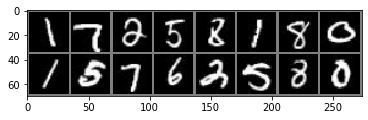

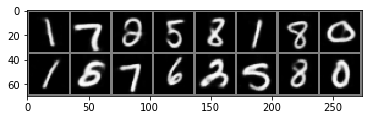

[86/200][0/165] Loss_VAE: 49.0055 KLD: 26.8525 MSE: 22.1530
[86/200][20/165] Loss_VAE: 52.0429 KLD: 28.3146 MSE: 23.7283
[86/200][40/165] Loss_VAE: 49.8938 KLD: 27.1534 MSE: 22.7405
[86/200][60/165] Loss_VAE: 50.8623 KLD: 27.9636 MSE: 22.8987
[86/200][80/165] Loss_VAE: 49.8987 KLD: 27.3064 MSE: 22.5923
[86/200][100/165] Loss_VAE: 51.1522 KLD: 27.5637 MSE: 23.5885
[86/200][120/165] Loss_VAE: 49.6443 KLD: 26.8424 MSE: 22.8019
[86/200][140/165] Loss_VAE: 51.5013 KLD: 28.2937 MSE: 23.2076
[86/200][160/165] Loss_VAE: 50.6330 KLD: 27.6896 MSE: 22.9434


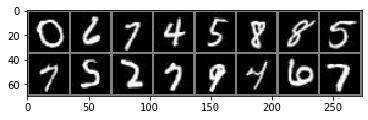

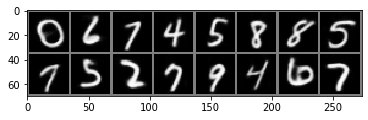

[87/200][0/165] Loss_VAE: 50.7406 KLD: 27.3719 MSE: 23.3687
[87/200][20/165] Loss_VAE: 51.2379 KLD: 27.7557 MSE: 23.4822
[87/200][40/165] Loss_VAE: 53.6966 KLD: 28.4005 MSE: 25.2961
[87/200][60/165] Loss_VAE: 48.8399 KLD: 27.4405 MSE: 21.3994
[87/200][80/165] Loss_VAE: 52.8498 KLD: 28.6525 MSE: 24.1973
[87/200][100/165] Loss_VAE: 51.0375 KLD: 27.7427 MSE: 23.2949
[87/200][120/165] Loss_VAE: 50.6159 KLD: 27.3967 MSE: 23.2192
[87/200][140/165] Loss_VAE: 50.7476 KLD: 27.9038 MSE: 22.8439
[87/200][160/165] Loss_VAE: 50.7893 KLD: 28.0326 MSE: 22.7567


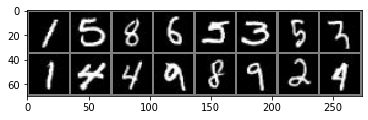

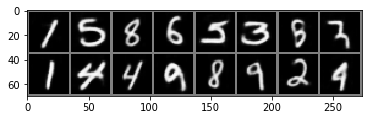

[88/200][0/165] Loss_VAE: 49.8881 KLD: 26.7280 MSE: 23.1601
[88/200][20/165] Loss_VAE: 49.2649 KLD: 26.4401 MSE: 22.8248
[88/200][40/165] Loss_VAE: 50.8646 KLD: 27.3493 MSE: 23.5153
[88/200][60/165] Loss_VAE: 51.3160 KLD: 27.1891 MSE: 24.1269
[88/200][80/165] Loss_VAE: 50.4072 KLD: 27.5150 MSE: 22.8921
[88/200][100/165] Loss_VAE: 51.2371 KLD: 28.1446 MSE: 23.0925
[88/200][120/165] Loss_VAE: 50.2241 KLD: 27.7734 MSE: 22.4506
[88/200][140/165] Loss_VAE: 51.3231 KLD: 27.7671 MSE: 23.5560
[88/200][160/165] Loss_VAE: 51.1454 KLD: 27.1503 MSE: 23.9952


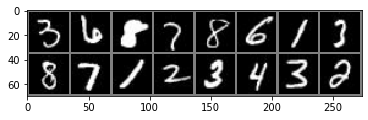

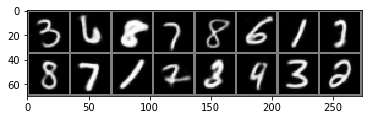

[89/200][0/165] Loss_VAE: 51.4608 KLD: 28.0192 MSE: 23.4416
[89/200][20/165] Loss_VAE: 49.1875 KLD: 27.3208 MSE: 21.8667
[89/200][40/165] Loss_VAE: 49.8800 KLD: 27.3425 MSE: 22.5375
[89/200][60/165] Loss_VAE: 50.6637 KLD: 27.8126 MSE: 22.8511
[89/200][80/165] Loss_VAE: 49.5790 KLD: 27.0847 MSE: 22.4943
[89/200][100/165] Loss_VAE: 51.0141 KLD: 26.9825 MSE: 24.0317
[89/200][120/165] Loss_VAE: 50.0113 KLD: 27.4636 MSE: 22.5477
[89/200][140/165] Loss_VAE: 49.6621 KLD: 27.1304 MSE: 22.5317
[89/200][160/165] Loss_VAE: 50.2221 KLD: 27.3864 MSE: 22.8357


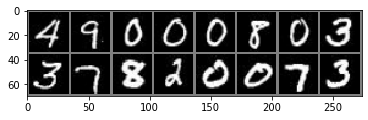

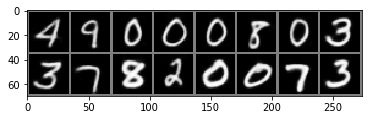

[90/200][0/165] Loss_VAE: 51.8519 KLD: 28.5090 MSE: 23.3430
[90/200][20/165] Loss_VAE: 50.5972 KLD: 27.6421 MSE: 22.9551
[90/200][40/165] Loss_VAE: 49.9046 KLD: 26.6982 MSE: 23.2064
[90/200][60/165] Loss_VAE: 50.6098 KLD: 27.2041 MSE: 23.4057
[90/200][80/165] Loss_VAE: 51.0124 KLD: 27.5634 MSE: 23.4491
[90/200][100/165] Loss_VAE: 48.5932 KLD: 26.8154 MSE: 21.7778
[90/200][120/165] Loss_VAE: 51.8530 KLD: 28.3633 MSE: 23.4896
[90/200][140/165] Loss_VAE: 50.7867 KLD: 27.4043 MSE: 23.3824
[90/200][160/165] Loss_VAE: 52.3003 KLD: 28.6551 MSE: 23.6452


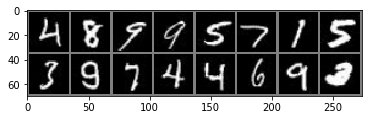

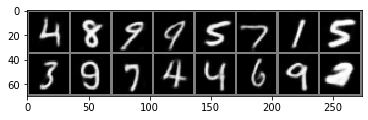

[91/200][0/165] Loss_VAE: 52.1387 KLD: 28.5339 MSE: 23.6048
[91/200][20/165] Loss_VAE: 52.8172 KLD: 28.8458 MSE: 23.9714
[91/200][40/165] Loss_VAE: 51.5458 KLD: 27.6219 MSE: 23.9239
[91/200][60/165] Loss_VAE: 51.4106 KLD: 28.0133 MSE: 23.3973
[91/200][80/165] Loss_VAE: 51.5491 KLD: 28.5070 MSE: 23.0421
[91/200][100/165] Loss_VAE: 49.1576 KLD: 27.0476 MSE: 22.1100
[91/200][120/165] Loss_VAE: 52.2521 KLD: 28.2574 MSE: 23.9947
[91/200][140/165] Loss_VAE: 52.2907 KLD: 27.6752 MSE: 24.6155
[91/200][160/165] Loss_VAE: 50.1994 KLD: 27.3326 MSE: 22.8668


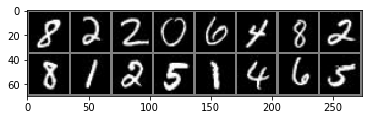

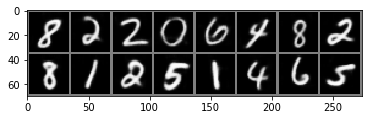

[92/200][0/165] Loss_VAE: 51.5222 KLD: 27.5818 MSE: 23.9404
[92/200][20/165] Loss_VAE: 52.1747 KLD: 27.8623 MSE: 24.3124
[92/200][40/165] Loss_VAE: 52.7500 KLD: 28.3645 MSE: 24.3855
[92/200][60/165] Loss_VAE: 50.6863 KLD: 27.4989 MSE: 23.1874
[92/200][80/165] Loss_VAE: 50.1439 KLD: 26.8659 MSE: 23.2781
[92/200][100/165] Loss_VAE: 51.3789 KLD: 27.7583 MSE: 23.6206
[92/200][120/165] Loss_VAE: 51.6952 KLD: 28.1111 MSE: 23.5841
[92/200][140/165] Loss_VAE: 50.9478 KLD: 27.5874 MSE: 23.3605
[92/200][160/165] Loss_VAE: 49.2532 KLD: 26.7314 MSE: 22.5218


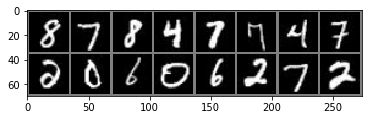

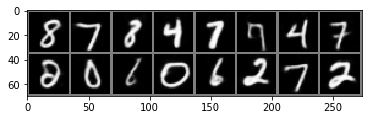

[93/200][0/165] Loss_VAE: 50.2400 KLD: 27.4161 MSE: 22.8239
[93/200][20/165] Loss_VAE: 50.6552 KLD: 27.4610 MSE: 23.1942
[93/200][40/165] Loss_VAE: 51.1372 KLD: 27.8716 MSE: 23.2656
[93/200][60/165] Loss_VAE: 50.2205 KLD: 27.6770 MSE: 22.5435
[93/200][80/165] Loss_VAE: 52.1903 KLD: 28.0055 MSE: 24.1848
[93/200][100/165] Loss_VAE: 50.2743 KLD: 27.7264 MSE: 22.5478
[93/200][120/165] Loss_VAE: 52.6086 KLD: 28.7489 MSE: 23.8597
[93/200][140/165] Loss_VAE: 50.4225 KLD: 27.4897 MSE: 22.9328
[93/200][160/165] Loss_VAE: 49.7392 KLD: 27.2839 MSE: 22.4553


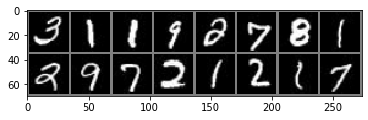

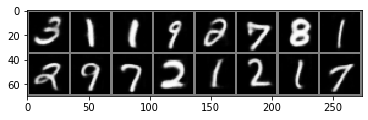

[94/200][0/165] Loss_VAE: 50.1538 KLD: 27.3735 MSE: 22.7804
[94/200][20/165] Loss_VAE: 50.4924 KLD: 27.3376 MSE: 23.1548
[94/200][40/165] Loss_VAE: 49.1439 KLD: 26.9928 MSE: 22.1511
[94/200][60/165] Loss_VAE: 50.6329 KLD: 28.2278 MSE: 22.4051
[94/200][80/165] Loss_VAE: 50.3447 KLD: 27.7162 MSE: 22.6285
[94/200][100/165] Loss_VAE: 49.9510 KLD: 27.3662 MSE: 22.5848
[94/200][120/165] Loss_VAE: 50.4848 KLD: 27.5037 MSE: 22.9811
[94/200][140/165] Loss_VAE: 50.4256 KLD: 27.5658 MSE: 22.8597
[94/200][160/165] Loss_VAE: 50.2870 KLD: 27.9732 MSE: 22.3138


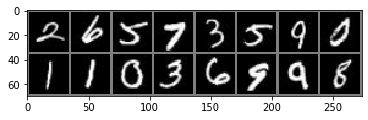

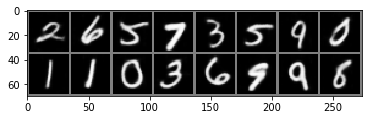

[95/200][0/165] Loss_VAE: 50.8992 KLD: 27.5284 MSE: 23.3708
[95/200][20/165] Loss_VAE: 50.5513 KLD: 28.1707 MSE: 22.3806
[95/200][40/165] Loss_VAE: 50.7049 KLD: 27.3979 MSE: 23.3070
[95/200][60/165] Loss_VAE: 52.1475 KLD: 28.5382 MSE: 23.6093
[95/200][80/165] Loss_VAE: 50.6396 KLD: 27.4941 MSE: 23.1455
[95/200][100/165] Loss_VAE: 52.5762 KLD: 28.4535 MSE: 24.1227
[95/200][120/165] Loss_VAE: 49.8432 KLD: 27.2463 MSE: 22.5969
[95/200][140/165] Loss_VAE: 50.5327 KLD: 27.4510 MSE: 23.0817
[95/200][160/165] Loss_VAE: 49.9406 KLD: 27.0508 MSE: 22.8897


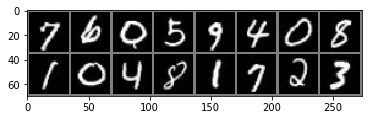

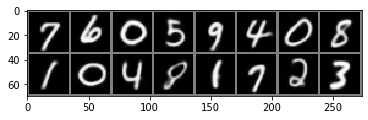

[96/200][0/165] Loss_VAE: 50.4303 KLD: 27.2887 MSE: 23.1415
[96/200][20/165] Loss_VAE: 51.2483 KLD: 27.8287 MSE: 23.4195
[96/200][40/165] Loss_VAE: 51.6651 KLD: 28.3218 MSE: 23.3434
[96/200][60/165] Loss_VAE: 50.1302 KLD: 27.4720 MSE: 22.6582
[96/200][80/165] Loss_VAE: 50.9014 KLD: 27.4939 MSE: 23.4075
[96/200][100/165] Loss_VAE: 50.9700 KLD: 27.8720 MSE: 23.0980
[96/200][120/165] Loss_VAE: 49.4324 KLD: 27.6055 MSE: 21.8269
[96/200][140/165] Loss_VAE: 50.7762 KLD: 27.1825 MSE: 23.5937
[96/200][160/165] Loss_VAE: 51.4600 KLD: 27.4205 MSE: 24.0395


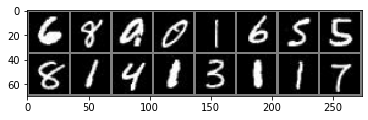

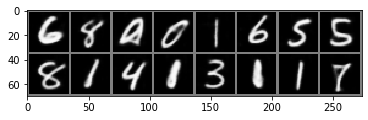

[97/200][0/165] Loss_VAE: 50.0843 KLD: 27.1777 MSE: 22.9066
[97/200][20/165] Loss_VAE: 51.4796 KLD: 27.8022 MSE: 23.6774
[97/200][40/165] Loss_VAE: 51.6903 KLD: 28.0212 MSE: 23.6691
[97/200][60/165] Loss_VAE: 49.2989 KLD: 27.3460 MSE: 21.9529
[97/200][80/165] Loss_VAE: 49.9103 KLD: 27.1582 MSE: 22.7521
[97/200][100/165] Loss_VAE: 51.0584 KLD: 27.7683 MSE: 23.2901
[97/200][120/165] Loss_VAE: 49.9878 KLD: 27.2597 MSE: 22.7281
[97/200][140/165] Loss_VAE: 50.8361 KLD: 27.4362 MSE: 23.3999
[97/200][160/165] Loss_VAE: 52.3675 KLD: 28.2493 MSE: 24.1183


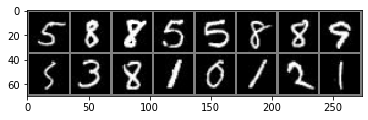

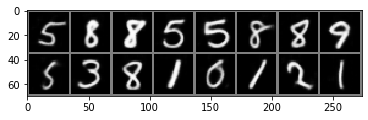

[98/200][0/165] Loss_VAE: 49.0895 KLD: 27.0657 MSE: 22.0238
[98/200][20/165] Loss_VAE: 51.3635 KLD: 28.3511 MSE: 23.0124
[98/200][40/165] Loss_VAE: 50.1090 KLD: 27.1490 MSE: 22.9600
[98/200][60/165] Loss_VAE: 51.1912 KLD: 27.8596 MSE: 23.3316
[98/200][80/165] Loss_VAE: 51.3222 KLD: 27.9051 MSE: 23.4171
[98/200][100/165] Loss_VAE: 50.5104 KLD: 28.0599 MSE: 22.4505
[98/200][120/165] Loss_VAE: 49.5933 KLD: 26.9015 MSE: 22.6918
[98/200][140/165] Loss_VAE: 51.6813 KLD: 28.0587 MSE: 23.6226
[98/200][160/165] Loss_VAE: 48.9133 KLD: 26.8338 MSE: 22.0795


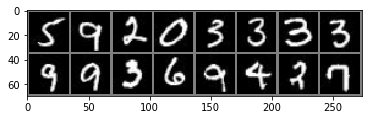

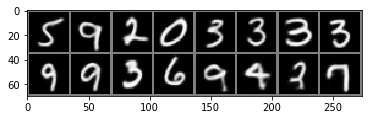

[99/200][0/165] Loss_VAE: 50.4165 KLD: 27.1535 MSE: 23.2630
[99/200][20/165] Loss_VAE: 50.9119 KLD: 27.6882 MSE: 23.2237
[99/200][40/165] Loss_VAE: 49.6550 KLD: 26.9306 MSE: 22.7245
[99/200][60/165] Loss_VAE: 49.6319 KLD: 27.7131 MSE: 21.9189
[99/200][80/165] Loss_VAE: 49.6979 KLD: 27.0041 MSE: 22.6938
[99/200][100/165] Loss_VAE: 49.9071 KLD: 26.9898 MSE: 22.9173
[99/200][120/165] Loss_VAE: 50.2682 KLD: 27.3781 MSE: 22.8901
[99/200][140/165] Loss_VAE: 51.2249 KLD: 27.7080 MSE: 23.5169
[99/200][160/165] Loss_VAE: 50.9725 KLD: 27.7703 MSE: 23.2022


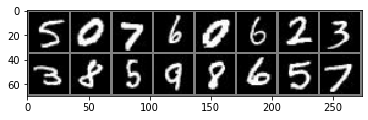

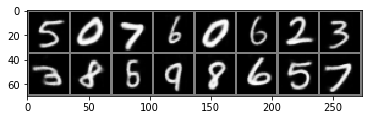

[100/200][0/165] Loss_VAE: 50.0069 KLD: 27.4941 MSE: 22.5128
[100/200][20/165] Loss_VAE: 51.4381 KLD: 28.1893 MSE: 23.2488
[100/200][40/165] Loss_VAE: 50.3331 KLD: 27.2668 MSE: 23.0663
[100/200][60/165] Loss_VAE: 50.2681 KLD: 27.0977 MSE: 23.1704
[100/200][80/165] Loss_VAE: 51.1645 KLD: 28.2006 MSE: 22.9639
[100/200][100/165] Loss_VAE: 49.8313 KLD: 27.3339 MSE: 22.4974
[100/200][120/165] Loss_VAE: 49.2511 KLD: 27.0581 MSE: 22.1930
[100/200][140/165] Loss_VAE: 51.2307 KLD: 28.2102 MSE: 23.0205
[100/200][160/165] Loss_VAE: 50.3182 KLD: 27.6997 MSE: 22.6185


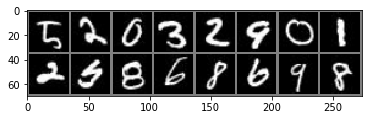

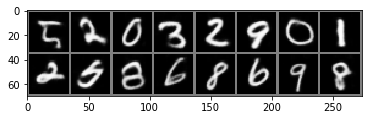

[101/200][0/165] Loss_VAE: 52.4520 KLD: 28.3135 MSE: 24.1385
[101/200][20/165] Loss_VAE: 50.2321 KLD: 27.5950 MSE: 22.6371
[101/200][40/165] Loss_VAE: 51.9122 KLD: 28.5354 MSE: 23.3768
[101/200][60/165] Loss_VAE: 49.5639 KLD: 27.1570 MSE: 22.4069
[101/200][80/165] Loss_VAE: 50.5520 KLD: 27.6288 MSE: 22.9232
[101/200][100/165] Loss_VAE: 50.1165 KLD: 27.1684 MSE: 22.9481
[101/200][120/165] Loss_VAE: 50.1751 KLD: 27.8413 MSE: 22.3338
[101/200][140/165] Loss_VAE: 51.4945 KLD: 28.0919 MSE: 23.4026
[101/200][160/165] Loss_VAE: 51.0105 KLD: 28.0515 MSE: 22.9590


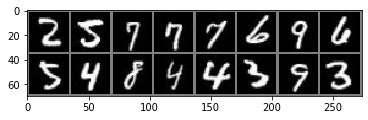

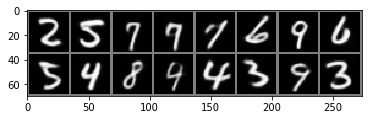

[102/200][0/165] Loss_VAE: 51.8025 KLD: 28.0572 MSE: 23.7452
[102/200][20/165] Loss_VAE: 50.9311 KLD: 28.1685 MSE: 22.7626
[102/200][40/165] Loss_VAE: 49.3897 KLD: 27.2332 MSE: 22.1565
[102/200][60/165] Loss_VAE: 50.8278 KLD: 28.1431 MSE: 22.6847
[102/200][80/165] Loss_VAE: 50.2563 KLD: 27.0781 MSE: 23.1783
[102/200][100/165] Loss_VAE: 47.7271 KLD: 26.2004 MSE: 21.5266
[102/200][120/165] Loss_VAE: 50.4123 KLD: 27.7088 MSE: 22.7035
[102/200][140/165] Loss_VAE: 49.7969 KLD: 27.0471 MSE: 22.7498
[102/200][160/165] Loss_VAE: 50.4656 KLD: 27.7620 MSE: 22.7036


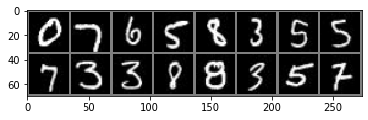

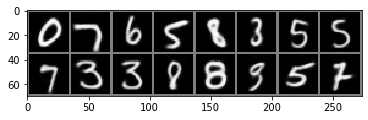

[103/200][0/165] Loss_VAE: 51.1387 KLD: 27.7626 MSE: 23.3761
[103/200][20/165] Loss_VAE: 49.2368 KLD: 27.0158 MSE: 22.2210
[103/200][40/165] Loss_VAE: 52.2164 KLD: 28.6202 MSE: 23.5962
[103/200][60/165] Loss_VAE: 50.5507 KLD: 27.3314 MSE: 23.2193
[103/200][80/165] Loss_VAE: 50.3133 KLD: 27.6056 MSE: 22.7078
[103/200][100/165] Loss_VAE: 50.1807 KLD: 27.4604 MSE: 22.7203
[103/200][120/165] Loss_VAE: 50.0769 KLD: 27.0782 MSE: 22.9986
[103/200][140/165] Loss_VAE: 50.4162 KLD: 27.8863 MSE: 22.5299
[103/200][160/165] Loss_VAE: 51.5456 KLD: 28.0048 MSE: 23.5408


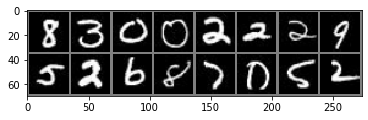

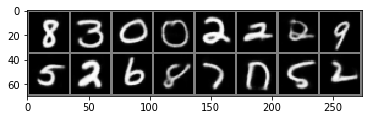

[104/200][0/165] Loss_VAE: 49.7591 KLD: 27.4007 MSE: 22.3585
[104/200][20/165] Loss_VAE: 49.7610 KLD: 27.6679 MSE: 22.0931
[104/200][40/165] Loss_VAE: 52.3315 KLD: 28.4775 MSE: 23.8539
[104/200][60/165] Loss_VAE: 51.7803 KLD: 28.3289 MSE: 23.4514
[104/200][80/165] Loss_VAE: 51.2881 KLD: 28.2263 MSE: 23.0618
[104/200][100/165] Loss_VAE: 49.5284 KLD: 27.0330 MSE: 22.4954
[104/200][120/165] Loss_VAE: 50.9615 KLD: 27.4580 MSE: 23.5035
[104/200][140/165] Loss_VAE: 51.2407 KLD: 28.0994 MSE: 23.1413
[104/200][160/165] Loss_VAE: 51.4564 KLD: 27.7723 MSE: 23.6841


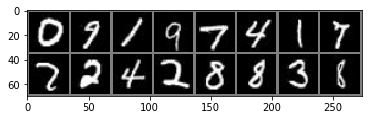

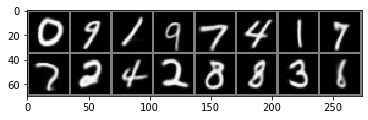

[105/200][0/165] Loss_VAE: 49.9815 KLD: 27.4583 MSE: 22.5232
[105/200][20/165] Loss_VAE: 50.9757 KLD: 27.6674 MSE: 23.3083
[105/200][40/165] Loss_VAE: 50.6862 KLD: 28.3475 MSE: 22.3387
[105/200][60/165] Loss_VAE: 50.7117 KLD: 27.7087 MSE: 23.0030
[105/200][80/165] Loss_VAE: 49.7812 KLD: 27.2552 MSE: 22.5260
[105/200][100/165] Loss_VAE: 51.7512 KLD: 27.9331 MSE: 23.8181
[105/200][120/165] Loss_VAE: 50.7225 KLD: 27.5774 MSE: 23.1451
[105/200][140/165] Loss_VAE: 49.2435 KLD: 26.9799 MSE: 22.2636
[105/200][160/165] Loss_VAE: 50.8862 KLD: 27.2512 MSE: 23.6349


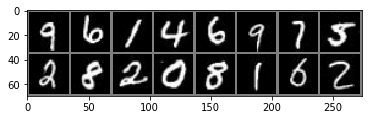

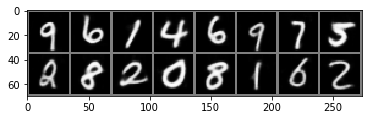

[106/200][0/165] Loss_VAE: 50.1997 KLD: 26.9288 MSE: 23.2709
[106/200][20/165] Loss_VAE: 49.0941 KLD: 26.4508 MSE: 22.6432
[106/200][40/165] Loss_VAE: 49.3784 KLD: 27.5203 MSE: 21.8581
[106/200][60/165] Loss_VAE: 48.7855 KLD: 27.0447 MSE: 21.7408
[106/200][80/165] Loss_VAE: 49.9919 KLD: 27.4588 MSE: 22.5331
[106/200][100/165] Loss_VAE: 49.7062 KLD: 27.1869 MSE: 22.5193
[106/200][120/165] Loss_VAE: 50.3444 KLD: 27.9838 MSE: 22.3606
[106/200][140/165] Loss_VAE: 49.6620 KLD: 27.0279 MSE: 22.6341
[106/200][160/165] Loss_VAE: 49.5161 KLD: 27.0941 MSE: 22.4220


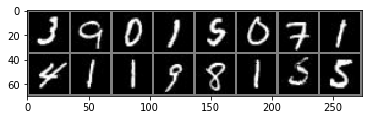

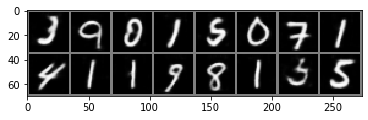

[107/200][0/165] Loss_VAE: 51.8142 KLD: 27.6908 MSE: 24.1235
[107/200][20/165] Loss_VAE: 49.0155 KLD: 27.1308 MSE: 21.8847
[107/200][40/165] Loss_VAE: 49.8610 KLD: 27.3662 MSE: 22.4948
[107/200][60/165] Loss_VAE: 49.5564 KLD: 27.1621 MSE: 22.3943
[107/200][80/165] Loss_VAE: 49.2058 KLD: 27.0872 MSE: 22.1186
[107/200][100/165] Loss_VAE: 51.3303 KLD: 27.9609 MSE: 23.3694
[107/200][120/165] Loss_VAE: 50.9679 KLD: 27.5174 MSE: 23.4504
[107/200][140/165] Loss_VAE: 52.3595 KLD: 28.8979 MSE: 23.4615
[107/200][160/165] Loss_VAE: 49.0420 KLD: 26.6253 MSE: 22.4167


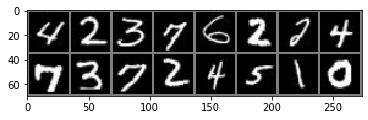

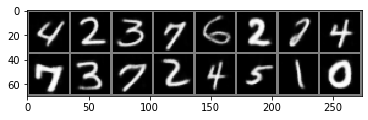

[108/200][0/165] Loss_VAE: 50.6768 KLD: 28.0244 MSE: 22.6524
[108/200][20/165] Loss_VAE: 48.8602 KLD: 26.6258 MSE: 22.2344
[108/200][40/165] Loss_VAE: 50.3346 KLD: 27.2507 MSE: 23.0839
[108/200][60/165] Loss_VAE: 51.0983 KLD: 28.1937 MSE: 22.9046
[108/200][80/165] Loss_VAE: 50.4515 KLD: 27.4034 MSE: 23.0481
[108/200][100/165] Loss_VAE: 49.4811 KLD: 26.7544 MSE: 22.7267
[108/200][120/165] Loss_VAE: 49.0225 KLD: 27.0166 MSE: 22.0059
[108/200][140/165] Loss_VAE: 50.8010 KLD: 27.2508 MSE: 23.5502
[108/200][160/165] Loss_VAE: 51.6466 KLD: 27.6064 MSE: 24.0401


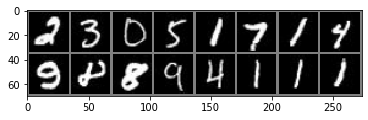

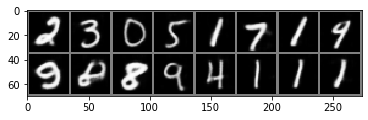

[109/200][0/165] Loss_VAE: 51.2736 KLD: 27.6264 MSE: 23.6472
[109/200][20/165] Loss_VAE: 49.3969 KLD: 27.2095 MSE: 22.1873
[109/200][40/165] Loss_VAE: 48.9907 KLD: 27.5362 MSE: 21.4545
[109/200][60/165] Loss_VAE: 49.8635 KLD: 27.3774 MSE: 22.4861
[109/200][80/165] Loss_VAE: 49.7150 KLD: 27.2208 MSE: 22.4942
[109/200][100/165] Loss_VAE: 51.7592 KLD: 28.7060 MSE: 23.0532
[109/200][120/165] Loss_VAE: 51.1253 KLD: 27.8629 MSE: 23.2623
[109/200][140/165] Loss_VAE: 52.2003 KLD: 28.2371 MSE: 23.9632
[109/200][160/165] Loss_VAE: 51.4636 KLD: 28.0230 MSE: 23.4406


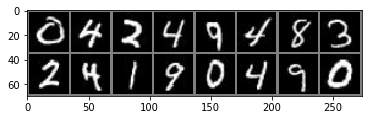

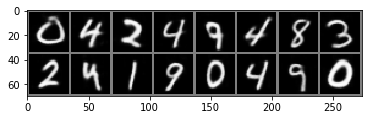

[110/200][0/165] Loss_VAE: 50.2149 KLD: 27.4769 MSE: 22.7381
[110/200][20/165] Loss_VAE: 49.5629 KLD: 27.6093 MSE: 21.9535
[110/200][40/165] Loss_VAE: 49.9338 KLD: 27.6728 MSE: 22.2609
[110/200][60/165] Loss_VAE: 48.4730 KLD: 26.7931 MSE: 21.6799
[110/200][80/165] Loss_VAE: 49.2747 KLD: 26.8003 MSE: 22.4744
[110/200][100/165] Loss_VAE: 50.1391 KLD: 27.3128 MSE: 22.8264
[110/200][120/165] Loss_VAE: 51.6001 KLD: 27.7143 MSE: 23.8858
[110/200][140/165] Loss_VAE: 50.8959 KLD: 27.9693 MSE: 22.9266
[110/200][160/165] Loss_VAE: 52.4347 KLD: 28.1799 MSE: 24.2548


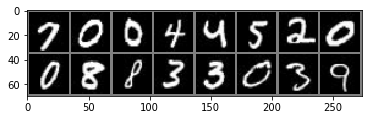

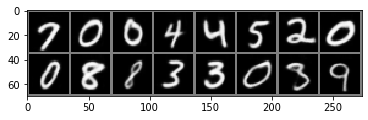

[111/200][0/165] Loss_VAE: 51.9581 KLD: 27.8613 MSE: 24.0968
[111/200][20/165] Loss_VAE: 49.3266 KLD: 27.3263 MSE: 22.0003
[111/200][40/165] Loss_VAE: 51.0368 KLD: 27.4139 MSE: 23.6229
[111/200][60/165] Loss_VAE: 48.3103 KLD: 26.4157 MSE: 21.8946
[111/200][80/165] Loss_VAE: 49.9963 KLD: 27.4284 MSE: 22.5679
[111/200][100/165] Loss_VAE: 49.8394 KLD: 27.1264 MSE: 22.7130
[111/200][120/165] Loss_VAE: 48.8640 KLD: 27.3421 MSE: 21.5219
[111/200][140/165] Loss_VAE: 49.8785 KLD: 27.5623 MSE: 22.3161
[111/200][160/165] Loss_VAE: 48.8022 KLD: 26.9224 MSE: 21.8798


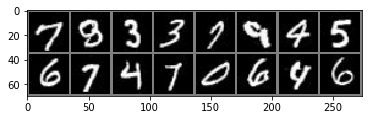

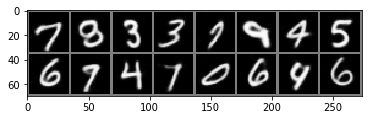

[112/200][0/165] Loss_VAE: 50.8539 KLD: 28.0903 MSE: 22.7635
[112/200][20/165] Loss_VAE: 49.2736 KLD: 27.3479 MSE: 21.9256
[112/200][40/165] Loss_VAE: 50.6430 KLD: 27.9763 MSE: 22.6667
[112/200][60/165] Loss_VAE: 50.4846 KLD: 27.3155 MSE: 23.1691
[112/200][80/165] Loss_VAE: 50.7114 KLD: 27.2644 MSE: 23.4470
[112/200][100/165] Loss_VAE: 49.2487 KLD: 27.1118 MSE: 22.1370
[112/200][120/165] Loss_VAE: 49.6316 KLD: 27.7435 MSE: 21.8880
[112/200][140/165] Loss_VAE: 51.1748 KLD: 27.8503 MSE: 23.3245
[112/200][160/165] Loss_VAE: 50.1150 KLD: 27.7557 MSE: 22.3593


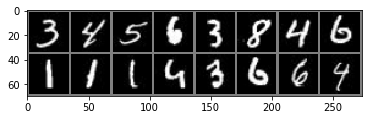

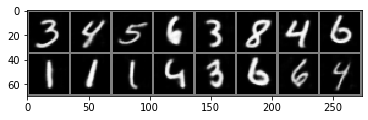

[113/200][0/165] Loss_VAE: 51.0246 KLD: 27.8962 MSE: 23.1284
[113/200][20/165] Loss_VAE: 49.1920 KLD: 26.9528 MSE: 22.2392
[113/200][40/165] Loss_VAE: 51.1267 KLD: 28.3555 MSE: 22.7712
[113/200][60/165] Loss_VAE: 48.9945 KLD: 26.4364 MSE: 22.5580
[113/200][80/165] Loss_VAE: 51.4547 KLD: 27.9918 MSE: 23.4629
[113/200][100/165] Loss_VAE: 50.5536 KLD: 27.3215 MSE: 23.2321
[113/200][120/165] Loss_VAE: 50.1438 KLD: 27.2489 MSE: 22.8950
[113/200][140/165] Loss_VAE: 48.9813 KLD: 27.0410 MSE: 21.9403
[113/200][160/165] Loss_VAE: 49.1906 KLD: 26.9678 MSE: 22.2228


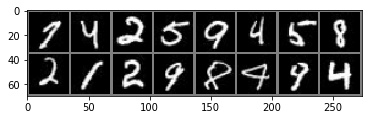

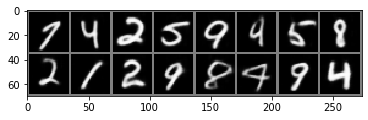

[114/200][0/165] Loss_VAE: 49.2439 KLD: 27.2061 MSE: 22.0378
[114/200][20/165] Loss_VAE: 49.5175 KLD: 27.3249 MSE: 22.1926
[114/200][40/165] Loss_VAE: 48.3823 KLD: 26.7815 MSE: 21.6008
[114/200][60/165] Loss_VAE: 49.6955 KLD: 27.0385 MSE: 22.6569
[114/200][80/165] Loss_VAE: 48.5732 KLD: 26.9705 MSE: 21.6027
[114/200][100/165] Loss_VAE: 50.4084 KLD: 27.4711 MSE: 22.9373
[114/200][120/165] Loss_VAE: 50.1144 KLD: 27.5587 MSE: 22.5557
[114/200][140/165] Loss_VAE: 49.9549 KLD: 27.2067 MSE: 22.7482
[114/200][160/165] Loss_VAE: 50.6377 KLD: 27.5164 MSE: 23.1213


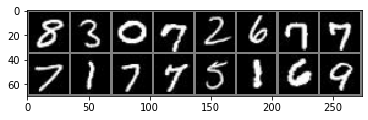

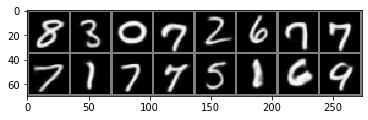

[115/200][0/165] Loss_VAE: 50.3870 KLD: 26.9717 MSE: 23.4153
[115/200][20/165] Loss_VAE: 51.3049 KLD: 28.1490 MSE: 23.1559
[115/200][40/165] Loss_VAE: 49.2115 KLD: 26.7856 MSE: 22.4259
[115/200][60/165] Loss_VAE: 52.4471 KLD: 28.0082 MSE: 24.4389
[115/200][80/165] Loss_VAE: 49.5036 KLD: 27.5134 MSE: 21.9903
[115/200][100/165] Loss_VAE: 49.1369 KLD: 26.8069 MSE: 22.3300
[115/200][120/165] Loss_VAE: 51.1272 KLD: 27.8847 MSE: 23.2425
[115/200][140/165] Loss_VAE: 51.2797 KLD: 28.4910 MSE: 22.7887
[115/200][160/165] Loss_VAE: 48.7285 KLD: 26.9303 MSE: 21.7982


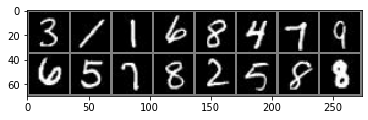

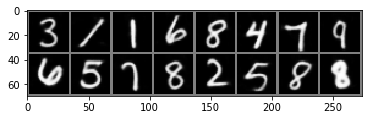

[116/200][0/165] Loss_VAE: 50.4264 KLD: 27.4818 MSE: 22.9446
[116/200][20/165] Loss_VAE: 49.4919 KLD: 27.0835 MSE: 22.4084
[116/200][40/165] Loss_VAE: 49.8358 KLD: 26.6538 MSE: 23.1819
[116/200][60/165] Loss_VAE: 47.5436 KLD: 26.5300 MSE: 21.0136
[116/200][80/165] Loss_VAE: 50.4896 KLD: 27.2061 MSE: 23.2835
[116/200][100/165] Loss_VAE: 49.7433 KLD: 27.1328 MSE: 22.6105
[116/200][120/165] Loss_VAE: 48.7423 KLD: 27.2737 MSE: 21.4686
[116/200][140/165] Loss_VAE: 49.3628 KLD: 27.1066 MSE: 22.2562
[116/200][160/165] Loss_VAE: 49.2089 KLD: 27.3403 MSE: 21.8686


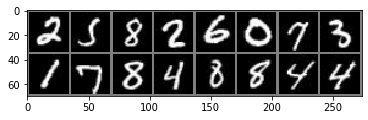

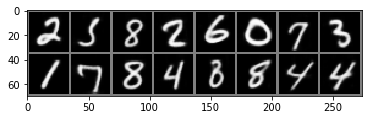

[117/200][0/165] Loss_VAE: 48.9241 KLD: 26.9086 MSE: 22.0154
[117/200][20/165] Loss_VAE: 50.3242 KLD: 27.2957 MSE: 23.0285
[117/200][40/165] Loss_VAE: 50.7301 KLD: 27.5997 MSE: 23.1303
[117/200][60/165] Loss_VAE: 51.0252 KLD: 27.9222 MSE: 23.1030
[117/200][80/165] Loss_VAE: 51.1479 KLD: 27.6621 MSE: 23.4857
[117/200][100/165] Loss_VAE: 51.2899 KLD: 28.0559 MSE: 23.2341
[117/200][120/165] Loss_VAE: 49.9874 KLD: 27.0029 MSE: 22.9845
[117/200][140/165] Loss_VAE: 49.3769 KLD: 26.7979 MSE: 22.5790
[117/200][160/165] Loss_VAE: 47.8260 KLD: 26.2749 MSE: 21.5511


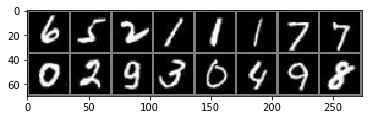

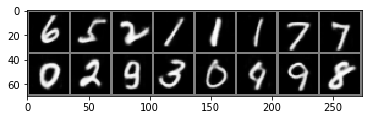

[118/200][0/165] Loss_VAE: 50.1670 KLD: 27.4731 MSE: 22.6938
[118/200][20/165] Loss_VAE: 48.8298 KLD: 26.8658 MSE: 21.9640
[118/200][40/165] Loss_VAE: 52.2860 KLD: 28.1796 MSE: 24.1065
[118/200][60/165] Loss_VAE: 51.4238 KLD: 28.2149 MSE: 23.2089
[118/200][80/165] Loss_VAE: 50.8155 KLD: 27.6106 MSE: 23.2049
[118/200][100/165] Loss_VAE: 49.5691 KLD: 27.0821 MSE: 22.4871
[118/200][120/165] Loss_VAE: 49.2227 KLD: 27.1728 MSE: 22.0500
[118/200][140/165] Loss_VAE: 49.1809 KLD: 27.1397 MSE: 22.0412
[118/200][160/165] Loss_VAE: 50.4701 KLD: 27.4088 MSE: 23.0613


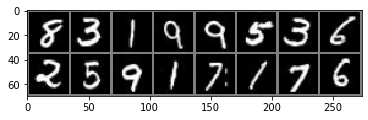

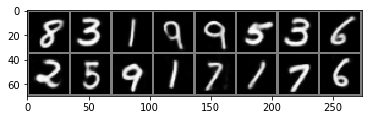

[119/200][0/165] Loss_VAE: 51.6606 KLD: 27.3945 MSE: 24.2661
[119/200][20/165] Loss_VAE: 50.0207 KLD: 26.9378 MSE: 23.0829
[119/200][40/165] Loss_VAE: 47.9863 KLD: 26.5892 MSE: 21.3971
[119/200][60/165] Loss_VAE: 50.2476 KLD: 27.8036 MSE: 22.4440
[119/200][80/165] Loss_VAE: 51.9442 KLD: 27.7768 MSE: 24.1674
[119/200][100/165] Loss_VAE: 49.2276 KLD: 26.8428 MSE: 22.3848
[119/200][120/165] Loss_VAE: 49.7238 KLD: 26.7485 MSE: 22.9753
[119/200][140/165] Loss_VAE: 48.9386 KLD: 26.5623 MSE: 22.3763
[119/200][160/165] Loss_VAE: 50.0293 KLD: 27.2685 MSE: 22.7608


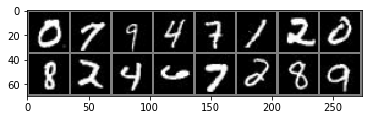

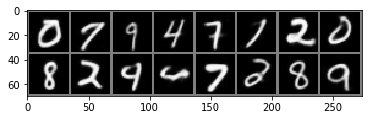

[120/200][0/165] Loss_VAE: 50.7240 KLD: 27.6004 MSE: 23.1236
[120/200][20/165] Loss_VAE: 50.5772 KLD: 27.6766 MSE: 22.9006
[120/200][40/165] Loss_VAE: 51.1825 KLD: 28.2368 MSE: 22.9457
[120/200][60/165] Loss_VAE: 51.3974 KLD: 28.3410 MSE: 23.0564
[120/200][80/165] Loss_VAE: 49.5869 KLD: 27.3857 MSE: 22.2011
[120/200][100/165] Loss_VAE: 50.4771 KLD: 28.0208 MSE: 22.4563
[120/200][120/165] Loss_VAE: 49.3042 KLD: 26.8150 MSE: 22.4892
[120/200][140/165] Loss_VAE: 48.9201 KLD: 26.6571 MSE: 22.2630
[120/200][160/165] Loss_VAE: 49.7689 KLD: 27.0063 MSE: 22.7627


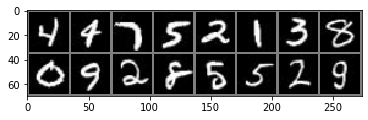

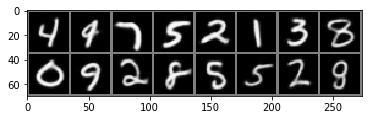

[121/200][0/165] Loss_VAE: 51.0527 KLD: 27.3656 MSE: 23.6871
[121/200][20/165] Loss_VAE: 50.1758 KLD: 27.5889 MSE: 22.5868
[121/200][40/165] Loss_VAE: 48.4216 KLD: 26.4387 MSE: 21.9829
[121/200][60/165] Loss_VAE: 48.2809 KLD: 26.7394 MSE: 21.5414
[121/200][80/165] Loss_VAE: 50.2096 KLD: 27.4623 MSE: 22.7473
[121/200][100/165] Loss_VAE: 50.7749 KLD: 28.1473 MSE: 22.6276
[121/200][120/165] Loss_VAE: 50.0745 KLD: 28.0778 MSE: 21.9967
[121/200][140/165] Loss_VAE: 49.6138 KLD: 26.7244 MSE: 22.8894
[121/200][160/165] Loss_VAE: 48.4162 KLD: 26.6303 MSE: 21.7859


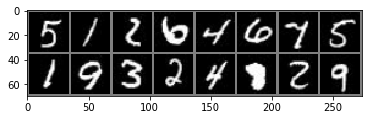

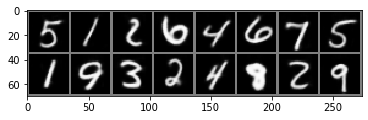

[122/200][0/165] Loss_VAE: 48.6705 KLD: 26.8577 MSE: 21.8128
[122/200][20/165] Loss_VAE: 49.4253 KLD: 27.1790 MSE: 22.2463
[122/200][40/165] Loss_VAE: 50.9525 KLD: 27.6734 MSE: 23.2791
[122/200][60/165] Loss_VAE: 49.0456 KLD: 26.7073 MSE: 22.3383
[122/200][80/165] Loss_VAE: 50.2031 KLD: 27.4511 MSE: 22.7520
[122/200][100/165] Loss_VAE: 49.5774 KLD: 27.6618 MSE: 21.9156
[122/200][120/165] Loss_VAE: 49.6670 KLD: 26.8336 MSE: 22.8333
[122/200][140/165] Loss_VAE: 49.1984 KLD: 26.8046 MSE: 22.3938
[122/200][160/165] Loss_VAE: 48.4708 KLD: 27.0298 MSE: 21.4410


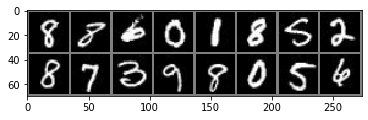

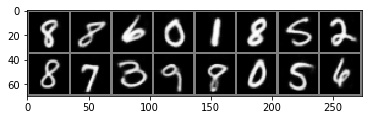

[123/200][0/165] Loss_VAE: 50.5622 KLD: 27.4206 MSE: 23.1416
[123/200][20/165] Loss_VAE: 49.4959 KLD: 27.2152 MSE: 22.2807
[123/200][40/165] Loss_VAE: 49.8953 KLD: 27.3946 MSE: 22.5007
[123/200][60/165] Loss_VAE: 50.1628 KLD: 27.9078 MSE: 22.2550
[123/200][80/165] Loss_VAE: 50.6834 KLD: 27.5382 MSE: 23.1452
[123/200][100/165] Loss_VAE: 48.3443 KLD: 26.5357 MSE: 21.8087
[123/200][120/165] Loss_VAE: 49.8718 KLD: 27.4352 MSE: 22.4367
[123/200][140/165] Loss_VAE: 49.5049 KLD: 27.0077 MSE: 22.4972
[123/200][160/165] Loss_VAE: 49.7142 KLD: 27.0121 MSE: 22.7021


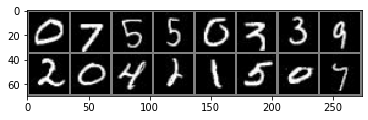

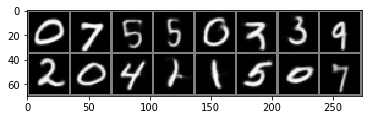

[124/200][0/165] Loss_VAE: 50.1038 KLD: 27.5597 MSE: 22.5441
[124/200][20/165] Loss_VAE: 49.3687 KLD: 27.0048 MSE: 22.3639
[124/200][40/165] Loss_VAE: 50.7788 KLD: 27.8320 MSE: 22.9468
[124/200][60/165] Loss_VAE: 50.3222 KLD: 27.5444 MSE: 22.7778
[124/200][80/165] Loss_VAE: 48.5354 KLD: 26.3825 MSE: 22.1529
[124/200][100/165] Loss_VAE: 49.1310 KLD: 27.1423 MSE: 21.9887
[124/200][120/165] Loss_VAE: 50.3164 KLD: 27.7918 MSE: 22.5247
[124/200][140/165] Loss_VAE: 51.8474 KLD: 28.0126 MSE: 23.8348
[124/200][160/165] Loss_VAE: 49.9203 KLD: 27.3361 MSE: 22.5842


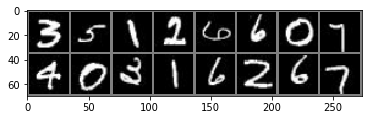

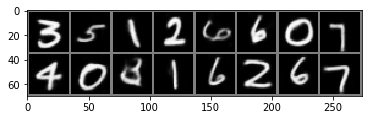

[125/200][0/165] Loss_VAE: 50.6125 KLD: 27.8687 MSE: 22.7438
[125/200][20/165] Loss_VAE: 49.0019 KLD: 27.0397 MSE: 21.9621
[125/200][40/165] Loss_VAE: 49.5361 KLD: 27.2971 MSE: 22.2390
[125/200][60/165] Loss_VAE: 49.2095 KLD: 26.7713 MSE: 22.4382
[125/200][80/165] Loss_VAE: 49.7958 KLD: 27.0341 MSE: 22.7616
[125/200][100/165] Loss_VAE: 49.4794 KLD: 27.2167 MSE: 22.2628
[125/200][120/165] Loss_VAE: 51.2834 KLD: 27.9982 MSE: 23.2853
[125/200][140/165] Loss_VAE: 49.7895 KLD: 26.9247 MSE: 22.8648
[125/200][160/165] Loss_VAE: 49.8262 KLD: 27.2811 MSE: 22.5451


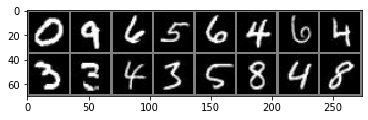

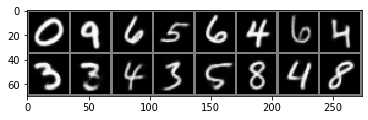

[126/200][0/165] Loss_VAE: 51.5466 KLD: 27.9633 MSE: 23.5833
[126/200][20/165] Loss_VAE: 49.7311 KLD: 27.6289 MSE: 22.1022
[126/200][40/165] Loss_VAE: 49.9491 KLD: 27.5657 MSE: 22.3835
[126/200][60/165] Loss_VAE: 48.7397 KLD: 26.1269 MSE: 22.6127
[126/200][80/165] Loss_VAE: 50.4137 KLD: 27.8598 MSE: 22.5539
[126/200][100/165] Loss_VAE: 50.1022 KLD: 27.2287 MSE: 22.8735
[126/200][120/165] Loss_VAE: 49.9068 KLD: 26.8159 MSE: 23.0909
[126/200][140/165] Loss_VAE: 49.1679 KLD: 27.2256 MSE: 21.9423
[126/200][160/165] Loss_VAE: 48.1570 KLD: 26.3405 MSE: 21.8165


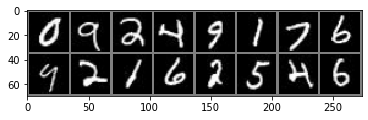

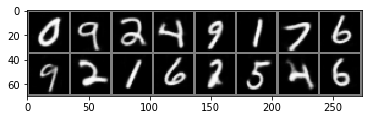

[127/200][0/165] Loss_VAE: 51.0775 KLD: 27.9220 MSE: 23.1555
[127/200][20/165] Loss_VAE: 50.3424 KLD: 27.4898 MSE: 22.8526
[127/200][40/165] Loss_VAE: 51.5216 KLD: 28.0270 MSE: 23.4946
[127/200][60/165] Loss_VAE: 50.2772 KLD: 26.8874 MSE: 23.3898
[127/200][80/165] Loss_VAE: 50.0376 KLD: 28.0319 MSE: 22.0057
[127/200][100/165] Loss_VAE: 49.7103 KLD: 26.9312 MSE: 22.7791
[127/200][120/165] Loss_VAE: 50.5538 KLD: 27.9174 MSE: 22.6364
[127/200][140/165] Loss_VAE: 50.7084 KLD: 27.6908 MSE: 23.0176
[127/200][160/165] Loss_VAE: 50.3749 KLD: 27.4828 MSE: 22.8921


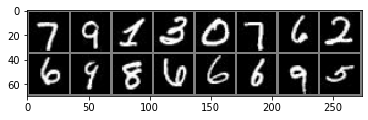

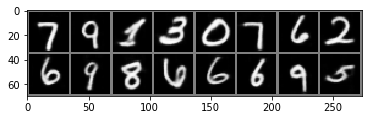

[128/200][0/165] Loss_VAE: 51.1614 KLD: 27.5630 MSE: 23.5984
[128/200][20/165] Loss_VAE: 49.4532 KLD: 27.3581 MSE: 22.0950
[128/200][40/165] Loss_VAE: 50.6842 KLD: 27.5574 MSE: 23.1268
[128/200][60/165] Loss_VAE: 49.7931 KLD: 27.3482 MSE: 22.4449
[128/200][80/165] Loss_VAE: 50.8504 KLD: 27.9551 MSE: 22.8953
[128/200][100/165] Loss_VAE: 49.3241 KLD: 26.8709 MSE: 22.4532
[128/200][120/165] Loss_VAE: 49.3332 KLD: 27.0973 MSE: 22.2360
[128/200][140/165] Loss_VAE: 49.9831 KLD: 27.5913 MSE: 22.3917
[128/200][160/165] Loss_VAE: 49.1195 KLD: 26.7915 MSE: 22.3280


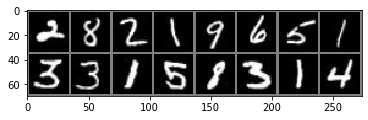

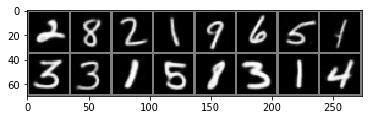

[129/200][0/165] Loss_VAE: 49.3046 KLD: 27.4129 MSE: 21.8917
[129/200][20/165] Loss_VAE: 49.4852 KLD: 26.8791 MSE: 22.6060
[129/200][40/165] Loss_VAE: 50.1015 KLD: 27.8277 MSE: 22.2738
[129/200][60/165] Loss_VAE: 50.2753 KLD: 27.4094 MSE: 22.8658
[129/200][80/165] Loss_VAE: 49.8636 KLD: 27.3737 MSE: 22.4899
[129/200][100/165] Loss_VAE: 50.3056 KLD: 27.5525 MSE: 22.7531
[129/200][120/165] Loss_VAE: 50.7016 KLD: 27.7741 MSE: 22.9275
[129/200][140/165] Loss_VAE: 48.8499 KLD: 26.6132 MSE: 22.2368
[129/200][160/165] Loss_VAE: 49.8462 KLD: 27.2289 MSE: 22.6173


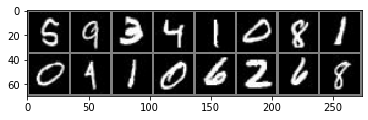

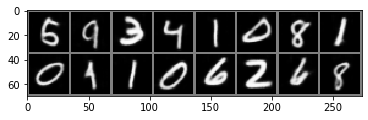

[130/200][0/165] Loss_VAE: 48.7441 KLD: 27.1512 MSE: 21.5929
[130/200][20/165] Loss_VAE: 50.2509 KLD: 27.8616 MSE: 22.3893
[130/200][40/165] Loss_VAE: 49.0783 KLD: 26.7070 MSE: 22.3713
[130/200][60/165] Loss_VAE: 49.4457 KLD: 27.7312 MSE: 21.7145
[130/200][80/165] Loss_VAE: 49.9449 KLD: 27.0475 MSE: 22.8974
[130/200][100/165] Loss_VAE: 51.3335 KLD: 27.8706 MSE: 23.4629
[130/200][120/165] Loss_VAE: 49.0661 KLD: 26.8891 MSE: 22.1770
[130/200][140/165] Loss_VAE: 49.0491 KLD: 27.0397 MSE: 22.0094
[130/200][160/165] Loss_VAE: 49.9076 KLD: 27.1680 MSE: 22.7396


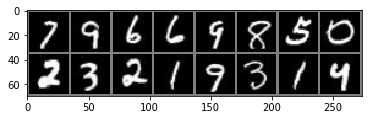

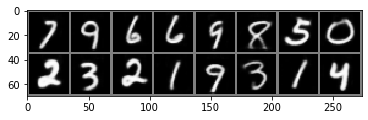

[131/200][0/165] Loss_VAE: 51.2989 KLD: 28.5574 MSE: 22.7414
[131/200][20/165] Loss_VAE: 48.9426 KLD: 27.3657 MSE: 21.5769
[131/200][40/165] Loss_VAE: 49.8268 KLD: 26.7664 MSE: 23.0604
[131/200][60/165] Loss_VAE: 48.5354 KLD: 26.5413 MSE: 21.9941
[131/200][80/165] Loss_VAE: 50.6687 KLD: 27.8034 MSE: 22.8653
[131/200][100/165] Loss_VAE: 48.9154 KLD: 26.8698 MSE: 22.0456
[131/200][120/165] Loss_VAE: 50.3067 KLD: 27.0420 MSE: 23.2647
[131/200][140/165] Loss_VAE: 49.1592 KLD: 27.5133 MSE: 21.6459
[131/200][160/165] Loss_VAE: 51.2194 KLD: 27.7407 MSE: 23.4787


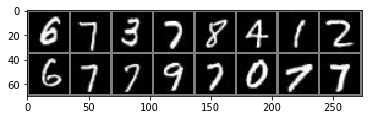

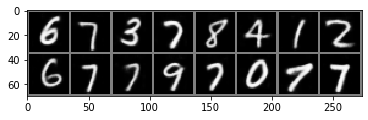

[132/200][0/165] Loss_VAE: 50.0372 KLD: 27.4364 MSE: 22.6008
[132/200][20/165] Loss_VAE: 50.2558 KLD: 27.5070 MSE: 22.7488
[132/200][40/165] Loss_VAE: 49.5761 KLD: 27.2462 MSE: 22.3299
[132/200][60/165] Loss_VAE: 50.2707 KLD: 27.4438 MSE: 22.8269
[132/200][80/165] Loss_VAE: 49.8162 KLD: 27.4289 MSE: 22.3873
[132/200][100/165] Loss_VAE: 49.0734 KLD: 27.1891 MSE: 21.8843
[132/200][120/165] Loss_VAE: 50.1974 KLD: 27.6631 MSE: 22.5343
[132/200][140/165] Loss_VAE: 50.5310 KLD: 27.6348 MSE: 22.8962
[132/200][160/165] Loss_VAE: 49.0999 KLD: 26.3706 MSE: 22.7293


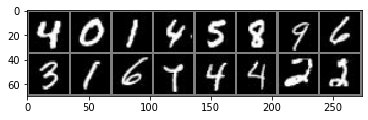

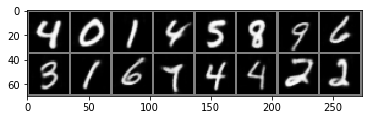

[133/200][0/165] Loss_VAE: 49.5335 KLD: 27.2634 MSE: 22.2700
[133/200][20/165] Loss_VAE: 49.7216 KLD: 27.3471 MSE: 22.3745
[133/200][40/165] Loss_VAE: 49.9342 KLD: 27.8855 MSE: 22.0487
[133/200][60/165] Loss_VAE: 51.1671 KLD: 28.5118 MSE: 22.6553
[133/200][80/165] Loss_VAE: 50.6175 KLD: 27.0285 MSE: 23.5890
[133/200][100/165] Loss_VAE: 50.2694 KLD: 26.8679 MSE: 23.4015
[133/200][120/165] Loss_VAE: 50.3768 KLD: 26.9883 MSE: 23.3884
[133/200][140/165] Loss_VAE: 48.4690 KLD: 26.8571 MSE: 21.6119
[133/200][160/165] Loss_VAE: 50.0349 KLD: 27.6995 MSE: 22.3354


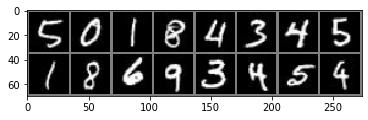

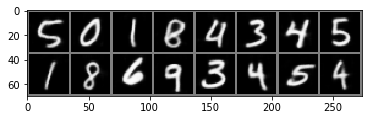

[134/200][0/165] Loss_VAE: 51.3548 KLD: 28.3437 MSE: 23.0111
[134/200][20/165] Loss_VAE: 48.6445 KLD: 26.4557 MSE: 22.1888
[134/200][40/165] Loss_VAE: 49.6427 KLD: 27.8789 MSE: 21.7638
[134/200][60/165] Loss_VAE: 49.6750 KLD: 27.4379 MSE: 22.2370
[134/200][80/165] Loss_VAE: 51.3053 KLD: 28.3901 MSE: 22.9152
[134/200][100/165] Loss_VAE: 49.0159 KLD: 27.0334 MSE: 21.9825
[134/200][120/165] Loss_VAE: 50.9205 KLD: 27.6635 MSE: 23.2570
[134/200][140/165] Loss_VAE: 50.6104 KLD: 27.6315 MSE: 22.9789
[134/200][160/165] Loss_VAE: 50.0393 KLD: 27.0856 MSE: 22.9537


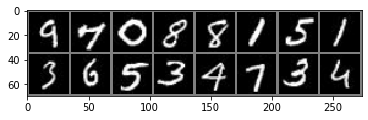

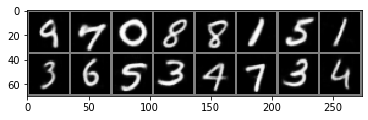

[135/200][0/165] Loss_VAE: 49.8790 KLD: 27.3982 MSE: 22.4808
[135/200][20/165] Loss_VAE: 50.2308 KLD: 27.2950 MSE: 22.9358
[135/200][40/165] Loss_VAE: 49.4268 KLD: 27.3849 MSE: 22.0418
[135/200][60/165] Loss_VAE: 48.7512 KLD: 27.0968 MSE: 21.6544
[135/200][80/165] Loss_VAE: 49.0579 KLD: 27.1111 MSE: 21.9468
[135/200][100/165] Loss_VAE: 50.6226 KLD: 27.3014 MSE: 23.3211
[135/200][120/165] Loss_VAE: 49.1188 KLD: 27.5261 MSE: 21.5927
[135/200][140/165] Loss_VAE: 51.0215 KLD: 27.3120 MSE: 23.7095
[135/200][160/165] Loss_VAE: 49.1304 KLD: 26.5420 MSE: 22.5884


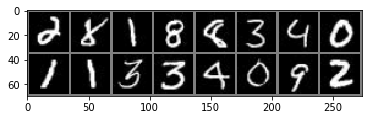

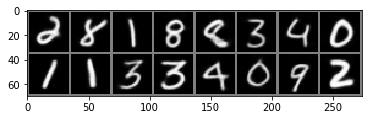

[136/200][0/165] Loss_VAE: 50.1624 KLD: 27.1828 MSE: 22.9796
[136/200][20/165] Loss_VAE: 48.3781 KLD: 26.6794 MSE: 21.6987
[136/200][40/165] Loss_VAE: 50.7317 KLD: 27.7811 MSE: 22.9506
[136/200][60/165] Loss_VAE: 49.6601 KLD: 27.2786 MSE: 22.3815
[136/200][80/165] Loss_VAE: 50.8326 KLD: 27.9706 MSE: 22.8620
[136/200][100/165] Loss_VAE: 47.8797 KLD: 26.7291 MSE: 21.1506
[136/200][120/165] Loss_VAE: 50.5322 KLD: 28.0793 MSE: 22.4529
[136/200][140/165] Loss_VAE: 48.8687 KLD: 26.6052 MSE: 22.2635
[136/200][160/165] Loss_VAE: 49.1195 KLD: 27.0688 MSE: 22.0507


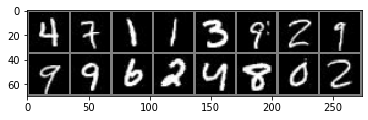

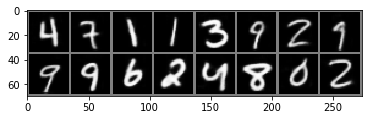

[137/200][0/165] Loss_VAE: 48.3204 KLD: 26.8085 MSE: 21.5119
[137/200][20/165] Loss_VAE: 48.4899 KLD: 26.3797 MSE: 22.1103
[137/200][40/165] Loss_VAE: 48.9431 KLD: 26.7186 MSE: 22.2245
[137/200][60/165] Loss_VAE: 50.0100 KLD: 27.4198 MSE: 22.5903
[137/200][80/165] Loss_VAE: 51.4743 KLD: 27.8759 MSE: 23.5984
[137/200][100/165] Loss_VAE: 47.6149 KLD: 26.3467 MSE: 21.2681
[137/200][120/165] Loss_VAE: 49.5204 KLD: 27.0975 MSE: 22.4228
[137/200][140/165] Loss_VAE: 49.0423 KLD: 27.1426 MSE: 21.8996
[137/200][160/165] Loss_VAE: 50.0193 KLD: 27.4265 MSE: 22.5928


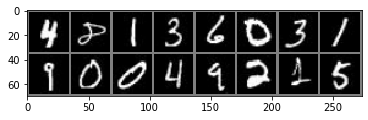

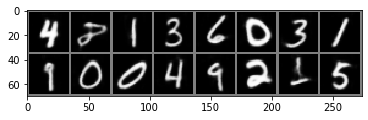

[138/200][0/165] Loss_VAE: 50.1961 KLD: 27.4919 MSE: 22.7042
[138/200][20/165] Loss_VAE: 49.1139 KLD: 27.6461 MSE: 21.4678
[138/200][40/165] Loss_VAE: 49.6686 KLD: 26.6957 MSE: 22.9729
[138/200][60/165] Loss_VAE: 49.6712 KLD: 26.5274 MSE: 23.1437
[138/200][80/165] Loss_VAE: 50.4423 KLD: 27.7980 MSE: 22.6443
[138/200][100/165] Loss_VAE: 50.1706 KLD: 27.8371 MSE: 22.3334
[138/200][120/165] Loss_VAE: 48.5979 KLD: 26.5190 MSE: 22.0789
[138/200][140/165] Loss_VAE: 48.9957 KLD: 26.9378 MSE: 22.0579
[138/200][160/165] Loss_VAE: 49.8368 KLD: 27.5005 MSE: 22.3363


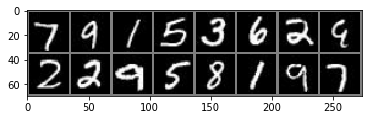

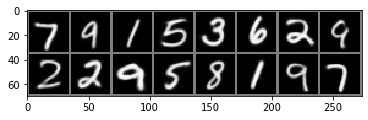

[139/200][0/165] Loss_VAE: 49.0883 KLD: 26.6663 MSE: 22.4220
[139/200][20/165] Loss_VAE: 49.8923 KLD: 27.4471 MSE: 22.4452
[139/200][40/165] Loss_VAE: 50.0191 KLD: 27.4902 MSE: 22.5288
[139/200][60/165] Loss_VAE: 49.5186 KLD: 27.4359 MSE: 22.0827
[139/200][80/165] Loss_VAE: 51.4353 KLD: 28.3604 MSE: 23.0749
[139/200][100/165] Loss_VAE: 50.9671 KLD: 27.5247 MSE: 23.4425
[139/200][120/165] Loss_VAE: 48.8798 KLD: 27.3990 MSE: 21.4809
[139/200][140/165] Loss_VAE: 49.8385 KLD: 27.5513 MSE: 22.2871
[139/200][160/165] Loss_VAE: 50.4461 KLD: 27.5400 MSE: 22.9060


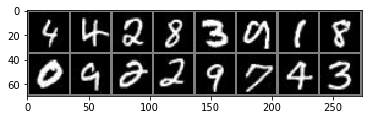

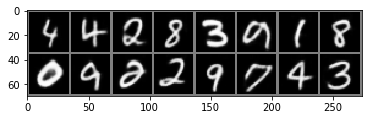

[140/200][0/165] Loss_VAE: 49.2863 KLD: 27.0520 MSE: 22.2343
[140/200][20/165] Loss_VAE: 49.8993 KLD: 27.3969 MSE: 22.5024
[140/200][40/165] Loss_VAE: 47.5590 KLD: 26.3589 MSE: 21.2001
[140/200][60/165] Loss_VAE: 49.8805 KLD: 27.4215 MSE: 22.4590
[140/200][80/165] Loss_VAE: 48.8800 KLD: 26.7748 MSE: 22.1052
[140/200][100/165] Loss_VAE: 48.1330 KLD: 26.6902 MSE: 21.4429
[140/200][120/165] Loss_VAE: 50.3937 KLD: 27.9061 MSE: 22.4876
[140/200][140/165] Loss_VAE: 48.4563 KLD: 27.0693 MSE: 21.3870
[140/200][160/165] Loss_VAE: 50.3184 KLD: 27.5417 MSE: 22.7767


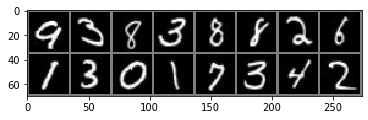

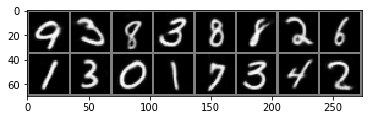

[141/200][0/165] Loss_VAE: 49.8345 KLD: 26.6741 MSE: 23.1605
[141/200][20/165] Loss_VAE: 49.1567 KLD: 27.2546 MSE: 21.9021
[141/200][40/165] Loss_VAE: 49.0253 KLD: 26.8330 MSE: 22.1923
[141/200][60/165] Loss_VAE: 49.7908 KLD: 27.6485 MSE: 22.1423
[141/200][80/165] Loss_VAE: 48.5816 KLD: 26.9522 MSE: 21.6294
[141/200][100/165] Loss_VAE: 48.4513 KLD: 26.2007 MSE: 22.2507
[141/200][120/165] Loss_VAE: 48.9882 KLD: 26.6900 MSE: 22.2982
[141/200][140/165] Loss_VAE: 51.0847 KLD: 27.6801 MSE: 23.4046
[141/200][160/165] Loss_VAE: 48.3626 KLD: 26.3212 MSE: 22.0413


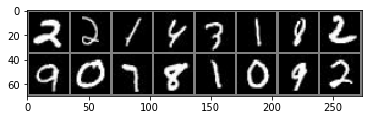

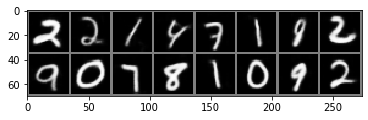

[142/200][0/165] Loss_VAE: 48.5456 KLD: 26.4657 MSE: 22.0799
[142/200][20/165] Loss_VAE: 48.9639 KLD: 26.6068 MSE: 22.3571
[142/200][40/165] Loss_VAE: 48.7938 KLD: 27.1431 MSE: 21.6507
[142/200][60/165] Loss_VAE: 50.7764 KLD: 27.7321 MSE: 23.0444
[142/200][80/165] Loss_VAE: 50.3771 KLD: 27.1128 MSE: 23.2643
[142/200][100/165] Loss_VAE: 49.3229 KLD: 26.6602 MSE: 22.6627
[142/200][120/165] Loss_VAE: 50.7090 KLD: 27.8809 MSE: 22.8281
[142/200][140/165] Loss_VAE: 49.4810 KLD: 27.3604 MSE: 22.1206
[142/200][160/165] Loss_VAE: 49.5094 KLD: 27.7290 MSE: 21.7804


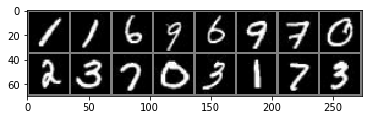

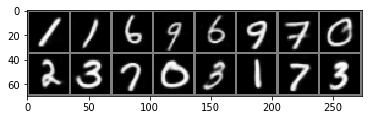

[143/200][0/165] Loss_VAE: 49.4074 KLD: 26.8599 MSE: 22.5475
[143/200][20/165] Loss_VAE: 51.1139 KLD: 28.1943 MSE: 22.9196
[143/200][40/165] Loss_VAE: 48.2343 KLD: 26.6274 MSE: 21.6070
[143/200][60/165] Loss_VAE: 50.8689 KLD: 27.3140 MSE: 23.5549
[143/200][80/165] Loss_VAE: 49.6173 KLD: 26.6316 MSE: 22.9857
[143/200][100/165] Loss_VAE: 48.0011 KLD: 26.3138 MSE: 21.6873
[143/200][120/165] Loss_VAE: 48.9785 KLD: 27.2164 MSE: 21.7622
[143/200][140/165] Loss_VAE: 48.6218 KLD: 26.7854 MSE: 21.8364
[143/200][160/165] Loss_VAE: 48.5776 KLD: 26.9622 MSE: 21.6155


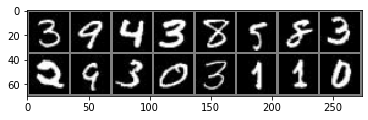

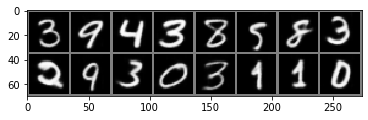

[144/200][0/165] Loss_VAE: 48.7723 KLD: 27.1182 MSE: 21.6542
[144/200][20/165] Loss_VAE: 50.3146 KLD: 27.7045 MSE: 22.6101
[144/200][40/165] Loss_VAE: 49.0995 KLD: 27.1332 MSE: 21.9664
[144/200][60/165] Loss_VAE: 48.7657 KLD: 26.6387 MSE: 22.1270
[144/200][80/165] Loss_VAE: 49.8697 KLD: 27.3223 MSE: 22.5475
[144/200][100/165] Loss_VAE: 49.7297 KLD: 27.0452 MSE: 22.6845
[144/200][120/165] Loss_VAE: 49.1737 KLD: 26.9045 MSE: 22.2692
[144/200][140/165] Loss_VAE: 48.7135 KLD: 27.0549 MSE: 21.6586
[144/200][160/165] Loss_VAE: 50.1257 KLD: 27.5263 MSE: 22.5994


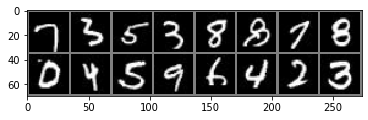

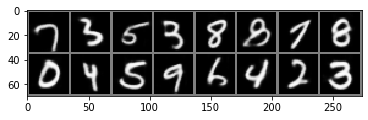

[145/200][0/165] Loss_VAE: 49.2390 KLD: 27.0646 MSE: 22.1744
[145/200][20/165] Loss_VAE: 49.4229 KLD: 26.9955 MSE: 22.4275
[145/200][40/165] Loss_VAE: 49.1458 KLD: 26.9956 MSE: 22.1503
[145/200][60/165] Loss_VAE: 49.4598 KLD: 27.3027 MSE: 22.1572
[145/200][80/165] Loss_VAE: 51.0033 KLD: 28.1037 MSE: 22.8995
[145/200][100/165] Loss_VAE: 49.6751 KLD: 27.2272 MSE: 22.4478
[145/200][120/165] Loss_VAE: 49.6008 KLD: 27.2539 MSE: 22.3469
[145/200][140/165] Loss_VAE: 50.7959 KLD: 27.5563 MSE: 23.2396
[145/200][160/165] Loss_VAE: 50.2595 KLD: 27.2092 MSE: 23.0503


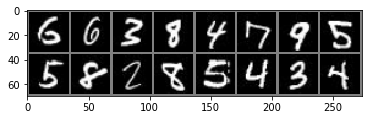

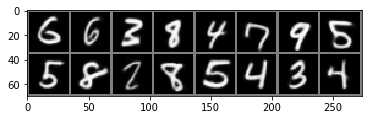

[146/200][0/165] Loss_VAE: 47.4905 KLD: 26.1049 MSE: 21.3855
[146/200][20/165] Loss_VAE: 48.1066 KLD: 27.1736 MSE: 20.9329
[146/200][40/165] Loss_VAE: 48.2370 KLD: 26.5247 MSE: 21.7123
[146/200][60/165] Loss_VAE: 50.1916 KLD: 27.6702 MSE: 22.5214
[146/200][80/165] Loss_VAE: 49.2660 KLD: 26.8491 MSE: 22.4169
[146/200][100/165] Loss_VAE: 51.1924 KLD: 27.6551 MSE: 23.5373
[146/200][120/165] Loss_VAE: 50.2351 KLD: 27.3707 MSE: 22.8644
[146/200][140/165] Loss_VAE: 49.0413 KLD: 26.6537 MSE: 22.3876
[146/200][160/165] Loss_VAE: 50.7314 KLD: 27.1205 MSE: 23.6109


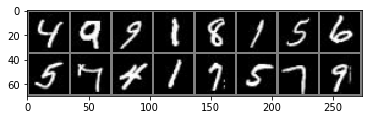

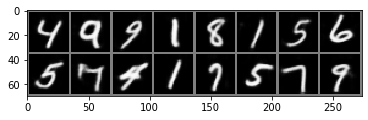

[147/200][0/165] Loss_VAE: 48.8513 KLD: 27.0578 MSE: 21.7935
[147/200][20/165] Loss_VAE: 49.7033 KLD: 27.3013 MSE: 22.4020
[147/200][40/165] Loss_VAE: 47.6440 KLD: 26.1958 MSE: 21.4481
[147/200][60/165] Loss_VAE: 47.7742 KLD: 26.4103 MSE: 21.3639
[147/200][80/165] Loss_VAE: 50.1042 KLD: 27.7616 MSE: 22.3426
[147/200][100/165] Loss_VAE: 51.8316 KLD: 28.0581 MSE: 23.7735
[147/200][120/165] Loss_VAE: 49.2583 KLD: 26.9663 MSE: 22.2920
[147/200][140/165] Loss_VAE: 49.3777 KLD: 27.2024 MSE: 22.1754
[147/200][160/165] Loss_VAE: 46.0620 KLD: 25.7772 MSE: 20.2848


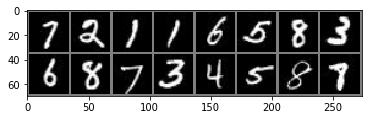

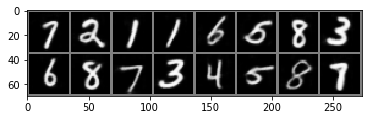

[148/200][0/165] Loss_VAE: 49.7374 KLD: 26.9380 MSE: 22.7994
[148/200][20/165] Loss_VAE: 50.6970 KLD: 27.6026 MSE: 23.0944
[148/200][40/165] Loss_VAE: 49.9180 KLD: 27.4761 MSE: 22.4419
[148/200][60/165] Loss_VAE: 48.2762 KLD: 26.5907 MSE: 21.6856
[148/200][80/165] Loss_VAE: 48.1412 KLD: 26.7620 MSE: 21.3793
[148/200][100/165] Loss_VAE: 50.3641 KLD: 28.1241 MSE: 22.2400
[148/200][120/165] Loss_VAE: 49.7565 KLD: 27.3747 MSE: 22.3818
[148/200][140/165] Loss_VAE: 49.7219 KLD: 27.3992 MSE: 22.3227
[148/200][160/165] Loss_VAE: 48.8887 KLD: 27.2024 MSE: 21.6863


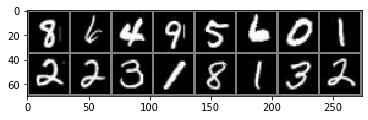

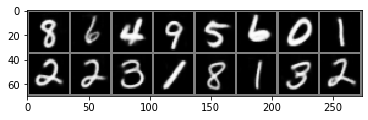

[149/200][0/165] Loss_VAE: 51.2654 KLD: 27.2155 MSE: 24.0499
[149/200][20/165] Loss_VAE: 50.0812 KLD: 27.4348 MSE: 22.6464
[149/200][40/165] Loss_VAE: 50.4850 KLD: 27.4692 MSE: 23.0158
[149/200][60/165] Loss_VAE: 50.5852 KLD: 27.6560 MSE: 22.9292
[149/200][80/165] Loss_VAE: 49.9696 KLD: 27.3159 MSE: 22.6537
[149/200][100/165] Loss_VAE: 49.7424 KLD: 27.7268 MSE: 22.0156
[149/200][120/165] Loss_VAE: 50.7682 KLD: 27.3059 MSE: 23.4622
[149/200][140/165] Loss_VAE: 49.6592 KLD: 26.9952 MSE: 22.6640
[149/200][160/165] Loss_VAE: 51.3980 KLD: 28.2621 MSE: 23.1358


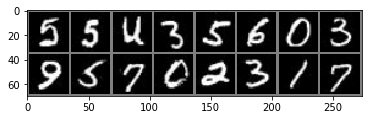

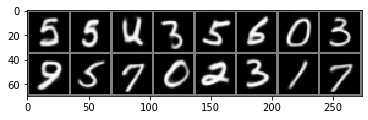

[150/200][0/165] Loss_VAE: 49.6030 KLD: 26.9580 MSE: 22.6450
[150/200][20/165] Loss_VAE: 48.6598 KLD: 26.5004 MSE: 22.1594
[150/200][40/165] Loss_VAE: 49.2087 KLD: 27.1638 MSE: 22.0449
[150/200][60/165] Loss_VAE: 49.0724 KLD: 26.6929 MSE: 22.3795
[150/200][80/165] Loss_VAE: 49.1376 KLD: 26.9485 MSE: 22.1892
[150/200][100/165] Loss_VAE: 49.4288 KLD: 27.4587 MSE: 21.9701
[150/200][120/165] Loss_VAE: 49.9158 KLD: 27.4049 MSE: 22.5109
[150/200][140/165] Loss_VAE: 48.7051 KLD: 26.9362 MSE: 21.7689
[150/200][160/165] Loss_VAE: 49.1502 KLD: 27.7709 MSE: 21.3793


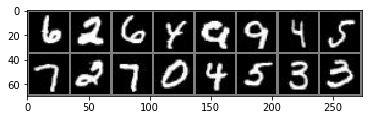

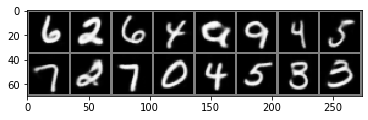

[151/200][0/165] Loss_VAE: 49.2645 KLD: 27.0643 MSE: 22.2002
[151/200][20/165] Loss_VAE: 48.9514 KLD: 27.6550 MSE: 21.2965
[151/200][40/165] Loss_VAE: 49.6382 KLD: 27.3749 MSE: 22.2633
[151/200][60/165] Loss_VAE: 49.0075 KLD: 27.2243 MSE: 21.7832
[151/200][80/165] Loss_VAE: 48.6275 KLD: 26.2491 MSE: 22.3783
[151/200][100/165] Loss_VAE: 48.4103 KLD: 26.3122 MSE: 22.0981
[151/200][120/165] Loss_VAE: 49.4822 KLD: 26.4164 MSE: 23.0658
[151/200][140/165] Loss_VAE: 48.6069 KLD: 27.1937 MSE: 21.4131
[151/200][160/165] Loss_VAE: 50.6282 KLD: 28.0391 MSE: 22.5891


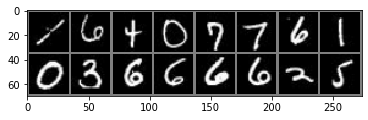

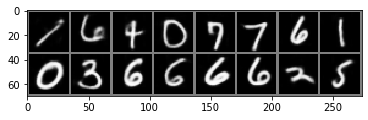

[152/200][0/165] Loss_VAE: 48.6749 KLD: 27.1686 MSE: 21.5063
[152/200][20/165] Loss_VAE: 49.8043 KLD: 26.7823 MSE: 23.0219
[152/200][40/165] Loss_VAE: 48.5809 KLD: 26.9633 MSE: 21.6176
[152/200][60/165] Loss_VAE: 49.5035 KLD: 27.2562 MSE: 22.2472
[152/200][80/165] Loss_VAE: 49.3072 KLD: 27.1280 MSE: 22.1792
[152/200][100/165] Loss_VAE: 48.4544 KLD: 27.1754 MSE: 21.2790
[152/200][120/165] Loss_VAE: 48.6266 KLD: 26.8251 MSE: 21.8015
[152/200][140/165] Loss_VAE: 48.7430 KLD: 27.3993 MSE: 21.3437
[152/200][160/165] Loss_VAE: 49.2415 KLD: 27.2283 MSE: 22.0131


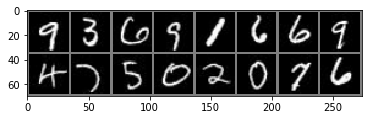

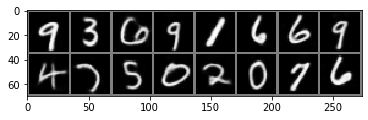

[153/200][0/165] Loss_VAE: 48.9564 KLD: 26.9239 MSE: 22.0325
[153/200][20/165] Loss_VAE: 50.1044 KLD: 27.4023 MSE: 22.7021
[153/200][40/165] Loss_VAE: 49.3837 KLD: 27.2306 MSE: 22.1532
[153/200][60/165] Loss_VAE: 47.5882 KLD: 26.3394 MSE: 21.2488
[153/200][80/165] Loss_VAE: 49.9437 KLD: 27.3630 MSE: 22.5807
[153/200][100/165] Loss_VAE: 48.9645 KLD: 27.0258 MSE: 21.9387
[153/200][120/165] Loss_VAE: 47.6543 KLD: 26.1943 MSE: 21.4600
[153/200][140/165] Loss_VAE: 50.3602 KLD: 27.4684 MSE: 22.8918
[153/200][160/165] Loss_VAE: 47.6906 KLD: 26.7624 MSE: 20.9282


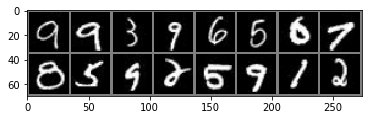

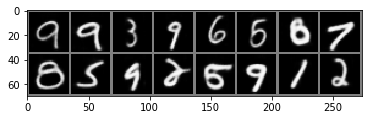

[154/200][0/165] Loss_VAE: 50.1961 KLD: 27.3776 MSE: 22.8185
[154/200][20/165] Loss_VAE: 51.2558 KLD: 27.9197 MSE: 23.3360
[154/200][40/165] Loss_VAE: 48.6867 KLD: 26.5969 MSE: 22.0898
[154/200][60/165] Loss_VAE: 49.5549 KLD: 27.2262 MSE: 22.3287
[154/200][80/165] Loss_VAE: 48.0359 KLD: 26.0647 MSE: 21.9712
[154/200][100/165] Loss_VAE: 49.8042 KLD: 27.5134 MSE: 22.2908
[154/200][120/165] Loss_VAE: 48.3832 KLD: 26.3712 MSE: 22.0120
[154/200][140/165] Loss_VAE: 48.6145 KLD: 26.9862 MSE: 21.6283
[154/200][160/165] Loss_VAE: 48.1902 KLD: 26.6444 MSE: 21.5458


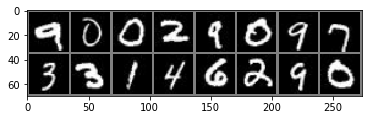

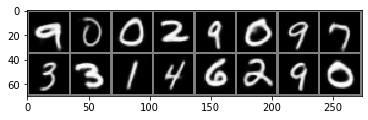

[155/200][0/165] Loss_VAE: 49.4885 KLD: 27.5055 MSE: 21.9831
[155/200][20/165] Loss_VAE: 47.8623 KLD: 26.0560 MSE: 21.8063
[155/200][40/165] Loss_VAE: 49.3931 KLD: 27.2765 MSE: 22.1166
[155/200][60/165] Loss_VAE: 48.8780 KLD: 26.8630 MSE: 22.0151
[155/200][80/165] Loss_VAE: 48.1122 KLD: 26.6052 MSE: 21.5070
[155/200][100/165] Loss_VAE: 50.6227 KLD: 27.4549 MSE: 23.1678
[155/200][120/165] Loss_VAE: 48.8094 KLD: 27.1969 MSE: 21.6125
[155/200][140/165] Loss_VAE: 50.4615 KLD: 27.6769 MSE: 22.7845
[155/200][160/165] Loss_VAE: 49.2863 KLD: 27.3721 MSE: 21.9142


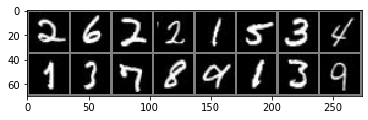

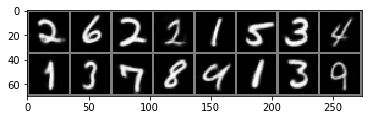

[156/200][0/165] Loss_VAE: 49.1980 KLD: 26.9752 MSE: 22.2228
[156/200][20/165] Loss_VAE: 47.4914 KLD: 26.1535 MSE: 21.3380
[156/200][40/165] Loss_VAE: 49.2093 KLD: 27.3697 MSE: 21.8397
[156/200][60/165] Loss_VAE: 48.6817 KLD: 26.9072 MSE: 21.7745
[156/200][80/165] Loss_VAE: 50.7376 KLD: 27.7407 MSE: 22.9969
[156/200][100/165] Loss_VAE: 50.8957 KLD: 28.1295 MSE: 22.7662
[156/200][120/165] Loss_VAE: 48.9789 KLD: 27.0600 MSE: 21.9189
[156/200][140/165] Loss_VAE: 47.4102 KLD: 26.0412 MSE: 21.3690
[156/200][160/165] Loss_VAE: 49.5692 KLD: 27.4295 MSE: 22.1397


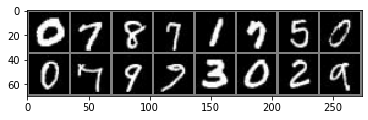

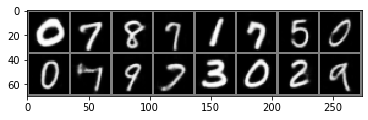

[157/200][0/165] Loss_VAE: 48.2280 KLD: 26.8390 MSE: 21.3890
[157/200][20/165] Loss_VAE: 49.6250 KLD: 26.9758 MSE: 22.6492
[157/200][40/165] Loss_VAE: 48.2016 KLD: 26.5892 MSE: 21.6124
[157/200][60/165] Loss_VAE: 48.7808 KLD: 26.7671 MSE: 22.0137
[157/200][80/165] Loss_VAE: 48.1351 KLD: 26.6456 MSE: 21.4894
[157/200][100/165] Loss_VAE: 48.9119 KLD: 26.8598 MSE: 22.0521
[157/200][120/165] Loss_VAE: 49.6575 KLD: 26.9079 MSE: 22.7496
[157/200][140/165] Loss_VAE: 49.4418 KLD: 27.3133 MSE: 22.1284
[157/200][160/165] Loss_VAE: 48.9550 KLD: 26.5641 MSE: 22.3909


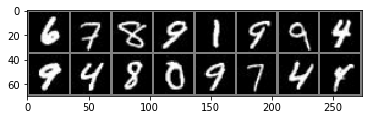

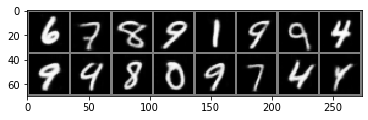

[158/200][0/165] Loss_VAE: 49.2768 KLD: 26.5071 MSE: 22.7697
[158/200][20/165] Loss_VAE: 48.9767 KLD: 27.0611 MSE: 21.9156
[158/200][40/165] Loss_VAE: 48.9468 KLD: 26.5867 MSE: 22.3602
[158/200][60/165] Loss_VAE: 48.3974 KLD: 27.1608 MSE: 21.2366
[158/200][80/165] Loss_VAE: 48.8723 KLD: 26.6791 MSE: 22.1931
[158/200][100/165] Loss_VAE: 48.7568 KLD: 26.6793 MSE: 22.0775
[158/200][120/165] Loss_VAE: 48.6681 KLD: 26.6573 MSE: 22.0108
[158/200][140/165] Loss_VAE: 48.7860 KLD: 26.7883 MSE: 21.9977
[158/200][160/165] Loss_VAE: 48.9288 KLD: 26.7151 MSE: 22.2137


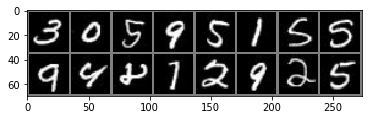

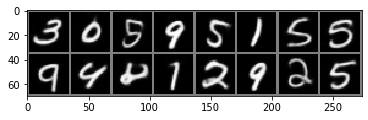

[159/200][0/165] Loss_VAE: 49.1562 KLD: 26.3999 MSE: 22.7563
[159/200][20/165] Loss_VAE: 48.9552 KLD: 26.4942 MSE: 22.4610
[159/200][40/165] Loss_VAE: 49.3908 KLD: 27.1740 MSE: 22.2169
[159/200][60/165] Loss_VAE: 48.3018 KLD: 26.5840 MSE: 21.7178
[159/200][80/165] Loss_VAE: 46.9140 KLD: 25.6199 MSE: 21.2941
[159/200][100/165] Loss_VAE: 49.8692 KLD: 26.6027 MSE: 23.2665
[159/200][120/165] Loss_VAE: 49.2328 KLD: 26.7783 MSE: 22.4544
[159/200][140/165] Loss_VAE: 49.2242 KLD: 27.0651 MSE: 22.1591
[159/200][160/165] Loss_VAE: 47.5129 KLD: 26.3713 MSE: 21.1417


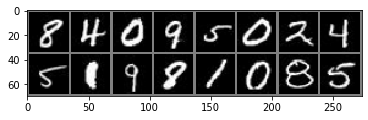

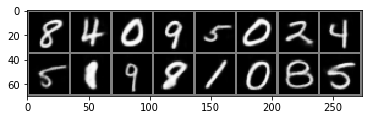

[160/200][0/165] Loss_VAE: 48.3297 KLD: 26.6554 MSE: 21.6743
[160/200][20/165] Loss_VAE: 49.8496 KLD: 27.4172 MSE: 22.4324
[160/200][40/165] Loss_VAE: 47.3330 KLD: 26.4021 MSE: 20.9309
[160/200][60/165] Loss_VAE: 49.3114 KLD: 27.4193 MSE: 21.8921
[160/200][80/165] Loss_VAE: 48.9781 KLD: 26.6661 MSE: 22.3120
[160/200][100/165] Loss_VAE: 49.9584 KLD: 27.8860 MSE: 22.0724
[160/200][120/165] Loss_VAE: 47.4510 KLD: 26.5046 MSE: 20.9464
[160/200][140/165] Loss_VAE: 48.7889 KLD: 27.7259 MSE: 21.0630
[160/200][160/165] Loss_VAE: 47.6384 KLD: 26.4122 MSE: 21.2263


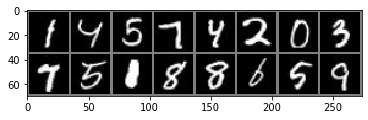

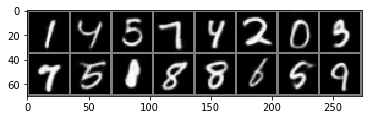

[161/200][0/165] Loss_VAE: 48.3566 KLD: 26.7622 MSE: 21.5944
[161/200][20/165] Loss_VAE: 48.3298 KLD: 26.4604 MSE: 21.8695
[161/200][40/165] Loss_VAE: 48.9659 KLD: 26.8319 MSE: 22.1340
[161/200][60/165] Loss_VAE: 47.5981 KLD: 26.1451 MSE: 21.4530
[161/200][80/165] Loss_VAE: 48.3989 KLD: 26.4478 MSE: 21.9511
[161/200][100/165] Loss_VAE: 49.2805 KLD: 27.6331 MSE: 21.6474
[161/200][120/165] Loss_VAE: 47.8064 KLD: 26.7440 MSE: 21.0624
[161/200][140/165] Loss_VAE: 48.0312 KLD: 26.2002 MSE: 21.8310
[161/200][160/165] Loss_VAE: 48.9425 KLD: 27.3901 MSE: 21.5524


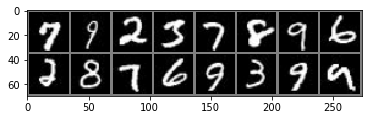

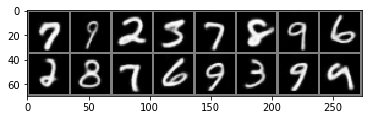

[162/200][0/165] Loss_VAE: 49.6263 KLD: 26.9091 MSE: 22.7173
[162/200][20/165] Loss_VAE: 48.1759 KLD: 26.6165 MSE: 21.5594
[162/200][40/165] Loss_VAE: 48.9706 KLD: 27.0992 MSE: 21.8714
[162/200][60/165] Loss_VAE: 50.6323 KLD: 27.8282 MSE: 22.8041
[162/200][80/165] Loss_VAE: 49.7919 KLD: 27.1513 MSE: 22.6406
[162/200][100/165] Loss_VAE: 49.7976 KLD: 27.1941 MSE: 22.6035
[162/200][120/165] Loss_VAE: 47.1899 KLD: 26.1539 MSE: 21.0360
[162/200][140/165] Loss_VAE: 47.9044 KLD: 26.8239 MSE: 21.0805
[162/200][160/165] Loss_VAE: 49.4266 KLD: 27.2658 MSE: 22.1609


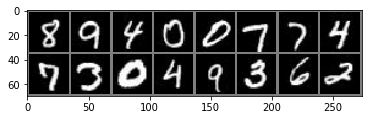

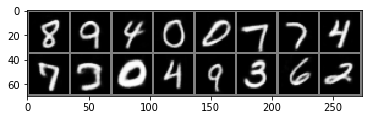

[163/200][0/165] Loss_VAE: 49.7177 KLD: 27.5630 MSE: 22.1547
[163/200][20/165] Loss_VAE: 51.0699 KLD: 27.8847 MSE: 23.1853
[163/200][40/165] Loss_VAE: 48.3726 KLD: 26.7721 MSE: 21.6005
[163/200][60/165] Loss_VAE: 48.9806 KLD: 27.2150 MSE: 21.7655
[163/200][80/165] Loss_VAE: 49.8907 KLD: 27.2220 MSE: 22.6687
[163/200][100/165] Loss_VAE: 49.2295 KLD: 26.9136 MSE: 22.3160
[163/200][120/165] Loss_VAE: 49.0238 KLD: 26.9025 MSE: 22.1213
[163/200][140/165] Loss_VAE: 49.7654 KLD: 26.9706 MSE: 22.7948
[163/200][160/165] Loss_VAE: 48.3229 KLD: 26.2893 MSE: 22.0336


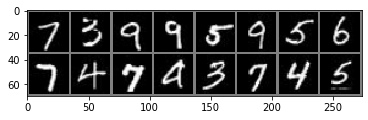

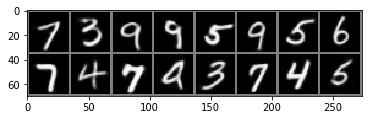

[164/200][0/165] Loss_VAE: 50.3765 KLD: 27.7026 MSE: 22.6739
[164/200][20/165] Loss_VAE: 50.0053 KLD: 27.5655 MSE: 22.4398
[164/200][40/165] Loss_VAE: 48.0972 KLD: 26.3441 MSE: 21.7532
[164/200][60/165] Loss_VAE: 48.8619 KLD: 26.5618 MSE: 22.3002
[164/200][80/165] Loss_VAE: 50.2461 KLD: 27.6323 MSE: 22.6138
[164/200][100/165] Loss_VAE: 49.9597 KLD: 27.5489 MSE: 22.4108
[164/200][120/165] Loss_VAE: 48.3411 KLD: 26.7406 MSE: 21.6006
[164/200][140/165] Loss_VAE: 48.3826 KLD: 26.3940 MSE: 21.9886
[164/200][160/165] Loss_VAE: 48.9664 KLD: 26.4459 MSE: 22.5205


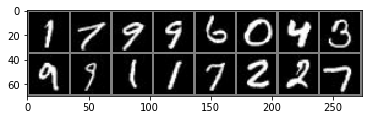

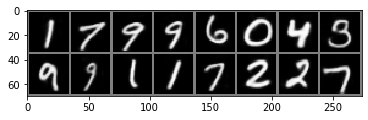

[165/200][0/165] Loss_VAE: 49.9140 KLD: 27.8026 MSE: 22.1114
[165/200][20/165] Loss_VAE: 50.1806 KLD: 28.0485 MSE: 22.1322
[165/200][40/165] Loss_VAE: 49.4482 KLD: 27.2901 MSE: 22.1581
[165/200][60/165] Loss_VAE: 48.3241 KLD: 27.1468 MSE: 21.1773
[165/200][80/165] Loss_VAE: 48.2110 KLD: 26.6074 MSE: 21.6036
[165/200][100/165] Loss_VAE: 49.2728 KLD: 27.2871 MSE: 21.9857
[165/200][120/165] Loss_VAE: 48.7951 KLD: 27.3806 MSE: 21.4145
[165/200][140/165] Loss_VAE: 47.8484 KLD: 26.5944 MSE: 21.2540
[165/200][160/165] Loss_VAE: 49.5501 KLD: 27.1991 MSE: 22.3510


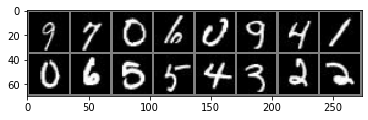

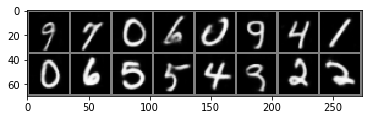

[166/200][0/165] Loss_VAE: 49.7110 KLD: 27.0708 MSE: 22.6402
[166/200][20/165] Loss_VAE: 49.6871 KLD: 27.5289 MSE: 22.1583
[166/200][40/165] Loss_VAE: 48.4680 KLD: 27.3043 MSE: 21.1637
[166/200][60/165] Loss_VAE: 47.9277 KLD: 26.6002 MSE: 21.3275
[166/200][80/165] Loss_VAE: 49.7547 KLD: 27.2909 MSE: 22.4638
[166/200][100/165] Loss_VAE: 49.3414 KLD: 27.5191 MSE: 21.8223
[166/200][120/165] Loss_VAE: 49.6040 KLD: 27.4475 MSE: 22.1565
[166/200][140/165] Loss_VAE: 49.5585 KLD: 27.2686 MSE: 22.2900
[166/200][160/165] Loss_VAE: 48.3865 KLD: 26.5899 MSE: 21.7966


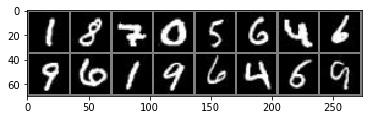

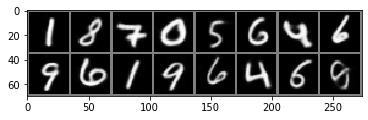

[167/200][0/165] Loss_VAE: 48.4059 KLD: 27.0832 MSE: 21.3227
[167/200][20/165] Loss_VAE: 48.8890 KLD: 27.0164 MSE: 21.8726
[167/200][40/165] Loss_VAE: 48.6092 KLD: 26.5983 MSE: 22.0110
[167/200][60/165] Loss_VAE: 50.4486 KLD: 27.8952 MSE: 22.5534
[167/200][80/165] Loss_VAE: 47.7056 KLD: 26.4696 MSE: 21.2360
[167/200][100/165] Loss_VAE: 47.8496 KLD: 26.0385 MSE: 21.8111
[167/200][120/165] Loss_VAE: 49.2492 KLD: 27.2653 MSE: 21.9840
[167/200][140/165] Loss_VAE: 48.6499 KLD: 26.6191 MSE: 22.0308
[167/200][160/165] Loss_VAE: 48.1509 KLD: 26.6365 MSE: 21.5144


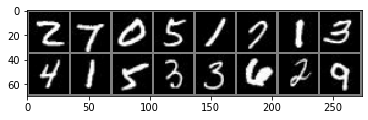

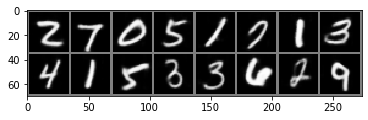

[168/200][0/165] Loss_VAE: 50.9286 KLD: 27.5539 MSE: 23.3747
[168/200][20/165] Loss_VAE: 48.4960 KLD: 26.4534 MSE: 22.0426
[168/200][40/165] Loss_VAE: 49.3051 KLD: 27.6483 MSE: 21.6568
[168/200][60/165] Loss_VAE: 47.8217 KLD: 26.4972 MSE: 21.3245
[168/200][80/165] Loss_VAE: 49.4040 KLD: 26.6958 MSE: 22.7082
[168/200][100/165] Loss_VAE: 49.3333 KLD: 27.1640 MSE: 22.1693
[168/200][120/165] Loss_VAE: 48.4326 KLD: 26.9213 MSE: 21.5113
[168/200][140/165] Loss_VAE: 48.6336 KLD: 26.9011 MSE: 21.7326
[168/200][160/165] Loss_VAE: 49.0888 KLD: 27.4537 MSE: 21.6351


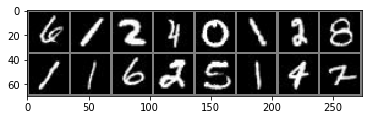

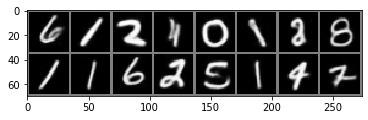

[169/200][0/165] Loss_VAE: 48.6644 KLD: 26.3649 MSE: 22.2995
[169/200][20/165] Loss_VAE: 48.2511 KLD: 26.7341 MSE: 21.5170
[169/200][40/165] Loss_VAE: 48.6551 KLD: 26.9122 MSE: 21.7429
[169/200][60/165] Loss_VAE: 48.7492 KLD: 27.2046 MSE: 21.5446
[169/200][80/165] Loss_VAE: 48.7013 KLD: 26.7999 MSE: 21.9014
[169/200][100/165] Loss_VAE: 48.2696 KLD: 26.6662 MSE: 21.6034
[169/200][120/165] Loss_VAE: 49.0067 KLD: 26.8413 MSE: 22.1654
[169/200][140/165] Loss_VAE: 48.8499 KLD: 27.1573 MSE: 21.6926
[169/200][160/165] Loss_VAE: 48.7098 KLD: 26.8921 MSE: 21.8176


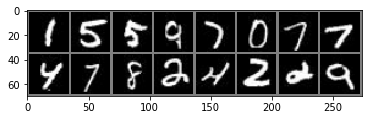

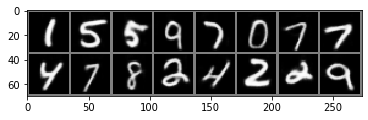

[170/200][0/165] Loss_VAE: 49.0191 KLD: 26.6346 MSE: 22.3845
[170/200][20/165] Loss_VAE: 46.5110 KLD: 25.6142 MSE: 20.8969
[170/200][40/165] Loss_VAE: 49.5146 KLD: 27.2601 MSE: 22.2545
[170/200][60/165] Loss_VAE: 48.7461 KLD: 26.8191 MSE: 21.9269
[170/200][80/165] Loss_VAE: 48.8029 KLD: 27.1982 MSE: 21.6047
[170/200][100/165] Loss_VAE: 48.9866 KLD: 27.2716 MSE: 21.7149
[170/200][120/165] Loss_VAE: 49.0801 KLD: 27.4095 MSE: 21.6706
[170/200][140/165] Loss_VAE: 48.9949 KLD: 27.3500 MSE: 21.6449
[170/200][160/165] Loss_VAE: 47.8964 KLD: 26.6532 MSE: 21.2433


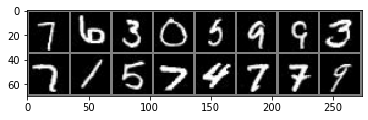

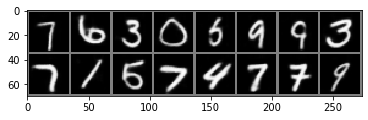

[171/200][0/165] Loss_VAE: 49.0303 KLD: 27.2727 MSE: 21.7576
[171/200][20/165] Loss_VAE: 49.1666 KLD: 27.1082 MSE: 22.0584
[171/200][40/165] Loss_VAE: 46.8988 KLD: 26.0606 MSE: 20.8382
[171/200][60/165] Loss_VAE: 48.3904 KLD: 27.5609 MSE: 20.8295
[171/200][80/165] Loss_VAE: 48.3271 KLD: 26.5393 MSE: 21.7879
[171/200][100/165] Loss_VAE: 49.7775 KLD: 27.3086 MSE: 22.4689
[171/200][120/165] Loss_VAE: 49.6733 KLD: 27.1187 MSE: 22.5546
[171/200][140/165] Loss_VAE: 48.0819 KLD: 26.3522 MSE: 21.7297
[171/200][160/165] Loss_VAE: 48.5977 KLD: 26.9316 MSE: 21.6661


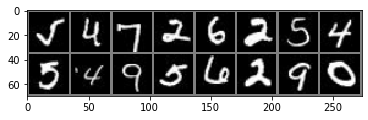

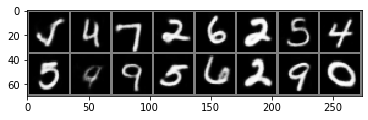

[172/200][0/165] Loss_VAE: 47.9461 KLD: 26.3482 MSE: 21.5979
[172/200][20/165] Loss_VAE: 47.7707 KLD: 26.8923 MSE: 20.8785
[172/200][40/165] Loss_VAE: 49.3241 KLD: 26.5343 MSE: 22.7898
[172/200][60/165] Loss_VAE: 51.1787 KLD: 28.0802 MSE: 23.0984
[172/200][80/165] Loss_VAE: 49.2026 KLD: 27.1138 MSE: 22.0888
[172/200][100/165] Loss_VAE: 49.1969 KLD: 26.8298 MSE: 22.3671
[172/200][120/165] Loss_VAE: 48.6923 KLD: 27.0645 MSE: 21.6277
[172/200][140/165] Loss_VAE: 48.6326 KLD: 26.8598 MSE: 21.7728
[172/200][160/165] Loss_VAE: 49.0641 KLD: 26.9093 MSE: 22.1548


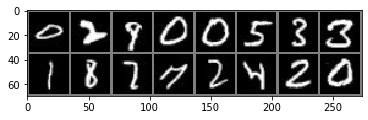

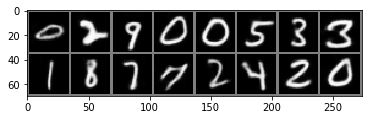

[173/200][0/165] Loss_VAE: 50.4524 KLD: 27.7472 MSE: 22.7052
[173/200][20/165] Loss_VAE: 49.6766 KLD: 27.3004 MSE: 22.3762
[173/200][40/165] Loss_VAE: 49.8124 KLD: 27.3033 MSE: 22.5091
[173/200][60/165] Loss_VAE: 49.7905 KLD: 27.2628 MSE: 22.5277
[173/200][80/165] Loss_VAE: 49.5125 KLD: 26.5986 MSE: 22.9140
[173/200][100/165] Loss_VAE: 48.5605 KLD: 27.0297 MSE: 21.5309
[173/200][120/165] Loss_VAE: 49.9984 KLD: 27.6627 MSE: 22.3357
[173/200][140/165] Loss_VAE: 50.2684 KLD: 27.5094 MSE: 22.7590
[173/200][160/165] Loss_VAE: 49.8550 KLD: 27.5534 MSE: 22.3017


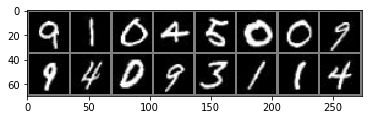

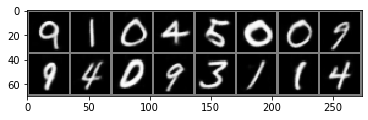

[174/200][0/165] Loss_VAE: 49.2706 KLD: 26.9198 MSE: 22.3508
[174/200][20/165] Loss_VAE: 46.8822 KLD: 25.9517 MSE: 20.9305
[174/200][40/165] Loss_VAE: 48.5514 KLD: 26.6972 MSE: 21.8542
[174/200][60/165] Loss_VAE: 48.7123 KLD: 26.7585 MSE: 21.9537
[174/200][80/165] Loss_VAE: 49.8060 KLD: 27.5504 MSE: 22.2556
[174/200][100/165] Loss_VAE: 49.4311 KLD: 27.1165 MSE: 22.3146
[174/200][120/165] Loss_VAE: 48.0513 KLD: 26.5445 MSE: 21.5068
[174/200][140/165] Loss_VAE: 49.8706 KLD: 27.5628 MSE: 22.3078
[174/200][160/165] Loss_VAE: 48.2575 KLD: 26.5351 MSE: 21.7225


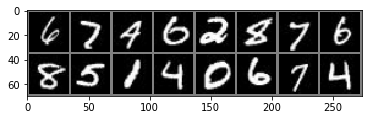

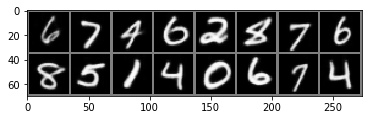

[175/200][0/165] Loss_VAE: 48.2040 KLD: 26.1095 MSE: 22.0945
[175/200][20/165] Loss_VAE: 48.2929 KLD: 27.1250 MSE: 21.1679
[175/200][40/165] Loss_VAE: 49.2615 KLD: 26.7502 MSE: 22.5113
[175/200][60/165] Loss_VAE: 49.5575 KLD: 27.1214 MSE: 22.4360
[175/200][80/165] Loss_VAE: 48.7392 KLD: 26.7111 MSE: 22.0280
[175/200][100/165] Loss_VAE: 48.1057 KLD: 26.3995 MSE: 21.7062
[175/200][120/165] Loss_VAE: 48.2341 KLD: 26.7039 MSE: 21.5302
[175/200][140/165] Loss_VAE: 50.5309 KLD: 27.3603 MSE: 23.1706
[175/200][160/165] Loss_VAE: 49.5144 KLD: 27.1090 MSE: 22.4054


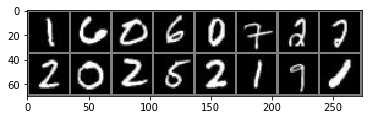

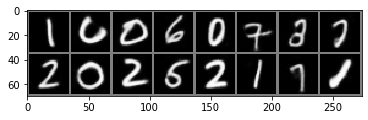

[176/200][0/165] Loss_VAE: 48.1370 KLD: 25.8981 MSE: 22.2389
[176/200][20/165] Loss_VAE: 49.2288 KLD: 26.7741 MSE: 22.4546
[176/200][40/165] Loss_VAE: 48.1157 KLD: 26.9504 MSE: 21.1652
[176/200][60/165] Loss_VAE: 48.7843 KLD: 26.8317 MSE: 21.9526
[176/200][80/165] Loss_VAE: 50.1250 KLD: 27.4561 MSE: 22.6689
[176/200][100/165] Loss_VAE: 48.4434 KLD: 26.7921 MSE: 21.6513
[176/200][120/165] Loss_VAE: 49.7340 KLD: 27.5818 MSE: 22.1522
[176/200][140/165] Loss_VAE: 47.8277 KLD: 26.3137 MSE: 21.5140
[176/200][160/165] Loss_VAE: 50.2466 KLD: 27.6804 MSE: 22.5662


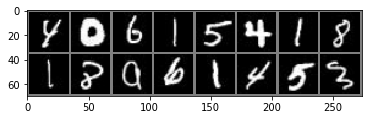

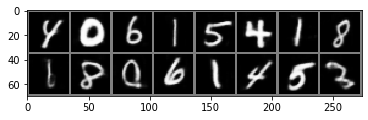

[177/200][0/165] Loss_VAE: 47.9252 KLD: 26.2874 MSE: 21.6378
[177/200][20/165] Loss_VAE: 48.7742 KLD: 27.3991 MSE: 21.3751
[177/200][40/165] Loss_VAE: 48.2704 KLD: 26.3184 MSE: 21.9520
[177/200][60/165] Loss_VAE: 49.4901 KLD: 27.2162 MSE: 22.2739
[177/200][80/165] Loss_VAE: 50.7153 KLD: 27.5085 MSE: 23.2068
[177/200][100/165] Loss_VAE: 47.8253 KLD: 26.7787 MSE: 21.0466
[177/200][120/165] Loss_VAE: 48.4656 KLD: 27.1656 MSE: 21.3000
[177/200][140/165] Loss_VAE: 50.7516 KLD: 27.4109 MSE: 23.3407
[177/200][160/165] Loss_VAE: 49.6209 KLD: 27.2970 MSE: 22.3240


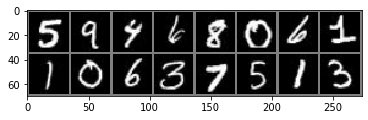

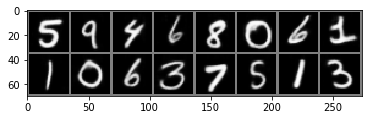

[178/200][0/165] Loss_VAE: 50.4202 KLD: 27.8164 MSE: 22.6037
[178/200][20/165] Loss_VAE: 48.0709 KLD: 26.6134 MSE: 21.4575
[178/200][40/165] Loss_VAE: 50.4828 KLD: 27.4630 MSE: 23.0199
[178/200][60/165] Loss_VAE: 49.5861 KLD: 27.2486 MSE: 22.3375
[178/200][80/165] Loss_VAE: 47.3983 KLD: 25.7408 MSE: 21.6575
[178/200][100/165] Loss_VAE: 49.1745 KLD: 26.8013 MSE: 22.3732
[178/200][120/165] Loss_VAE: 47.2203 KLD: 26.2157 MSE: 21.0046
[178/200][140/165] Loss_VAE: 49.1501 KLD: 27.7305 MSE: 21.4196
[178/200][160/165] Loss_VAE: 48.5023 KLD: 27.4650 MSE: 21.0373


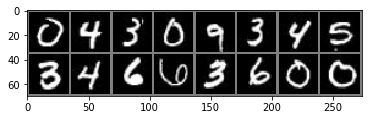

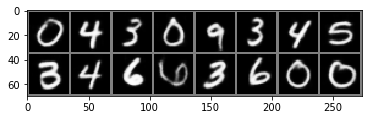

[179/200][0/165] Loss_VAE: 48.1964 KLD: 26.4530 MSE: 21.7434
[179/200][20/165] Loss_VAE: 50.2890 KLD: 27.5636 MSE: 22.7254
[179/200][40/165] Loss_VAE: 48.6110 KLD: 27.0768 MSE: 21.5342
[179/200][60/165] Loss_VAE: 47.6575 KLD: 26.1774 MSE: 21.4801
[179/200][80/165] Loss_VAE: 47.9156 KLD: 26.6843 MSE: 21.2313
[179/200][100/165] Loss_VAE: 48.0167 KLD: 25.7817 MSE: 22.2350
[179/200][120/165] Loss_VAE: 48.3723 KLD: 26.7897 MSE: 21.5826
[179/200][140/165] Loss_VAE: 48.0012 KLD: 26.6719 MSE: 21.3293
[179/200][160/165] Loss_VAE: 50.0835 KLD: 27.5738 MSE: 22.5097


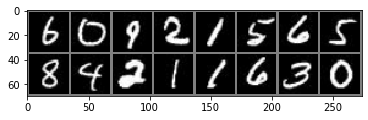

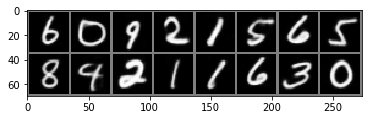

[180/200][0/165] Loss_VAE: 49.3270 KLD: 27.0525 MSE: 22.2745
[180/200][20/165] Loss_VAE: 48.2036 KLD: 26.9715 MSE: 21.2321
[180/200][40/165] Loss_VAE: 48.7441 KLD: 26.9263 MSE: 21.8178
[180/200][60/165] Loss_VAE: 48.6861 KLD: 26.9369 MSE: 21.7493
[180/200][80/165] Loss_VAE: 49.1322 KLD: 27.3041 MSE: 21.8281
[180/200][100/165] Loss_VAE: 48.8909 KLD: 27.1683 MSE: 21.7226
[180/200][120/165] Loss_VAE: 48.0319 KLD: 26.5235 MSE: 21.5085
[180/200][140/165] Loss_VAE: 47.8939 KLD: 26.2660 MSE: 21.6279
[180/200][160/165] Loss_VAE: 49.5914 KLD: 27.3202 MSE: 22.2712


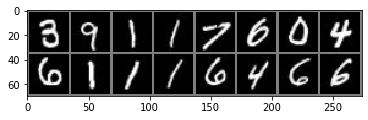

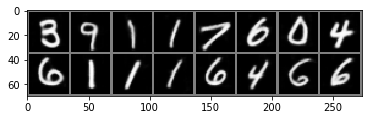

[181/200][0/165] Loss_VAE: 49.9185 KLD: 26.9724 MSE: 22.9461
[181/200][20/165] Loss_VAE: 48.5581 KLD: 26.5153 MSE: 22.0428
[181/200][40/165] Loss_VAE: 48.3186 KLD: 26.9957 MSE: 21.3230
[181/200][60/165] Loss_VAE: 48.7178 KLD: 26.8937 MSE: 21.8241
[181/200][80/165] Loss_VAE: 50.2280 KLD: 27.5687 MSE: 22.6593
[181/200][100/165] Loss_VAE: 48.7435 KLD: 26.9246 MSE: 21.8189
[181/200][120/165] Loss_VAE: 48.1428 KLD: 26.4920 MSE: 21.6508
[181/200][140/165] Loss_VAE: 49.3465 KLD: 26.4307 MSE: 22.9157
[181/200][160/165] Loss_VAE: 50.0728 KLD: 27.6536 MSE: 22.4193


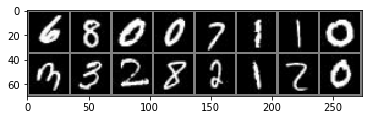

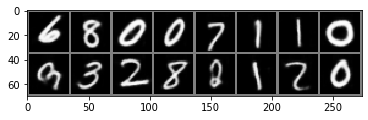

[182/200][0/165] Loss_VAE: 48.0884 KLD: 26.5977 MSE: 21.4907
[182/200][20/165] Loss_VAE: 48.4091 KLD: 26.4116 MSE: 21.9976
[182/200][40/165] Loss_VAE: 48.2021 KLD: 25.7660 MSE: 22.4361
[182/200][60/165] Loss_VAE: 47.4121 KLD: 26.5774 MSE: 20.8347
[182/200][80/165] Loss_VAE: 48.3104 KLD: 26.7928 MSE: 21.5177
[182/200][100/165] Loss_VAE: 47.6137 KLD: 26.6591 MSE: 20.9546
[182/200][120/165] Loss_VAE: 48.7364 KLD: 27.0410 MSE: 21.6954
[182/200][140/165] Loss_VAE: 49.7176 KLD: 27.0106 MSE: 22.7070
[182/200][160/165] Loss_VAE: 49.2842 KLD: 27.0441 MSE: 22.2401


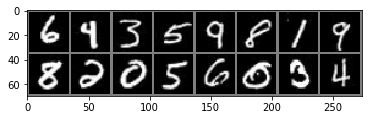

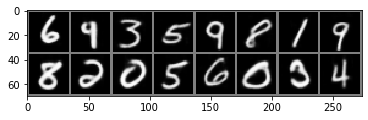

[183/200][0/165] Loss_VAE: 48.6162 KLD: 26.4577 MSE: 22.1586
[183/200][20/165] Loss_VAE: 48.3528 KLD: 26.7805 MSE: 21.5723
[183/200][40/165] Loss_VAE: 49.5120 KLD: 27.3470 MSE: 22.1651
[183/200][60/165] Loss_VAE: 49.3414 KLD: 27.0736 MSE: 22.2679
[183/200][80/165] Loss_VAE: 48.4075 KLD: 26.8195 MSE: 21.5879
[183/200][100/165] Loss_VAE: 47.4601 KLD: 26.4909 MSE: 20.9692
[183/200][120/165] Loss_VAE: 47.4951 KLD: 26.1396 MSE: 21.3555
[183/200][140/165] Loss_VAE: 49.1984 KLD: 27.4861 MSE: 21.7124
[183/200][160/165] Loss_VAE: 48.1518 KLD: 26.5054 MSE: 21.6464


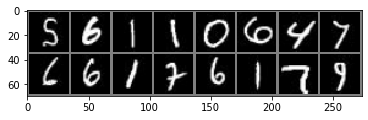

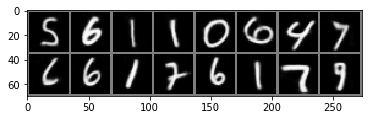

[184/200][0/165] Loss_VAE: 48.7038 KLD: 26.7396 MSE: 21.9643
[184/200][20/165] Loss_VAE: 48.6087 KLD: 26.4064 MSE: 22.2024
[184/200][40/165] Loss_VAE: 48.3235 KLD: 26.5908 MSE: 21.7327
[184/200][60/165] Loss_VAE: 48.8509 KLD: 27.1390 MSE: 21.7119
[184/200][80/165] Loss_VAE: 48.1895 KLD: 26.2450 MSE: 21.9445
[184/200][100/165] Loss_VAE: 48.6774 KLD: 26.7428 MSE: 21.9345
[184/200][120/165] Loss_VAE: 48.4609 KLD: 26.6744 MSE: 21.7865
[184/200][140/165] Loss_VAE: 48.8010 KLD: 27.1073 MSE: 21.6937
[184/200][160/165] Loss_VAE: 49.0130 KLD: 27.1850 MSE: 21.8280


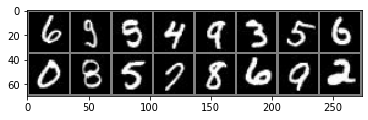

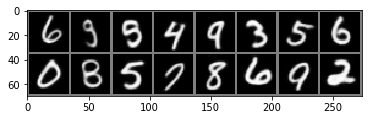

[185/200][0/165] Loss_VAE: 48.9162 KLD: 27.0191 MSE: 21.8970
[185/200][20/165] Loss_VAE: 49.0270 KLD: 26.9474 MSE: 22.0795
[185/200][40/165] Loss_VAE: 48.2909 KLD: 26.9569 MSE: 21.3339
[185/200][60/165] Loss_VAE: 46.9370 KLD: 25.6595 MSE: 21.2775
[185/200][80/165] Loss_VAE: 47.3600 KLD: 26.5928 MSE: 20.7672
[185/200][100/165] Loss_VAE: 50.5255 KLD: 27.8376 MSE: 22.6879
[185/200][120/165] Loss_VAE: 49.9169 KLD: 27.3954 MSE: 22.5215
[185/200][140/165] Loss_VAE: 49.3092 KLD: 26.8595 MSE: 22.4497
[185/200][160/165] Loss_VAE: 49.3150 KLD: 27.3993 MSE: 21.9157


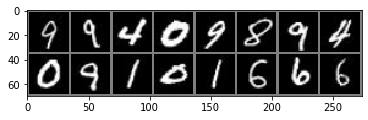

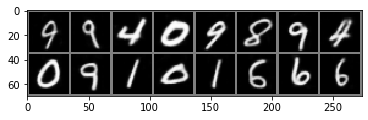

[186/200][0/165] Loss_VAE: 46.5029 KLD: 25.5777 MSE: 20.9252
[186/200][20/165] Loss_VAE: 49.1954 KLD: 27.5030 MSE: 21.6923
[186/200][40/165] Loss_VAE: 48.5120 KLD: 26.6670 MSE: 21.8450
[186/200][60/165] Loss_VAE: 48.1783 KLD: 26.9801 MSE: 21.1982
[186/200][80/165] Loss_VAE: 49.2013 KLD: 27.0470 MSE: 22.1543
[186/200][100/165] Loss_VAE: 48.8626 KLD: 27.4701 MSE: 21.3925
[186/200][120/165] Loss_VAE: 49.1996 KLD: 26.9978 MSE: 22.2018
[186/200][140/165] Loss_VAE: 48.1487 KLD: 27.1911 MSE: 20.9575
[186/200][160/165] Loss_VAE: 48.3454 KLD: 26.5102 MSE: 21.8352


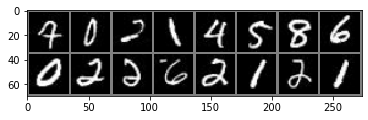

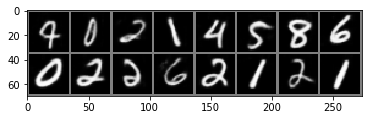

[187/200][0/165] Loss_VAE: 48.3655 KLD: 26.3989 MSE: 21.9666
[187/200][20/165] Loss_VAE: 47.2094 KLD: 25.8794 MSE: 21.3300
[187/200][40/165] Loss_VAE: 48.6008 KLD: 26.8723 MSE: 21.7285
[187/200][60/165] Loss_VAE: 48.7245 KLD: 27.1277 MSE: 21.5968
[187/200][80/165] Loss_VAE: 47.6797 KLD: 26.1911 MSE: 21.4886
[187/200][100/165] Loss_VAE: 48.2149 KLD: 27.0641 MSE: 21.1507
[187/200][120/165] Loss_VAE: 49.4252 KLD: 26.9995 MSE: 22.4257
[187/200][140/165] Loss_VAE: 46.8378 KLD: 25.9783 MSE: 20.8594
[187/200][160/165] Loss_VAE: 48.0383 KLD: 26.7179 MSE: 21.3204


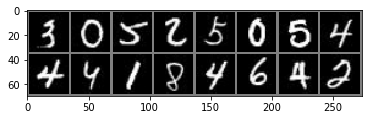

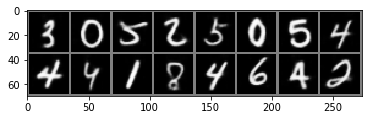

[188/200][0/165] Loss_VAE: 49.2705 KLD: 27.2066 MSE: 22.0639
[188/200][20/165] Loss_VAE: 48.5942 KLD: 26.8219 MSE: 21.7724
[188/200][40/165] Loss_VAE: 48.6140 KLD: 27.0129 MSE: 21.6011
[188/200][60/165] Loss_VAE: 46.9393 KLD: 25.8212 MSE: 21.1181
[188/200][80/165] Loss_VAE: 49.5325 KLD: 27.2420 MSE: 22.2905
[188/200][100/165] Loss_VAE: 46.8363 KLD: 25.8604 MSE: 20.9759
[188/200][120/165] Loss_VAE: 49.7594 KLD: 27.7063 MSE: 22.0530
[188/200][140/165] Loss_VAE: 48.7505 KLD: 26.4849 MSE: 22.2657
[188/200][160/165] Loss_VAE: 48.9306 KLD: 27.0792 MSE: 21.8514


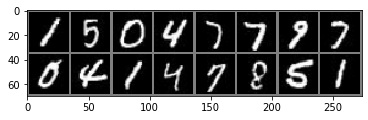

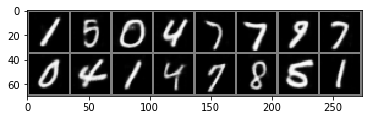

[189/200][0/165] Loss_VAE: 49.6384 KLD: 27.3520 MSE: 22.2864
[189/200][20/165] Loss_VAE: 47.8790 KLD: 26.2230 MSE: 21.6560
[189/200][40/165] Loss_VAE: 49.9975 KLD: 27.2670 MSE: 22.7305
[189/200][60/165] Loss_VAE: 47.7189 KLD: 26.3432 MSE: 21.3757
[189/200][80/165] Loss_VAE: 48.6166 KLD: 26.6650 MSE: 21.9515
[189/200][100/165] Loss_VAE: 48.3019 KLD: 26.8829 MSE: 21.4190
[189/200][120/165] Loss_VAE: 48.2436 KLD: 26.4983 MSE: 21.7453
[189/200][140/165] Loss_VAE: 49.1476 KLD: 27.3239 MSE: 21.8237
[189/200][160/165] Loss_VAE: 50.0315 KLD: 27.6569 MSE: 22.3746


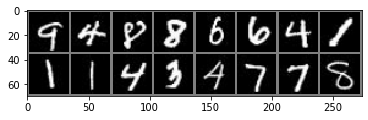

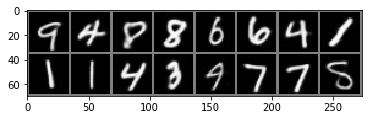

[190/200][0/165] Loss_VAE: 48.7939 KLD: 26.8629 MSE: 21.9311
[190/200][20/165] Loss_VAE: 47.9668 KLD: 26.4268 MSE: 21.5400
[190/200][40/165] Loss_VAE: 47.1526 KLD: 26.5538 MSE: 20.5989
[190/200][60/165] Loss_VAE: 48.2909 KLD: 26.8690 MSE: 21.4219
[190/200][80/165] Loss_VAE: 47.8898 KLD: 25.9220 MSE: 21.9678
[190/200][100/165] Loss_VAE: 48.5188 KLD: 26.5748 MSE: 21.9440
[190/200][120/165] Loss_VAE: 49.2362 KLD: 27.1062 MSE: 22.1300
[190/200][140/165] Loss_VAE: 48.1424 KLD: 26.9186 MSE: 21.2238
[190/200][160/165] Loss_VAE: 47.6474 KLD: 26.2442 MSE: 21.4032


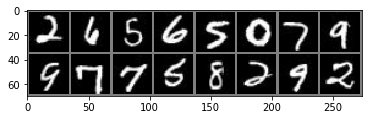

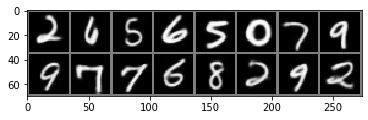

[191/200][0/165] Loss_VAE: 48.7959 KLD: 27.0067 MSE: 21.7892
[191/200][20/165] Loss_VAE: 49.1385 KLD: 27.0288 MSE: 22.1096
[191/200][40/165] Loss_VAE: 48.0333 KLD: 26.3258 MSE: 21.7075
[191/200][60/165] Loss_VAE: 49.1681 KLD: 26.8359 MSE: 22.3322
[191/200][80/165] Loss_VAE: 51.2365 KLD: 27.9858 MSE: 23.2507
[191/200][100/165] Loss_VAE: 48.5591 KLD: 26.5340 MSE: 22.0251
[191/200][120/165] Loss_VAE: 48.3721 KLD: 26.8761 MSE: 21.4960
[191/200][140/165] Loss_VAE: 48.5698 KLD: 26.4576 MSE: 22.1122
[191/200][160/165] Loss_VAE: 49.3508 KLD: 27.0784 MSE: 22.2724


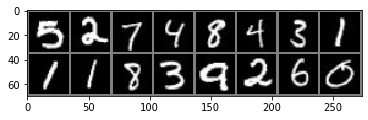

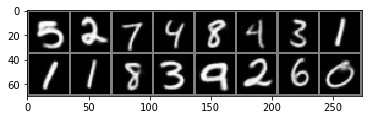

[192/200][0/165] Loss_VAE: 48.4010 KLD: 26.2298 MSE: 22.1712
[192/200][20/165] Loss_VAE: 49.8271 KLD: 27.2554 MSE: 22.5716
[192/200][40/165] Loss_VAE: 47.8399 KLD: 26.7073 MSE: 21.1326
[192/200][60/165] Loss_VAE: 48.4377 KLD: 26.8068 MSE: 21.6309
[192/200][80/165] Loss_VAE: 47.1995 KLD: 26.0456 MSE: 21.1539
[192/200][100/165] Loss_VAE: 50.2168 KLD: 27.2517 MSE: 22.9651
[192/200][120/165] Loss_VAE: 49.2323 KLD: 27.5687 MSE: 21.6636
[192/200][140/165] Loss_VAE: 49.1223 KLD: 26.8574 MSE: 22.2649
[192/200][160/165] Loss_VAE: 47.7228 KLD: 26.6368 MSE: 21.0859


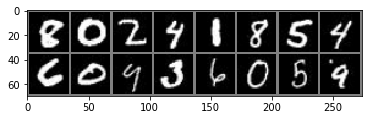

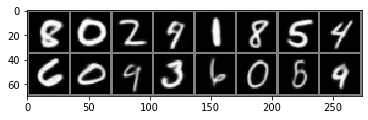

[193/200][0/165] Loss_VAE: 49.4874 KLD: 26.9909 MSE: 22.4965
[193/200][20/165] Loss_VAE: 48.2825 KLD: 26.7175 MSE: 21.5650
[193/200][40/165] Loss_VAE: 48.9238 KLD: 26.8339 MSE: 22.0899
[193/200][60/165] Loss_VAE: 47.6916 KLD: 26.1434 MSE: 21.5482
[193/200][80/165] Loss_VAE: 49.5808 KLD: 27.3549 MSE: 22.2260
[193/200][100/165] Loss_VAE: 50.1261 KLD: 27.2798 MSE: 22.8463
[193/200][120/165] Loss_VAE: 47.6632 KLD: 26.7266 MSE: 20.9366
[193/200][140/165] Loss_VAE: 49.6239 KLD: 27.6307 MSE: 21.9931
[193/200][160/165] Loss_VAE: 47.6273 KLD: 26.4086 MSE: 21.2187


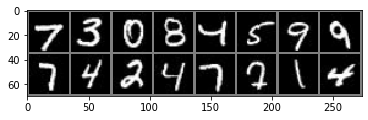

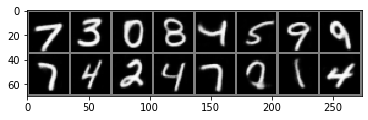

[194/200][0/165] Loss_VAE: 49.3869 KLD: 27.3674 MSE: 22.0194
[194/200][20/165] Loss_VAE: 47.9726 KLD: 26.5284 MSE: 21.4443
[194/200][40/165] Loss_VAE: 48.8689 KLD: 26.7762 MSE: 22.0926
[194/200][60/165] Loss_VAE: 48.7404 KLD: 26.5950 MSE: 22.1455
[194/200][80/165] Loss_VAE: 48.2684 KLD: 26.1109 MSE: 22.1574
[194/200][100/165] Loss_VAE: 48.3437 KLD: 26.6917 MSE: 21.6520
[194/200][120/165] Loss_VAE: 47.8356 KLD: 25.9884 MSE: 21.8473
[194/200][140/165] Loss_VAE: 48.4192 KLD: 26.8690 MSE: 21.5502
[194/200][160/165] Loss_VAE: 47.6804 KLD: 26.6782 MSE: 21.0022


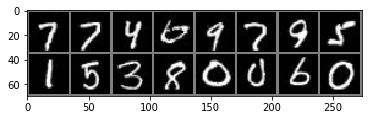

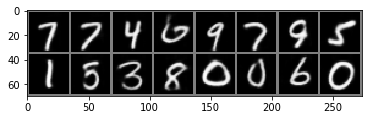

[195/200][0/165] Loss_VAE: 48.8849 KLD: 27.2870 MSE: 21.5979
[195/200][20/165] Loss_VAE: 48.5975 KLD: 26.7873 MSE: 21.8102
[195/200][40/165] Loss_VAE: 47.9911 KLD: 26.2993 MSE: 21.6919
[195/200][60/165] Loss_VAE: 48.4904 KLD: 26.7946 MSE: 21.6959
[195/200][80/165] Loss_VAE: 48.2959 KLD: 26.1984 MSE: 22.0975
[195/200][100/165] Loss_VAE: 47.9497 KLD: 26.4317 MSE: 21.5180
[195/200][120/165] Loss_VAE: 49.1346 KLD: 27.0801 MSE: 22.0545
[195/200][140/165] Loss_VAE: 48.7738 KLD: 27.0653 MSE: 21.7085
[195/200][160/165] Loss_VAE: 48.7554 KLD: 27.0277 MSE: 21.7277


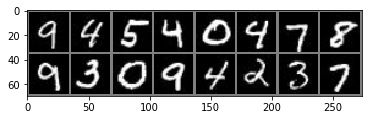

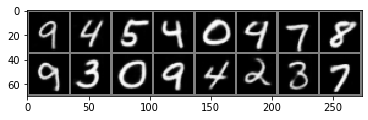

[196/200][0/165] Loss_VAE: 47.7814 KLD: 26.7972 MSE: 20.9843
[196/200][20/165] Loss_VAE: 48.1522 KLD: 26.7780 MSE: 21.3742
[196/200][40/165] Loss_VAE: 47.7116 KLD: 26.7854 MSE: 20.9263
[196/200][60/165] Loss_VAE: 48.3604 KLD: 26.9797 MSE: 21.3807
[196/200][80/165] Loss_VAE: 48.3689 KLD: 26.9055 MSE: 21.4635
[196/200][100/165] Loss_VAE: 48.8666 KLD: 27.1060 MSE: 21.7606
[196/200][120/165] Loss_VAE: 48.4654 KLD: 26.8221 MSE: 21.6433
[196/200][140/165] Loss_VAE: 47.0596 KLD: 26.5258 MSE: 20.5338
[196/200][160/165] Loss_VAE: 50.7763 KLD: 27.6490 MSE: 23.1273


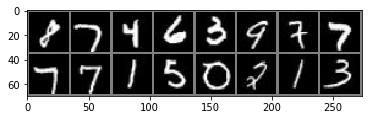

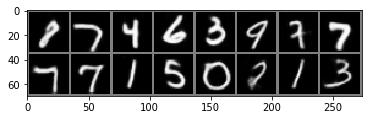

[197/200][0/165] Loss_VAE: 48.7763 KLD: 27.2736 MSE: 21.5027
[197/200][20/165] Loss_VAE: 49.4232 KLD: 27.2651 MSE: 22.1581
[197/200][40/165] Loss_VAE: 49.2784 KLD: 27.2967 MSE: 21.9817
[197/200][60/165] Loss_VAE: 47.2502 KLD: 26.4056 MSE: 20.8446
[197/200][80/165] Loss_VAE: 48.0734 KLD: 26.8699 MSE: 21.2035
[197/200][100/165] Loss_VAE: 49.7791 KLD: 27.3452 MSE: 22.4339
[197/200][120/165] Loss_VAE: 47.6732 KLD: 26.1609 MSE: 21.5123
[197/200][140/165] Loss_VAE: 47.6383 KLD: 25.6602 MSE: 21.9781
[197/200][160/165] Loss_VAE: 48.1507 KLD: 26.0184 MSE: 22.1323


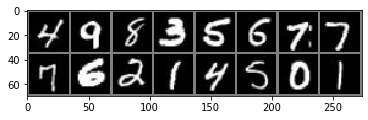

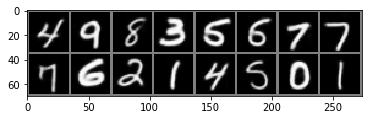

[198/200][0/165] Loss_VAE: 48.7484 KLD: 26.8784 MSE: 21.8700
[198/200][20/165] Loss_VAE: 48.2609 KLD: 26.5602 MSE: 21.7008
[198/200][40/165] Loss_VAE: 49.2409 KLD: 27.0959 MSE: 22.1450
[198/200][60/165] Loss_VAE: 49.5321 KLD: 26.9210 MSE: 22.6111
[198/200][80/165] Loss_VAE: 47.7893 KLD: 26.2995 MSE: 21.4899
[198/200][100/165] Loss_VAE: 48.1858 KLD: 26.6910 MSE: 21.4949
[198/200][120/165] Loss_VAE: 48.6344 KLD: 26.5170 MSE: 22.1174
[198/200][140/165] Loss_VAE: 48.8256 KLD: 26.8114 MSE: 22.0142
[198/200][160/165] Loss_VAE: 48.2588 KLD: 26.9811 MSE: 21.2776


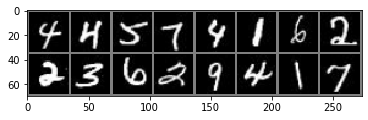

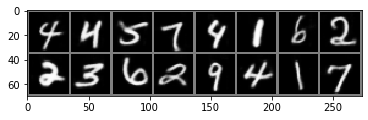

[199/200][0/165] Loss_VAE: 47.1111 KLD: 26.3245 MSE: 20.7865
[199/200][20/165] Loss_VAE: 48.4194 KLD: 27.1092 MSE: 21.3102
[199/200][40/165] Loss_VAE: 48.3884 KLD: 26.5021 MSE: 21.8863
[199/200][60/165] Loss_VAE: 48.0238 KLD: 26.4538 MSE: 21.5700
[199/200][80/165] Loss_VAE: 48.4533 KLD: 26.8084 MSE: 21.6448
[199/200][100/165] Loss_VAE: 48.1633 KLD: 26.8276 MSE: 21.3357
[199/200][120/165] Loss_VAE: 48.9848 KLD: 27.5316 MSE: 21.4532
[199/200][140/165] Loss_VAE: 48.3356 KLD: 26.4075 MSE: 21.9281
[199/200][160/165] Loss_VAE: 49.6533 KLD: 27.3884 MSE: 22.2650


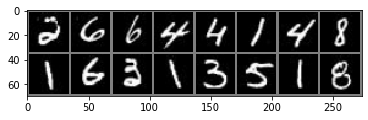

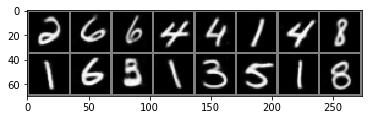

In [26]:
# ここから学習部分
# 繰り返し回数はoptionで設定、デフォルトは25
loss = []

for epoch in range(opt['niter']):
    for i, data in enumerate(dataloaders, 0):
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        # 先にDiscriminatorを訓練する
        # data中の画像をreal、ノイズをfakeとしてrealが1になるように訓練していく
        
        # train with real
        # 勾配をゼロに初期化
        netD.zero_grad()
        # dataから画像をとってくる
        real_cpu = data
        # 画像数をバッチサイズとする
        # バッチサイズはdataloaderで定義されているので、その数分出てくる
        batch_size = real_cpu.size(0)
        # 画像をリサイズしている？
        # https://discuss.pytorch.org/t/runtimeerror-set-sizes-contiguous-is-not-allowed-on-tensor-created-from-data-or-detach-in-pytorch-1-1-0/44208
        #input.data.resize_(real_cpu.size()).copy_(real_cpu)
        with torch.no_grad():
            input.resize_(real_cpu.size()).copy_(real_cpu)

        ############################
        # (2) Update G network: VAE
        ###########################
        # VAE部分の学習
        
        # 勾配の初期化
        netG.zero_grad()
        
        # まずencoderに通して二つのベクトル（平均値ベクトルと対数分散ベクトル）を得る
        encoded = netG.encoder(input)
        # 得られたベクトルをmu,logvarに入れてreparameterization trickにかける
        mu = encoded[0]
        logvar = encoded[1]
        
        # samplerに行く前にKL divergenceを計算する
        # なぜKLDを計算して損失関数に加えるのかは以下のサイトを参照
        # https://qiita.com/nishiha/items/2264da933504fbe3fc68
        # http://aidiary.hatenablog.com/entry/20180228/1519828344
        #KLD_element = mu.pow(2).add_(logvar.exp()).mul_(-1).add_(1).add_(logvar)
        #KLD = torch.sum(KLD_element).mul_(-0.5)
        KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
        # 出力をsamplerに通して結果を得る
        sampled = netG.sampler(encoded)
        # samplerの出力をdecoderに通して画像を得る
        rec = netG.decoder(sampled)
        #rec_win = vis.image(rec.data[0].cpu()*0.5+0.5,win = rec_win)

        # 出力画像と入力画像の誤差をMSEで計算
        MSEerr = MSECriterion(rec,input)
        
        # MSEにKLDを加えてVAEの誤差とする
        VAEerr = KLD + MSEerr;
        # 逆伝播
        VAEerr.backward()
        # 重みを更新
        optimizerG.step()


        if i%20==0:
            #out = torchvision.utils.make_grid(input.data[0:16].cpu()) # https://blog.shikoan.com/torchvision-image-tile/
            #imshow(out)
            #rec_out = torchvision.utils.make_grid(rec.data[0:16].cpu())
            #imshow(rec_out)
            print('[%d/%d][%d/%d] Loss_VAE: %.4f KLD: %.4f MSE: %.4f'
                  % (epoch, opt['niter'], i, len(dataloaders),
                     VAEerr.data/batch_size, KLD.data/batch_size, MSEerr.data/batch_size))
    loss.append([VAEerr.data/batch_size, KLD.data/batch_size, MSEerr.data/batch_size])
    out = torchvision.utils.make_grid(input.data[0:32].cpu()) # https://blog.shikoan.com/torchvision-image-tile/
    imshow(out)
    rec_out = torchvision.utils.make_grid(rec.data[0:32].cpu())
    imshow(rec_out)
    # 指定の間隔でモデルの保存
    # もとのコードだと想定通りの保存の仕方にならない
    # epochは0はじまりなので、適切に保存するにはepoch+1でないといけない
    if (epoch+1)%opt['saveInt'] == 0 and epoch!=0:
        torch.save(netG.state_dict(), '%s/netG_epoch_%d.pth' % (opt['outf'], epoch))
        torch.save(netD.state_dict(), '%s/netD_epoch_%d.pth' % (opt['outf'], epoch))

In [63]:
# errorプロットのためのデータ作成
x_plot = np.arange(1,201)
VAEerr_plot = []
KLD_plot = []
MSEerr_plot = []
for x in loss:
    VAEerr_plot.append(x[0].cpu().numpy())
    KLD_plot.append(x[1].cpu().numpy())
    MSEerr_plot.append(x[2].cpu().numpy())

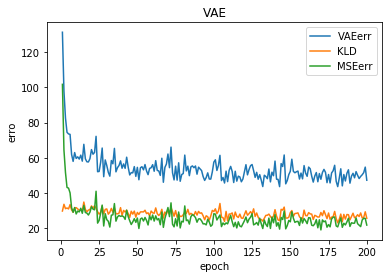

In [64]:
# errorの推移を表示
import matplotlib.pyplot as plt
plt.plot(x_plot,VAEerr_plot,label="VAEerr")
plt.plot(x_plot,KLD_plot, label="KLD")
plt.plot(x_plot,MSEerr_plot, label="MSEerr")
plt.xlabel("epoch")
plt.ylabel("erro")
plt.title('VAE')
plt.legend()
plt.show()